## Importing the relevant libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings, joblib, gc, re, time
warnings.filterwarnings('ignore')
from scipy.stats import probplot
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor, BaggingRegressor, VotingRegressor, StackingRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, BayesianRidge, HuberRegressor, PassiveAggressiveRegressor, SGDRegressor, PoissonRegressor, RANSACRegressor, TheilSenRegressor, GammaRegressor, ARDRegression, TweedieRegressor
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.svm import SVR, LinearSVR, NuSVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor, XGBRFRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from ngboost import NGBRegressor
from sklearn.neural_network import MLPRegressor
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.preprocessing import StandardScaler, FunctionTransformer, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_regression, SelectPercentile, SelectFromModel, RFE, SequentialFeatureSelector
from mlxtend.plotting import plot_decision_regions
from feature_engine.outliers import Winsorizer
from sklearn.pipeline import Pipeline
from feature_engine.selection import DropConstantFeatures, DropDuplicateFeatures, DropCorrelatedFeatures
from sklearn.impute import SimpleImputer
from yellowbrick.regressor import PredictionError, ResidualsPlot

## Loading the dataset

In [ ]:
df = pd.read_excel('Superstore.xlsx')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,...,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,1,CA-2013-152156,2013-11-09,2013-11-12,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2,0.00,41.9136
1,2,CA-2013-152156,2013-11-09,2013-11-12,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,...,42420,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,3,0.00,219.5820
2,3,CA-2013-138688,2013-06-13,2013-06-17,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,...,90036,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2,0.00,6.8714
3,4,US-2012-108966,2012-10-11,2012-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,5,0.45,-383.0310
4,5,US-2012-108966,2012-10-11,2012-10-18,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,...,33311,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2,0.20,2.5164


## Data Exploration

In [ ]:
df.shape

(9994, 21)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Row ID         9994 non-null   int64         
 1   Order ID       9994 non-null   object        
 2   Order Date     9994 non-null   datetime64[ns]
 3   Ship Date      9994 non-null   datetime64[ns]
 4   Ship Mode      9994 non-null   object        
 5   Customer ID    9994 non-null   object        
 6   Customer Name  9994 non-null   object        
 7   Segment        9994 non-null   object        
 8   Country        9994 non-null   object        
 9   City           9994 non-null   object        
 10  State          9994 non-null   object        
 11  Postal Code    9994 non-null   int64         
 12  Region         9994 non-null   object        
 13  Product ID     9994 non-null   object        
 14  Category       9994 non-null   object        
 15  Sub-Category   9994 n

In [ ]:
df.drop('Row ID', axis=1, inplace=True)

In [ ]:
df.nunique() / len(df)

,0
Order ID,0.501201
Order Date,0.123874
Ship Date,0.133480
Ship Mode,0.000400
Customer ID,0.079348
Customer Name,0.079348
Segment,0.000300
Country,0.000100
City,0.053132
State,0.004903


In [ ]:
df.isna().sum()

,0
Order ID,0
Order Date,0
Ship Date,0
Ship Mode,0
Customer ID,0
Customer Name,0
Segment,0
Country,0
City,0
State,0


In [ ]:
df.duplicated().sum()

1

In [ ]:
df = df.drop_duplicates()
df.shape

(9993, 20)

In [ ]:
df.drop(['Order ID','Customer ID','Customer Name','Product ID'],axis=1,inplace=True)

## Exploratory Data Analysis

### Univariate Analysis

Skewness of Postal Code: -0.12862858810335934
Kurtosis of Postal Code: -1.4931118549547797


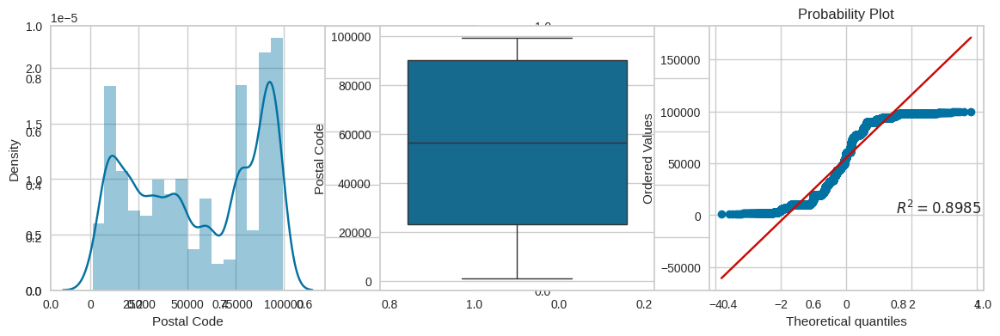

Skewness of Sales: 12.972141558363262
Kurtosis of Sales: 305.28176970634985


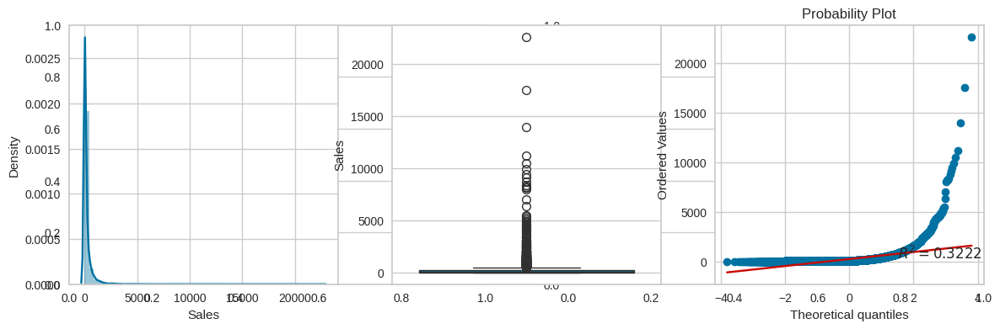

Skewness of Quantity: 1.2784155399852233
Kurtosis of Quantity: 1.9915827160047757


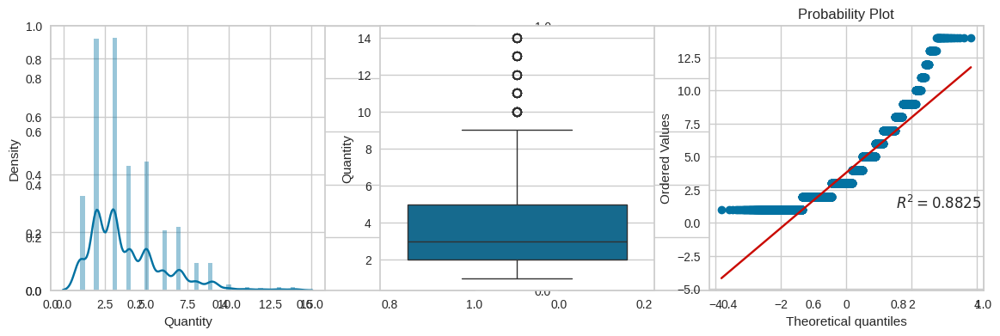

Skewness of Discount: 1.6845084876700462
Kurtosis of Discount: 2.409976524801519


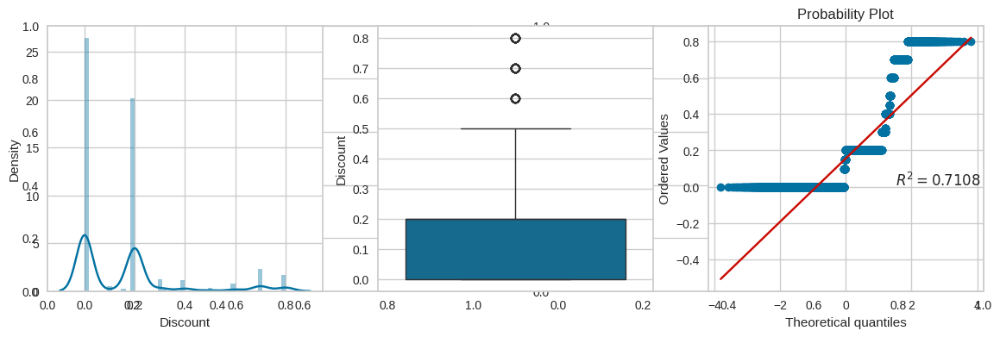

Skewness of Profit: 7.561035996041436
Kurtosis of Profit: 397.15038474389223


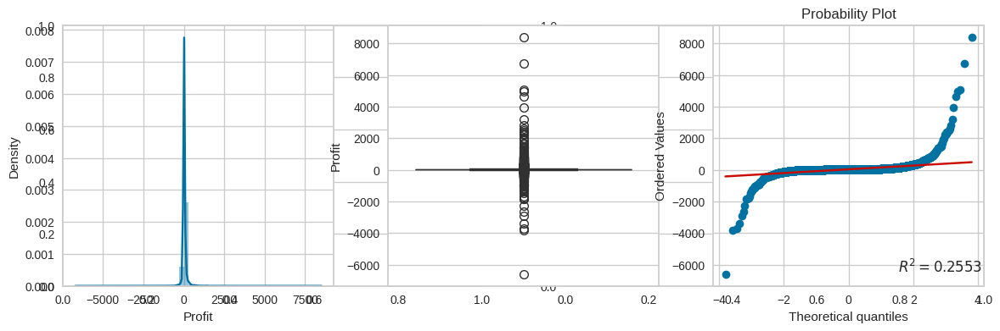

In [ ]:
for col in df.select_dtypes(np.number).columns:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [ ]:
skewed_cols = ['Quantity','Discount','Profit']

In [ ]:
df['Country'].value_counts()

,count
Country,
United States,9993


In [ ]:
df.drop('Country', axis=1, inplace=True)

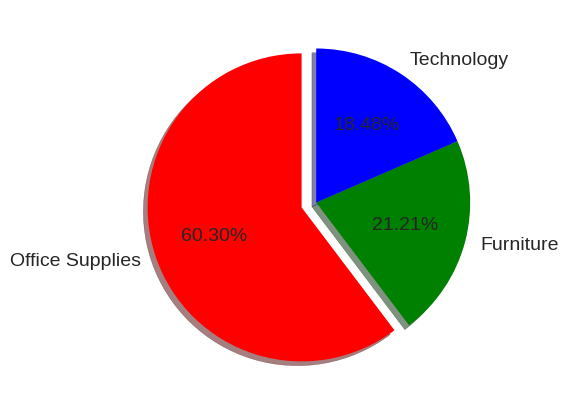

In [ ]:
plt.figure(figsize=(10,5))
labels = df['Category'].value_counts().keys()
values = df['Category'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0,0],startangle=90,textprops={'fontsize': 14},colors=['red','green','blue'])
plt.show()

Majority of the products are in Office Supplies category whereas the least number of products are in Technology category.

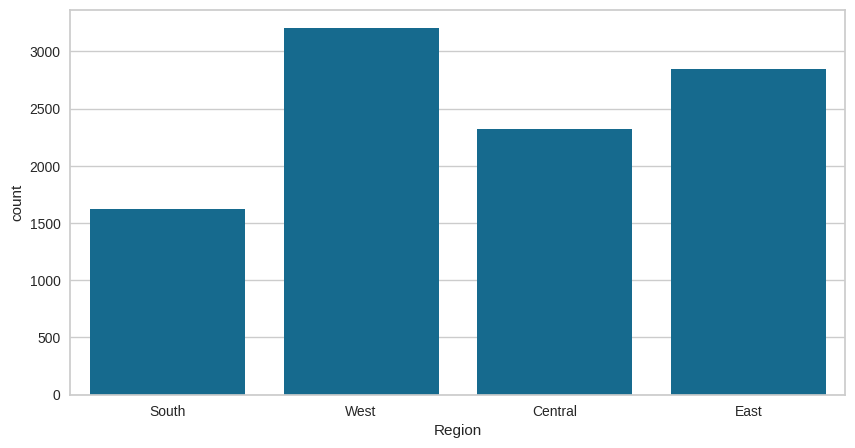

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='Region',data=df)
plt.show()

A significant number of customers belong to the Western region while the Southern region has the least number of customers.

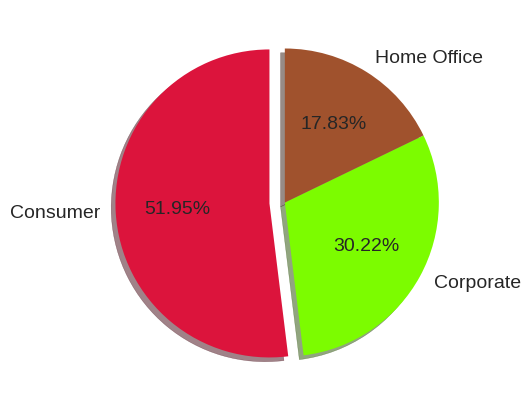

In [ ]:
plt.figure(figsize=(10,5))
labels = df['Segment'].value_counts().keys()
values = df['Segment'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0,0],startangle=90,textprops={'fontsize': 14},colors=['crimson','lawngreen','sienna'])
plt.show()

More than half of the entire population belongs to the Consumer segment.

In [ ]:
df['Ship Mode'].value_counts()

,count
Ship Mode,
Standard Class,5967
Second Class,1945
First Class,1538
Same Day,543


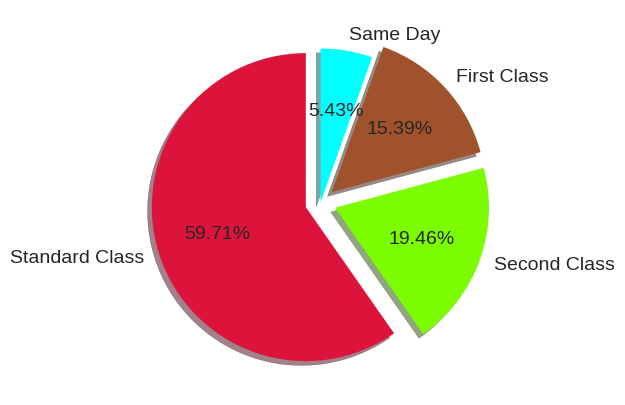

In [ ]:
plt.figure(figsize=(10,5))
labels = df['Ship Mode'].value_counts().keys()
values = df['Ship Mode'].value_counts().values

plt.pie(values,labels=labels,autopct='%1.2f%%',shadow=True,explode=[0.1,0.1,0.1,0],startangle=90,textprops={'fontsize': 14},colors=['crimson','lawngreen','sienna','cyan'])
plt.show()

A significant number of orders were delivered via the Standard shipping mode whereas First Class and Second Class shipping modes were less frequently used.

### Bivariate Analysis

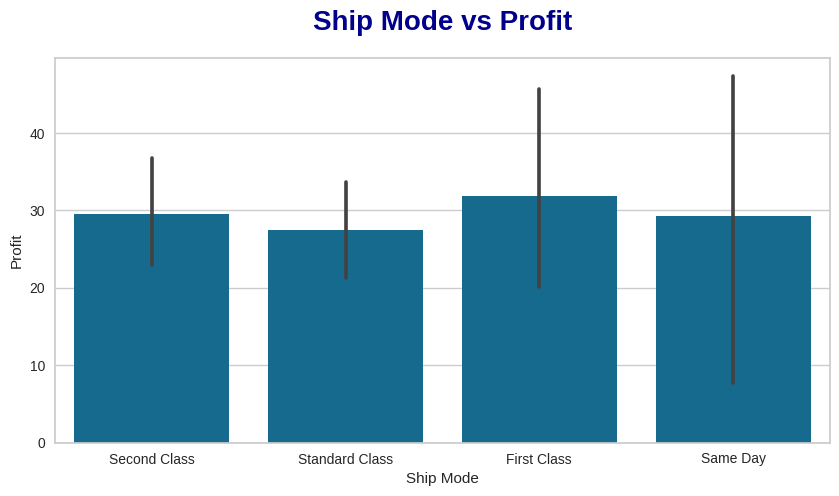

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Profit',data=df)
plt.title('Ship Mode vs Profit',pad=20,fontsize=20,color='darkblue',fontweight='bold')
plt.show()

The First Class was the most profitable shipping mode while the Standard shipping mode was the least profitable.

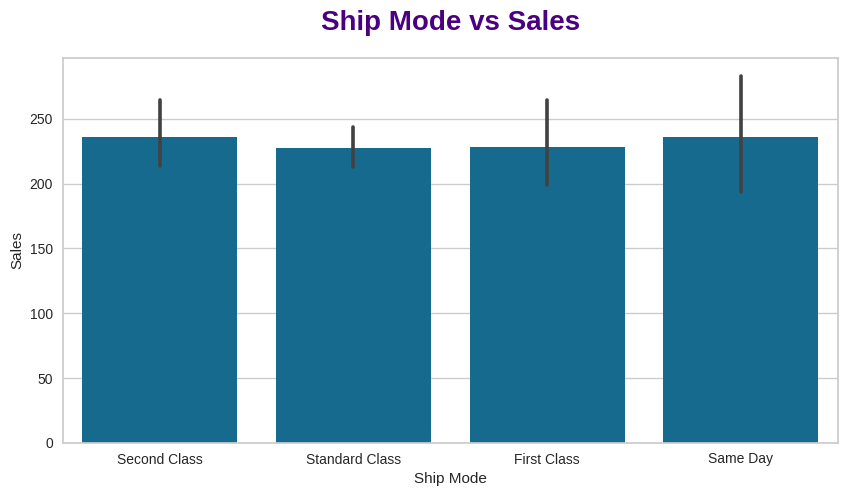

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Sales',data=df)
plt.title('Ship Mode vs Sales',pad=20,fontsize=20,fontweight='bold',color='indigo')
plt.show()

The shipping modes that generated the highest sales are Second Class and Same Day whereas Standard Class and First Class generated the least sales.

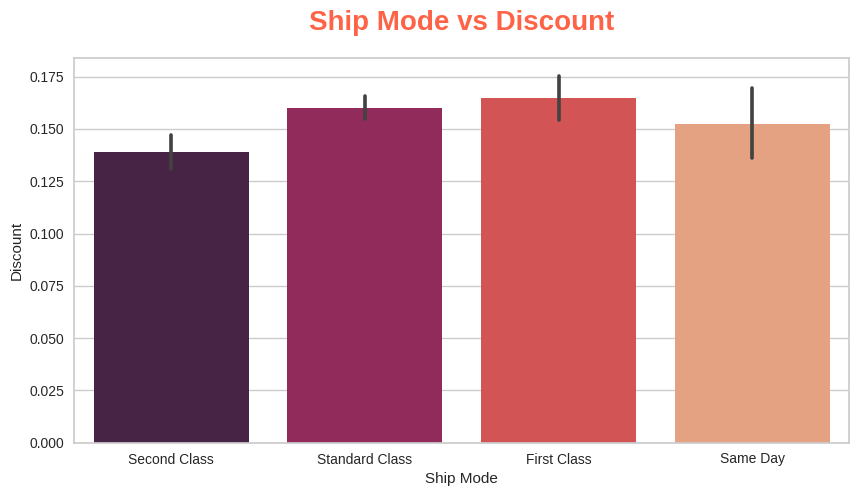

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Discount',data=df,palette='rocket')
plt.title('Ship Mode vs Discount',pad=20,fontsize=20,fontweight='bold',color='tomato')
plt.show()

The maximum discount was offered on products that were delivered via the First Class shipping mode whereas the minimum discount was given on products that were shipped via the Second Class.

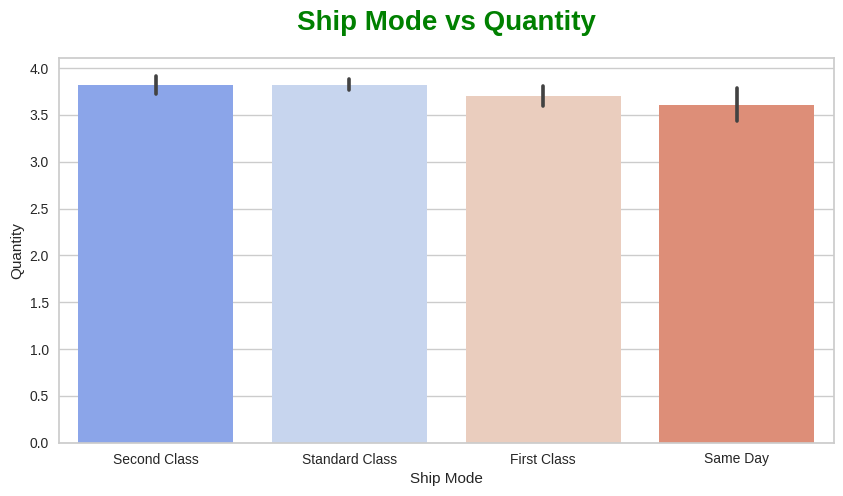

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Ship Mode',y='Quantity',data=df,palette='coolwarm')
plt.title('Ship Mode vs Quantity',pad=20,fontsize=20,fontweight='bold',color='green')
plt.show()

The highest quantities of products were shipped via the Second Class and Standard Class shipping modes whereas the least quantities were shipped through the Same Day shipping mode.

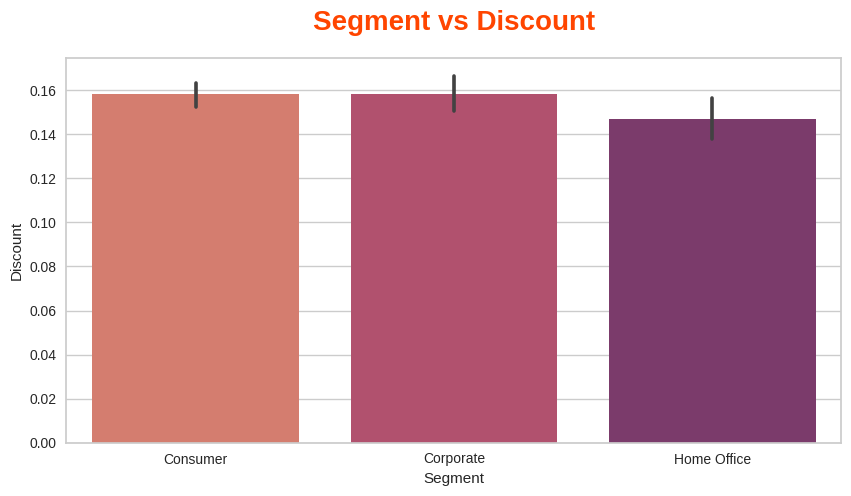

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Discount',data=df,palette='flare')
plt.title('Segment vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

The highest discount was given on the orders made by Consumer and Corporate segments whereas those made by Home Office provided the least discount.

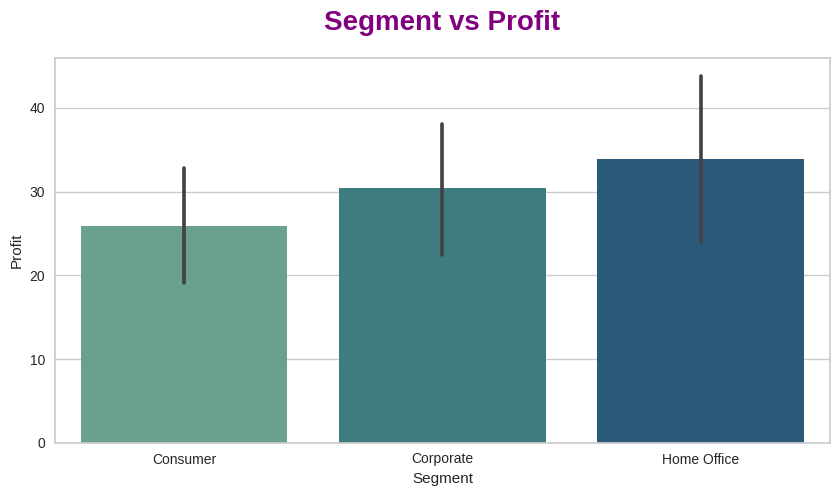

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Profit',data=df,palette='crest')
plt.title('Segment vs Profit',pad=20,fontsize=20,fontweight='bold',color='purple')
plt.show()

The orders made by Home Office segment generated the highest profit whereas those made by Consumer and Corporate segments generated the least profit.

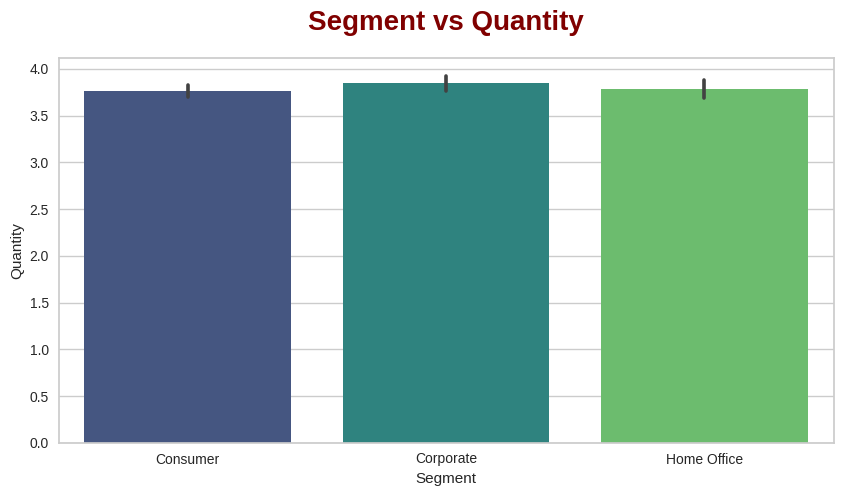

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Quantity',data=df,palette='viridis')
plt.title('Segment vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased by the Corporate segment whereas the lowest quantities were purchased by the Consumer segment.

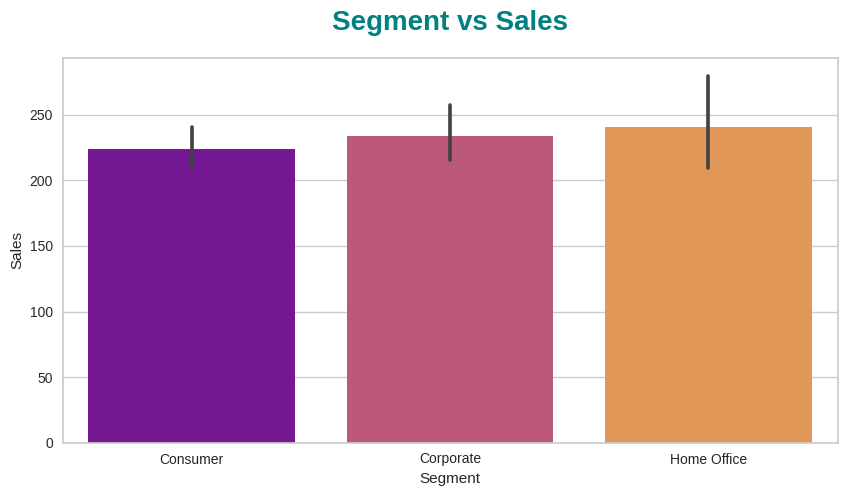

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Segment',y='Sales',data=df,palette='plasma')
plt.title('Segment vs Sales',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The orders made by the Home Office segment generated the maximum sales whereas those made by the Consumer segment generated the minimum sales.

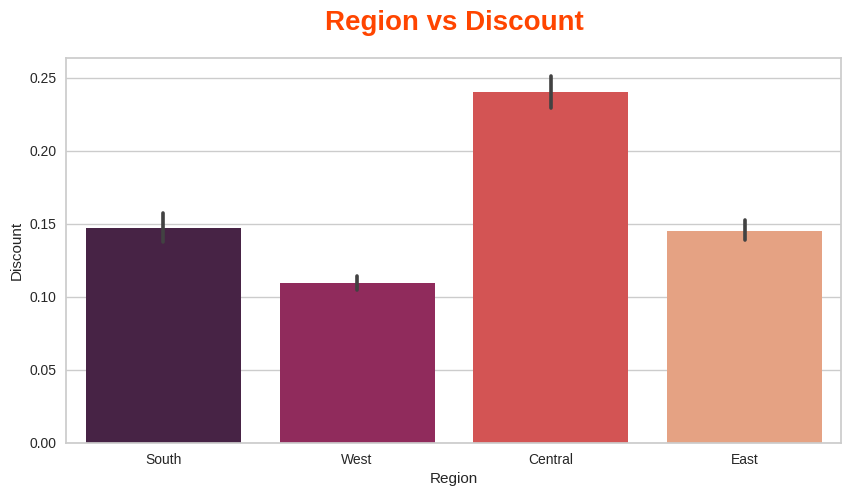

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Discount',data=df,palette='rocket')
plt.title('Region vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A substantial discount was offered on the orders made in the Central region whereas the least discount was given on those made in the Western region.

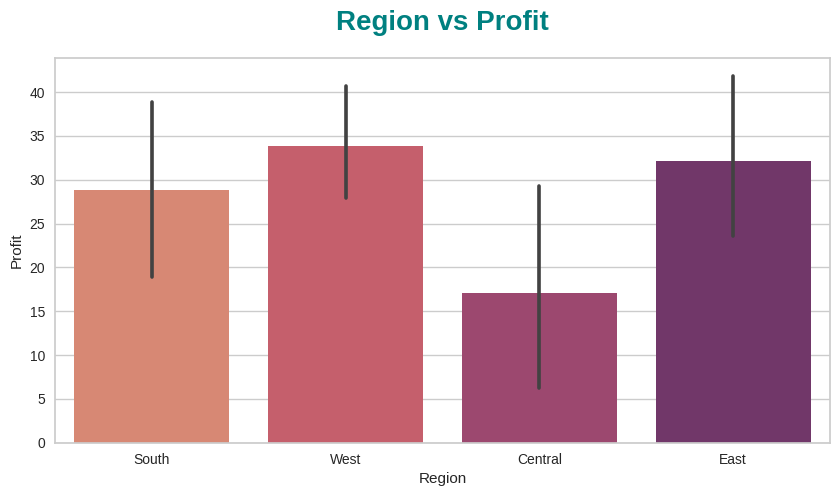

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Profit',data=df,palette='flare')
plt.title('Region vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The largest profit was recorded in the Western region while the lowest profit was obtained in the Central region.

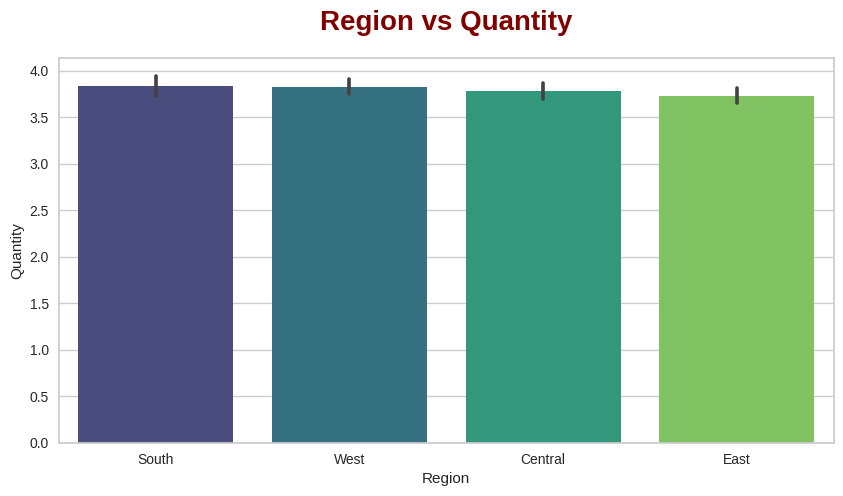

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Quantity',data=df,palette='viridis')
plt.title('Region vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

The highest quantities of products were purchased in the Southern and Western regions whereas the lowest quantities were ordered in the Eastern region. However, there is overall a minimal difference in the quantities of products ordered across all regions.

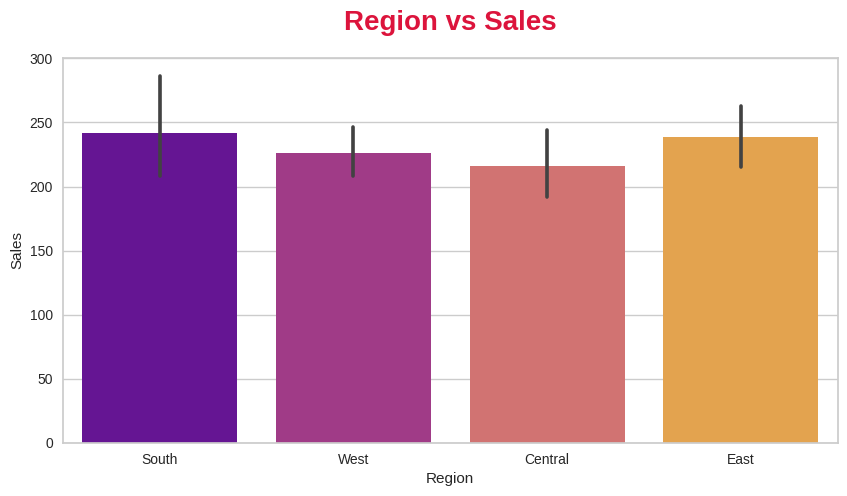

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Region',y='Sales',data=df,palette='plasma')
plt.title('Region vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The highest sales were recorded in the South and East regions while the lowest sales were observed in the Central region.

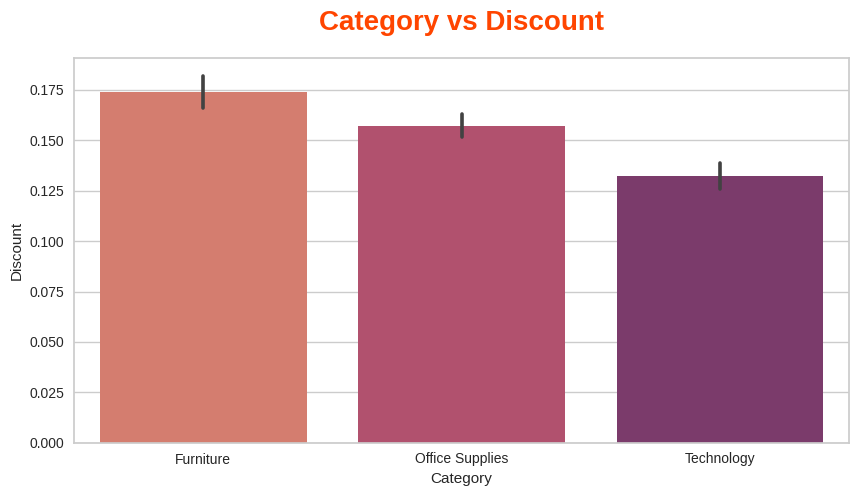

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Discount',data=df,palette='flare')
plt.title('Category vs Discount',pad=20,fontsize=20,fontweight='bold',color='orangered')
plt.show()

A significant discount was provided on furniture products whereas the least discount was given on technology products.

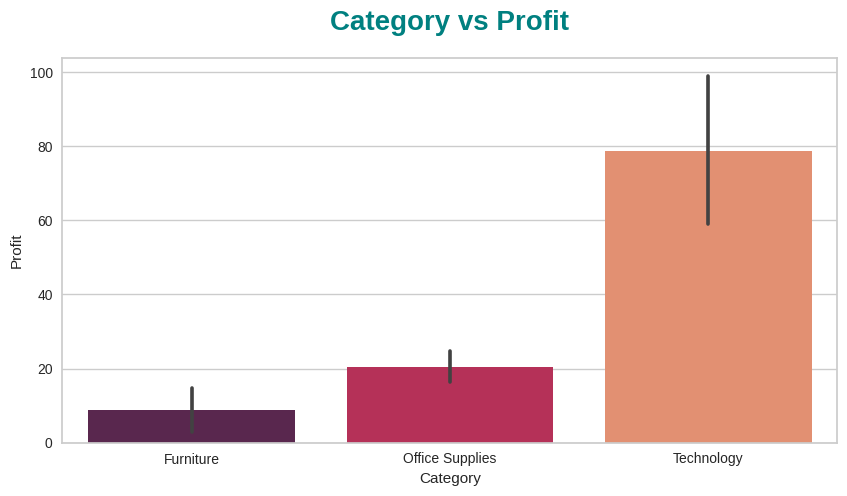

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Profit',data=df,palette='rocket')
plt.title('Category vs Profit',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()

The products belonging to the Technology category are the most profitable while the products belonging to the Furniture category are the least profitable.

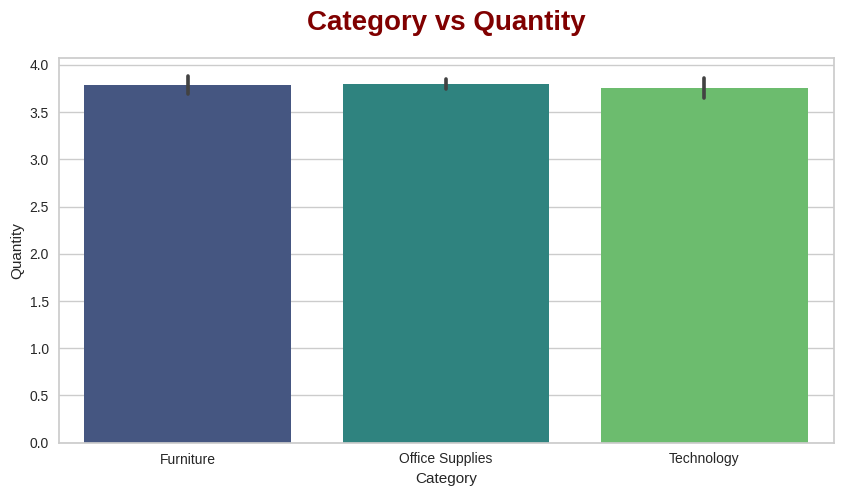

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Quantity',data=df,palette='viridis')
plt.title('Category vs Quantity',pad=20,fontsize=20,fontweight='bold',color='maroon')
plt.show()

All categories have almost similar quantities of products ordered.

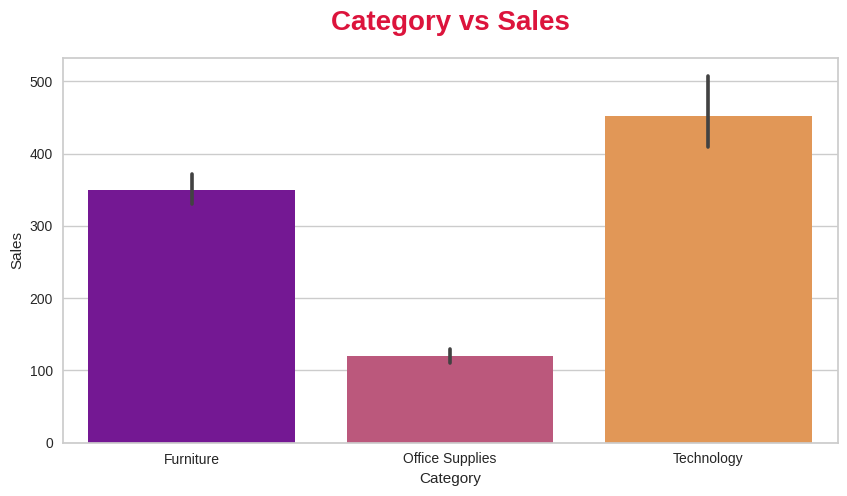

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='Category',y='Sales',data=df,palette='plasma')
plt.title('Category vs Sales',pad=20,fontsize=20,fontweight='bold',color='crimson')
plt.show()

The maximum sales were recorded in the Technology category while the lowest sales were obtained in the Office Supplies category.

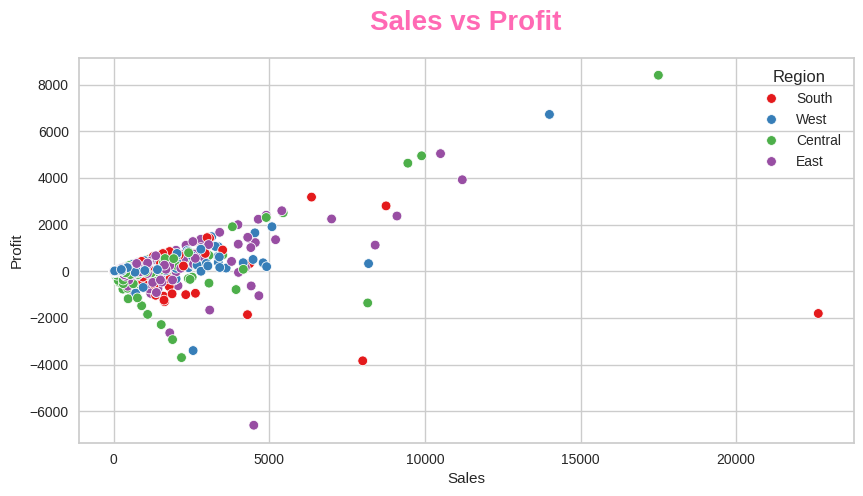

48060

In [ ]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Region',palette='Set1')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()
plt.close('all')
del fig
gc.collect()

The Western region recorded the lowest sales and profit among all regions whereas the Eastern region generated a considerable profit in general across all regions.

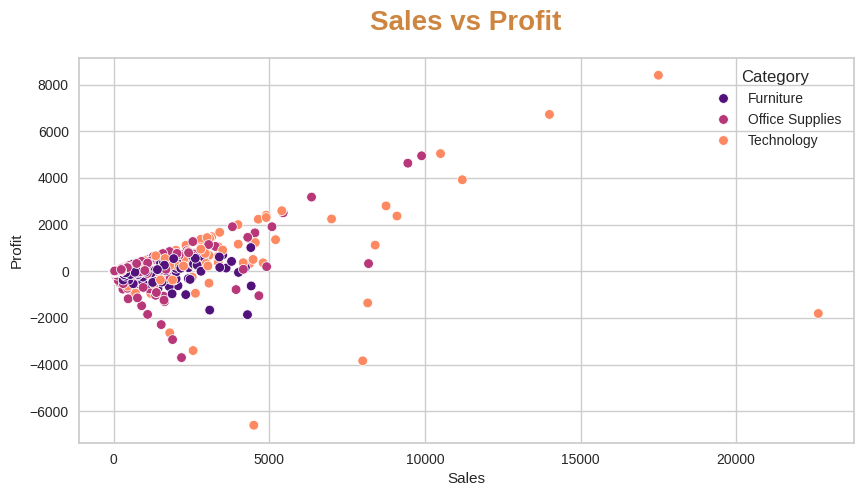

24035

In [ ]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Category',palette='magma')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='peru')
plt.show()
plt.close('all')
del fig
gc.collect()

It is clearly evident from the above plot that the highest profit was obtained in the Technology category whereas the lowest profit was obtained in the Office Supplies category.

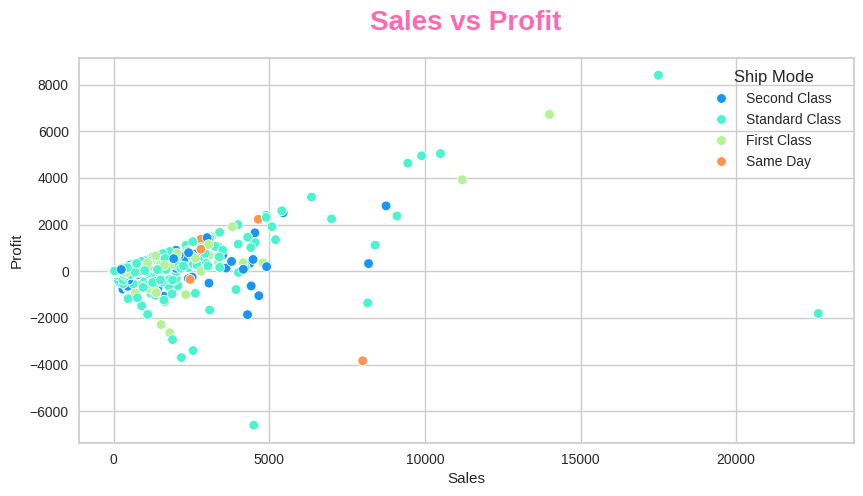

4235

In [ ]:
plt.figure(figsize=(10,5))
fig = sns.scatterplot(x='Sales',y='Profit',data=df,hue='Ship Mode',palette='rainbow')
plt.title('Sales vs Profit',pad=20,fontsize=20,fontweight='bold',color='hotpink')
plt.show()
plt.close('all')
del fig
gc.collect()

The highest sales and profit were recorded in the orders delivered via the Standard Class shipping mode while the Second Class shipping mode was the least profitable.

### Multivariate Analysis

In [ ]:
plt.figure(figsize=(10,5))
fig = sns.heatmap(df.corr(),annot=True,cmap='RdYlGn',vmin=-1.0,vmax=1.0)
plt.title('Correlation Heatmap',pad=20,fontsize=20,fontweight='bold',color='teal')
plt.show()
plt.close('all')
del fig
gc.collect()

ValueError: could not convert string to float: 'Second Class'

<Figure size 1000x500 with 0 Axes>

In [ ]:
plt.figure(figsize=(10,5))
fig = sns.clustermap(df.corr())
plt.title('Clustermap',pad=20,fontsize=20,fontweight='bold',color='sienna')
plt.show()
plt.close('all')
del fig
gc.collect()

In [ ]:
plt.figure(figsize=(10,5))
fig = sns.pairplot(df.sample(n=5000),hue='Ship Mode',palette='RdBu')
plt.show()
plt.close('all')
del fig
gc.collect()

## Feature Engineering

### Feature Extraction

In [ ]:
df['Profit Margin'] = df['Profit']/df['Sales']
df['Discounted Profit'] = df['Profit']-df['Profit']*df['Discount']
df['Discount Percentage'] = df['Discount']/df['Sales']*100
df['Operating Expenses'] = df['Sales'] - df['Profit']
df['Net Profit'] = df['Profit'] - df['Discount']

In [ ]:
df['Order Date'] = pd.to_datetime(df['Order Date'],errors='coerce')
df['Ship Date'] = pd.to_datetime(df['Ship Date'],errors='coerce')

In [ ]:
df['Order Year'] = df['Order Date'].dt.year
df['Order Month'] = df['Order Date'].dt.month
df['Order Day'] = df['Order Date'].dt.day
df['Order Weekday'] = df['Order Date'].dt.dayofweek
df['Ship Year'] = df['Ship Date'].dt.year
df['Ship Month'] = df['Ship Date'].dt.month
df['Ship Day'] = df['Ship Date'].dt.day
df['Ship Weekday'] = df['Ship Date'].dt.dayofweek
df.drop(['Order Date','Ship Date'],axis=1,inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9993 entries, 0 to 9993
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Ship Mode            9993 non-null   object 
 1   Segment              9993 non-null   object 
 2   City                 9993 non-null   object 
 3   State                9993 non-null   object 
 4   Postal Code          9993 non-null   int64  
 5   Region               9993 non-null   object 
 6   Category             9993 non-null   object 
 7   Sub-Category         9993 non-null   object 
 8   Product Name         9993 non-null   object 
 9   Sales                9993 non-null   float64
 10  Quantity             9993 non-null   int64  
 11  Discount             9993 non-null   float64
 12  Profit               9993 non-null   float64
 13  Profit Margin        9993 non-null   float64
 14  Discounted Profit    9993 non-null   float64
 15  Discount Percentage  9993 non-null   float6

### Categorical Encoding

In [ ]:
df['Ship Mode'].unique()

array(['Second Class', 'Standard Class', 'First Class', 'Same Day'],
      dtype=object)

In [ ]:
df['Segment'].unique()

array(['Consumer', 'Corporate', 'Home Office'], dtype=object)

In [ ]:
df['Category'].unique()

array(['Furniture', 'Office Supplies', 'Technology'], dtype=object)

In [ ]:
df['Sub-Category'].unique()

array(['Bookcases', 'Chairs', 'Labels', 'Tables', 'Storage',
       'Furnishings', 'Art', 'Phones', 'Binders', 'Appliances', 'Paper',
       'Accessories', 'Envelopes', 'Fasteners', 'Supplies', 'Machines',
       'Copiers'], dtype=object)

In [ ]:
df['Product Name'].nunique()

1841

In [ ]:
df['City'].nunique()

531

In [ ]:
df['State'].nunique()

49

In [ ]:
df['Region'].unique()

array(['South', 'West', 'Central', 'East'], dtype=object)

In [ ]:
def onehotencode(data: pd.DataFrame,col: str) -> pd.DataFrame:
    encoder = OneHotEncoder(drop='first',sparse_output=False,max_categories=10)
    encoded_data = encoder.fit_transform(data[[col]])
    encoded_data = pd.DataFrame(encoded_data,columns=encoder.get_feature_names_out())
    return encoded_data

In [ ]:
for col in ['Ship Mode','Segment','State','City','Region','Category','Sub-Category','Product Name']:
    encoded_data = onehotencode(df,col)
    df = pd.concat([df,encoded_data],axis=1)
    df.drop(col,axis=1,inplace=True)

In [ ]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity','Profit','Discounted Profit','Net Profit']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Profit Margin','Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity', 'Profit', 'Discounted Profit',
                                  'Net Profit']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Profit Margin', 'Discount Percentage',
                                  'Operating Expenses'])])

### Feature Transformation

In [ ]:
skewed_cols = ['Quantity',
 'Discount',
 'Profit',
 'Profit Margin',
 'Discounted Profit',
 'Discount Percentage',
 'Operating Expenses',
 'Net Profit',
 'Order Day',
 'Order Weekday',
 'Order Month',
 'Ship Day']

Skewness of Quantity: 1.2784155399852233
Kurtosis of Quantity: 1.9915827160047757


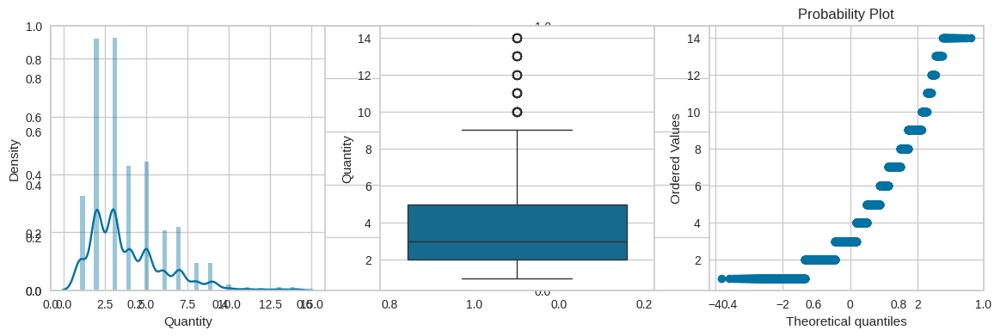

Skewness of Discount: 1.6845084876700462
Kurtosis of Discount: 2.409976524801519


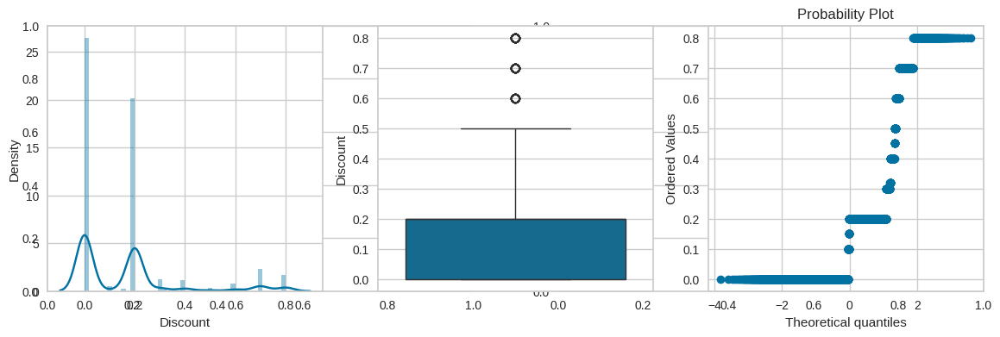

Skewness of Profit: 7.561035996041436
Kurtosis of Profit: 397.15038474389223


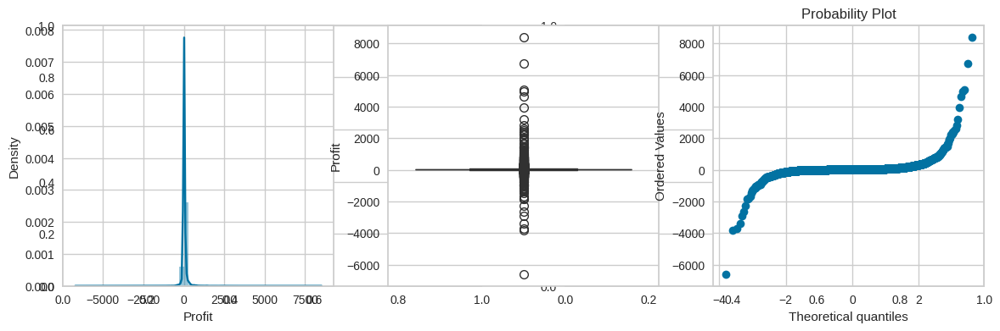

Skewness of Profit Margin: -2.894835315865789
Kurtosis of Profit Margin: 10.172752622828092


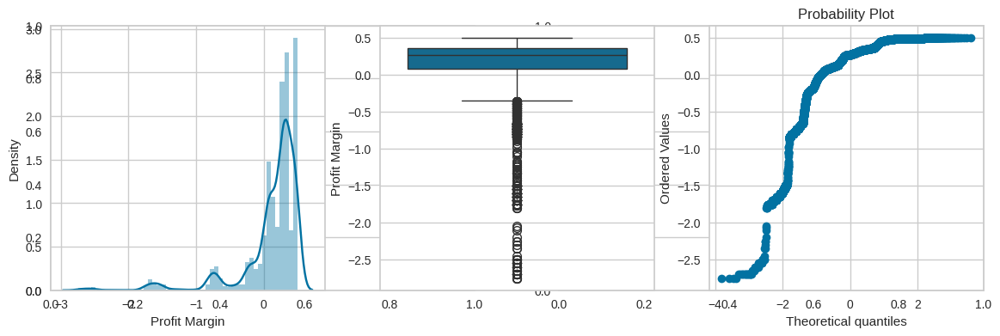

Skewness of Discounted Profit: 19.35659799419806
Kurtosis of Discounted Profit: 617.6369152241313


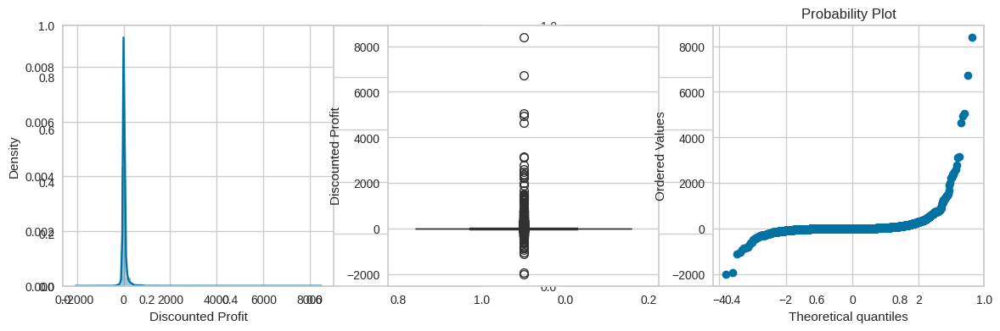

Skewness of Discount Percentage: 10.828151381652273
Kurtosis of Discount Percentage: 188.85920639655157


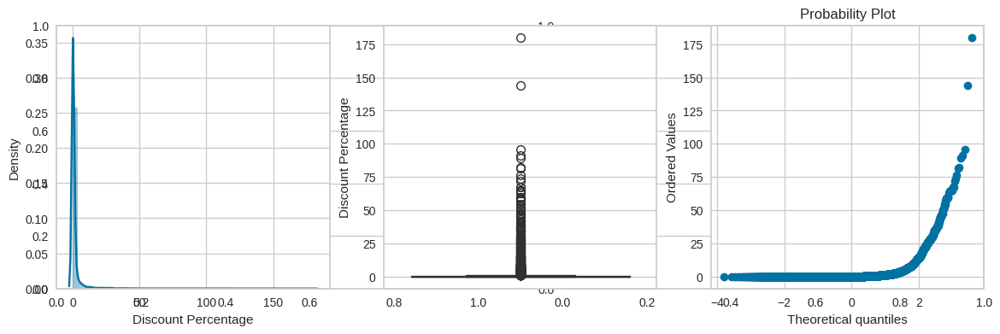

Skewness of Operating Expenses: 14.752446377055431
Kurtosis of Operating Expenses: 454.5499992208234


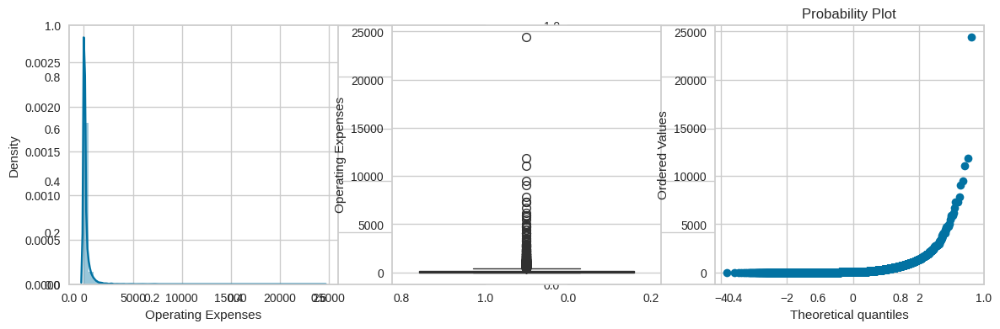

Skewness of Net Profit: 7.555768996026929
Kurtosis of Net Profit: 396.9091881919584


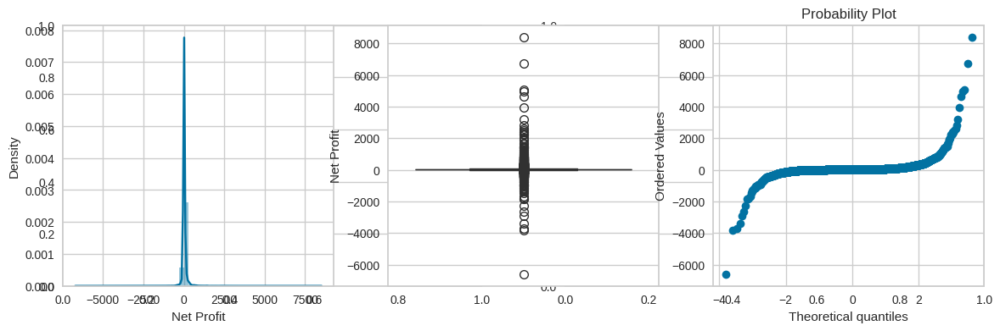

Skewness of Order Day: 0.013550065823461663
Kurtosis of Order Day: -1.1861898468255059


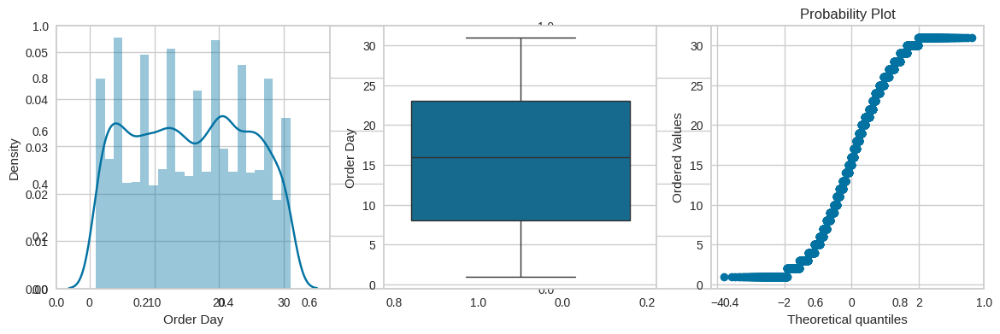

Skewness of Order Weekday: 0.12340952691336028
Kurtosis of Order Weekday: -1.0869179921056922


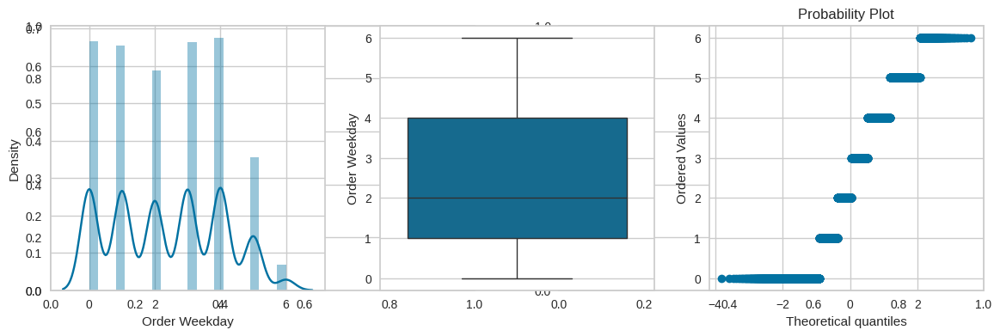

Skewness of Order Month: -0.4329511345177871
Kurtosis of Order Month: -0.9846637321437535


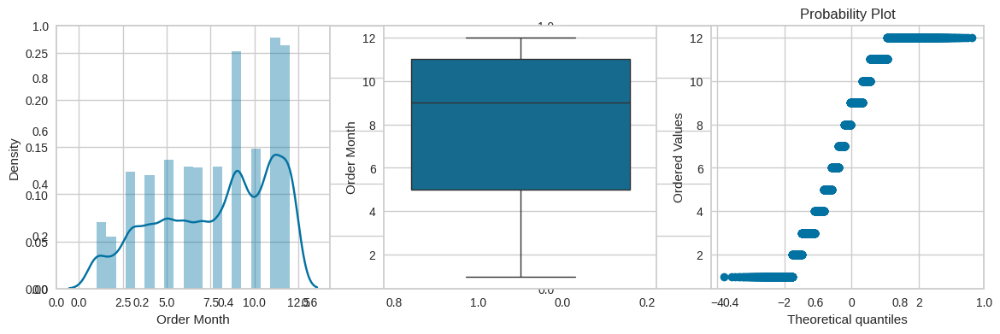

Skewness of Ship Day: -0.012355797229445813
Kurtosis of Ship Day: -1.2070053450291567


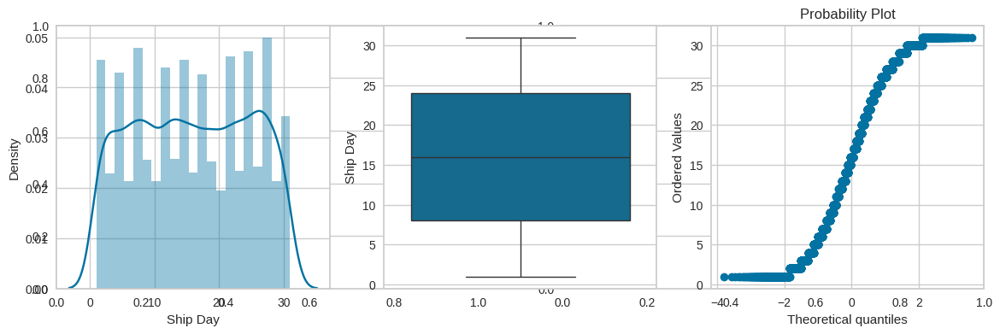

In [ ]:
for col in skewed_cols:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurt())
    plt.subplots(nrows=1,ncols=2,figsize=(14,4))
    plt.subplot(1,3,1)
    sns.distplot(df[col])
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    probplot(df[col],plot=plt,dist='norm',rvalue=True)
    plt.show()

In [ ]:
def apply_transform(data,col,transformer):
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(data[col])
    plt.subplot(132)
    sns.boxplot(data[col])
    plt.subplot(133)
    probplot(data[col],rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} Before Transform")
    plt.show()
    col_tf = transformer.fit_transform(data[[col]])
    col_tf = np.array(col_tf).reshape(col_tf.shape[0])
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(col_tf)
    plt.subplot(132)
    sns.boxplot(col_tf)
    plt.subplot(133)
    probplot(col_tf,rvalue=True,dist='norm',plot=plt)
    plt.suptitle(f"{col} After Transform")
    plt.show()
    gc.collect();

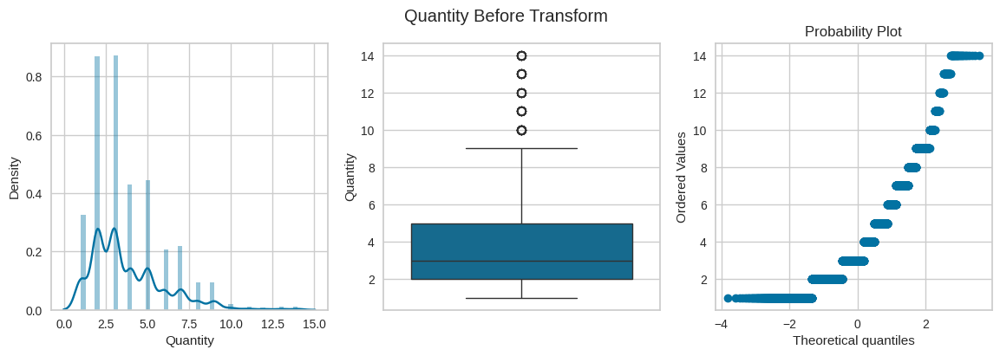

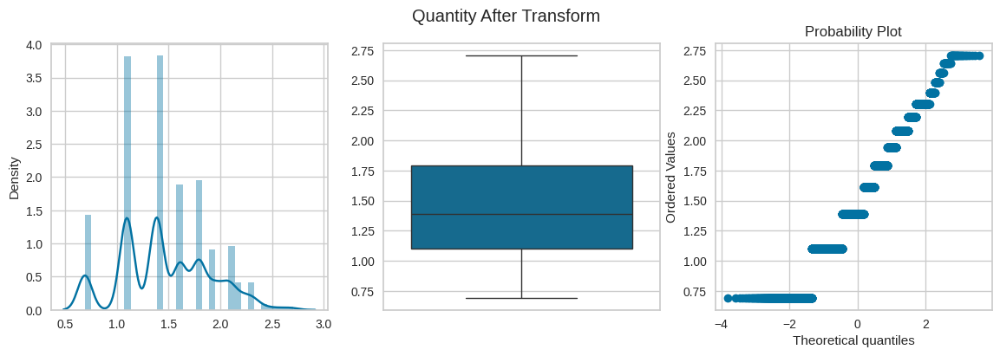

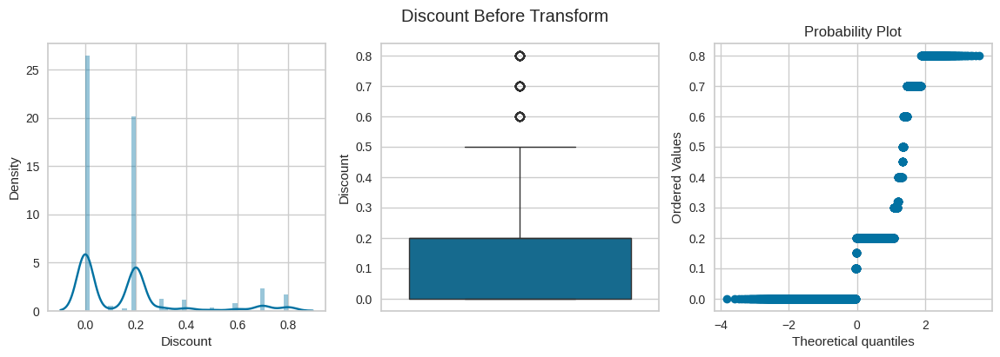

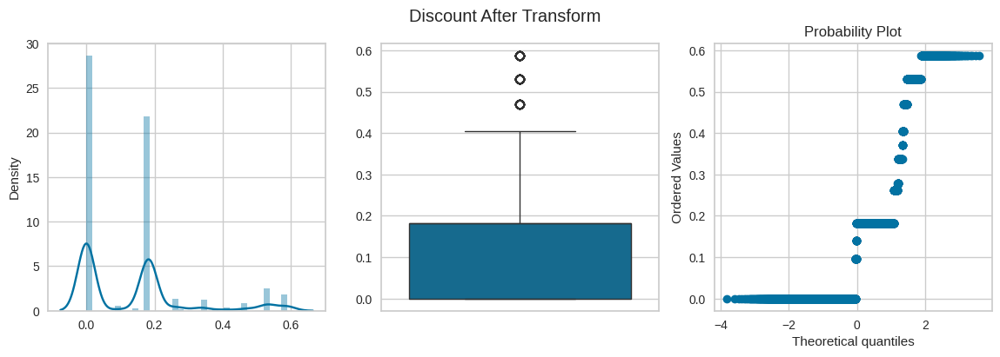

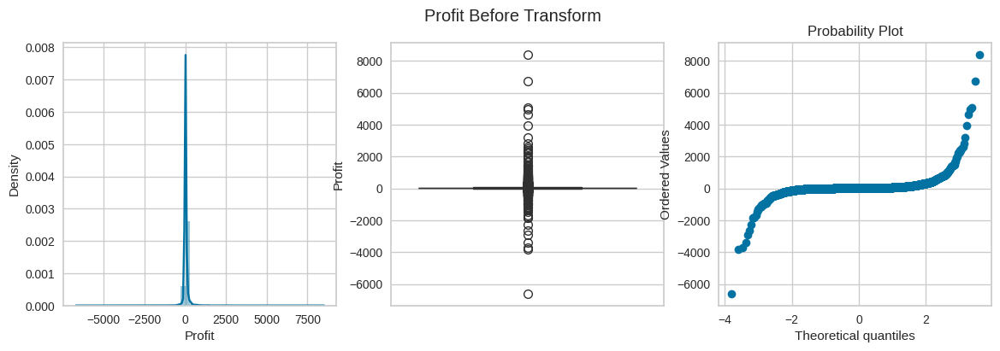

...

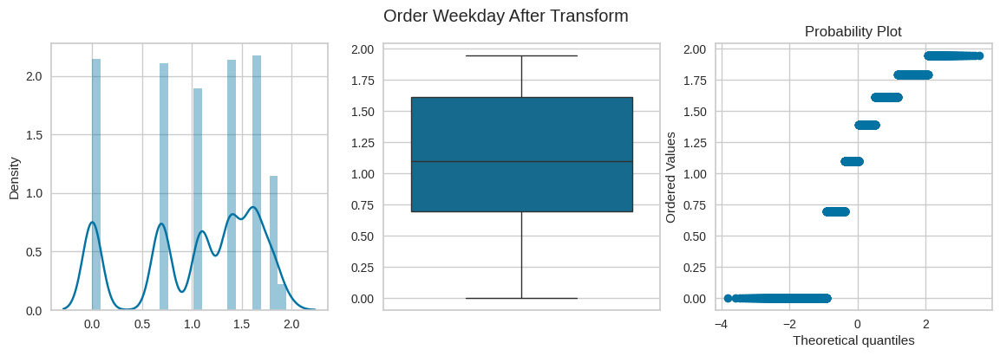

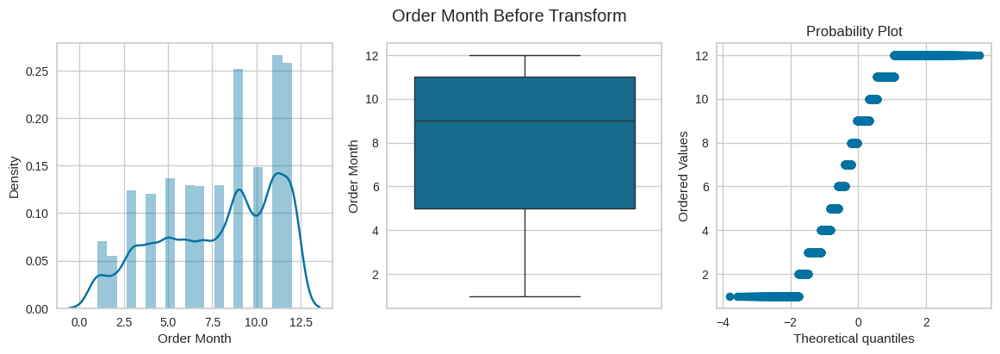

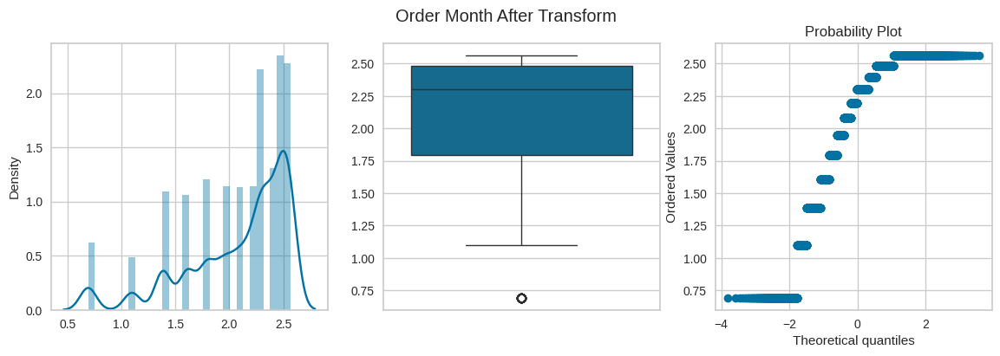

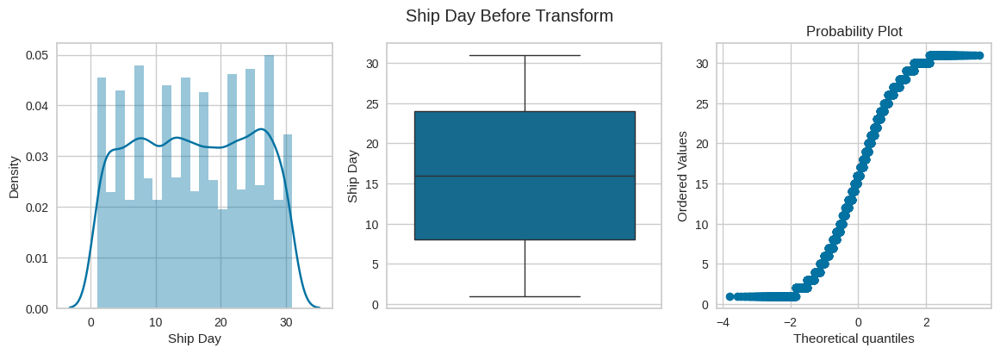

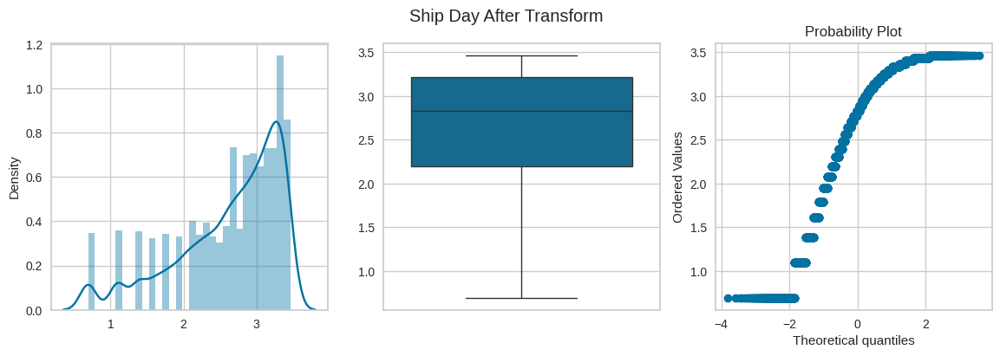

In [ ]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.log1p))

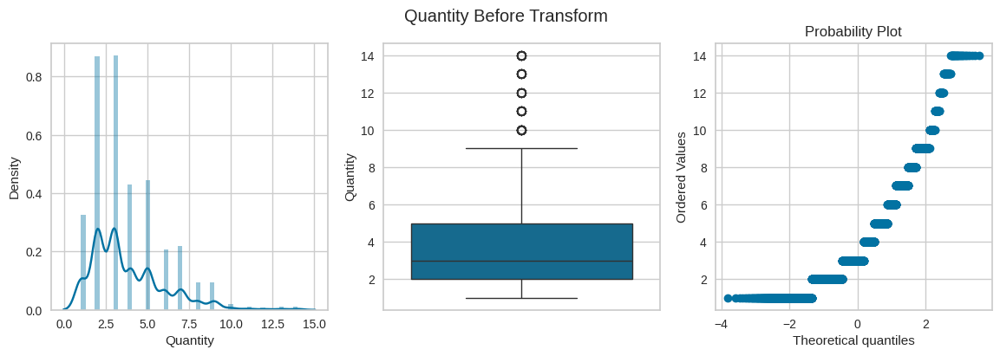

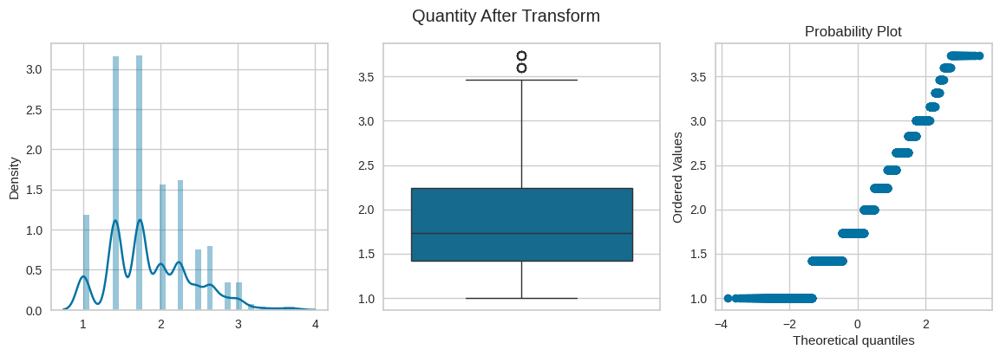

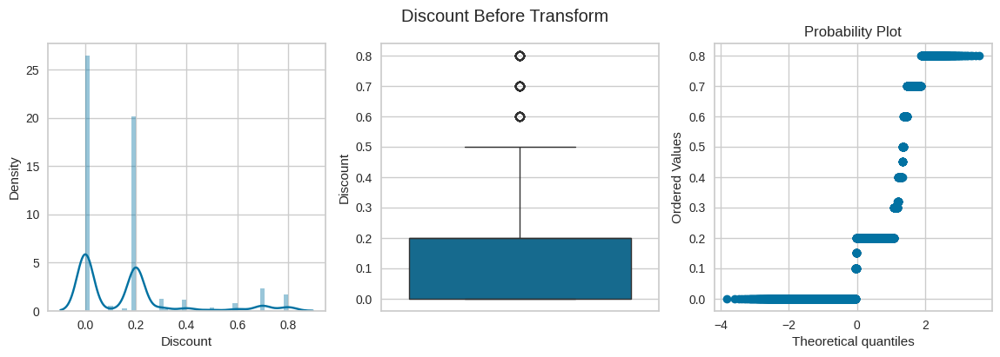

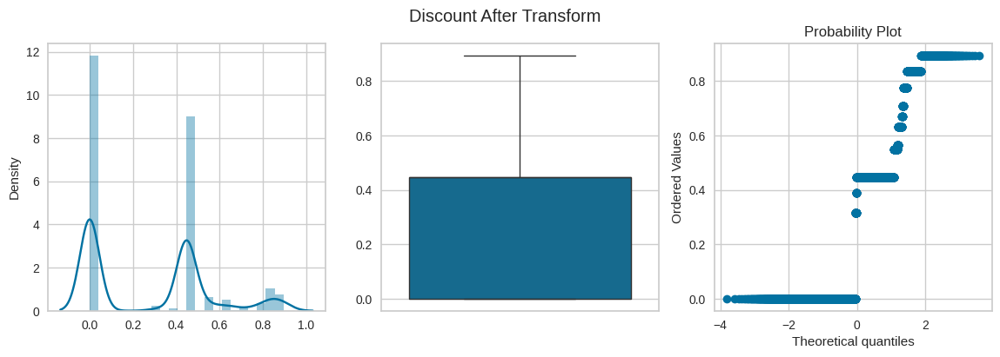

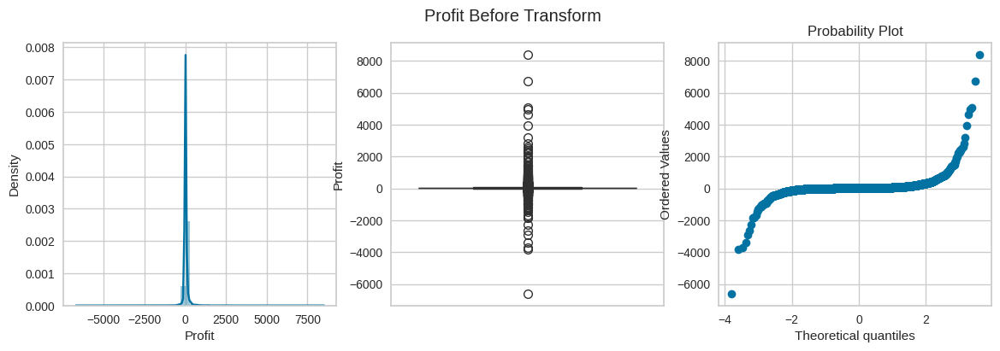

...

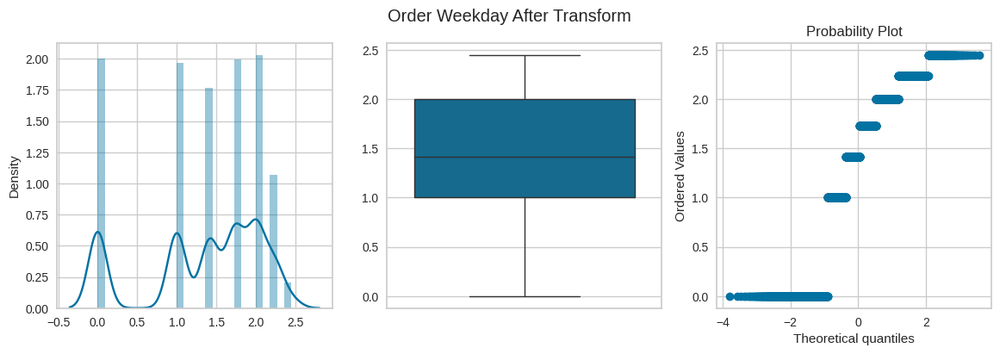

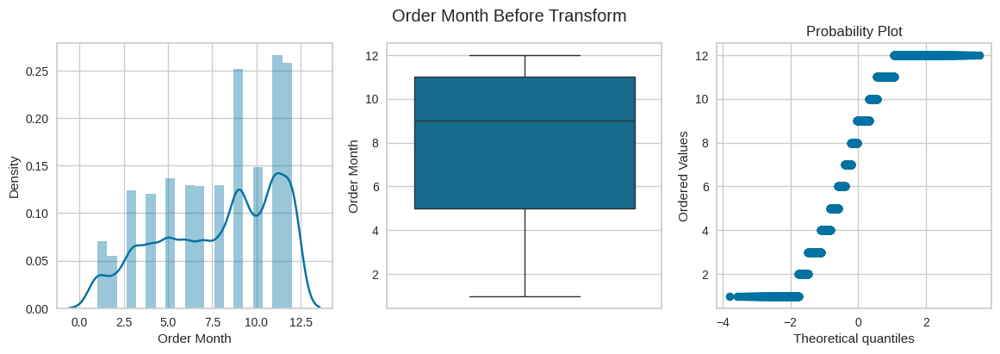

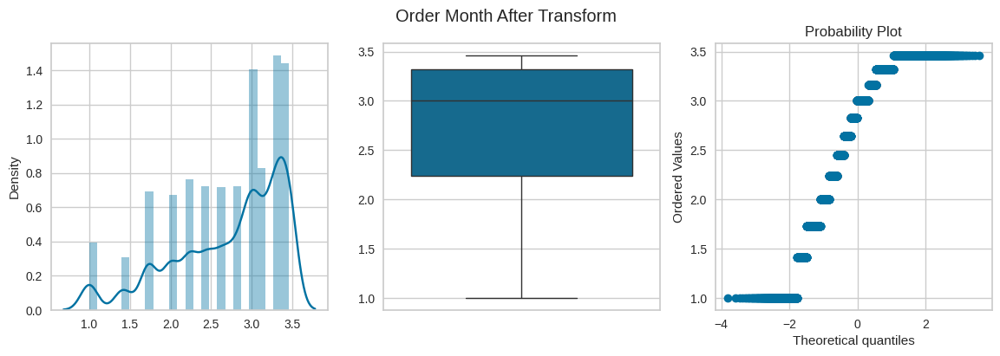

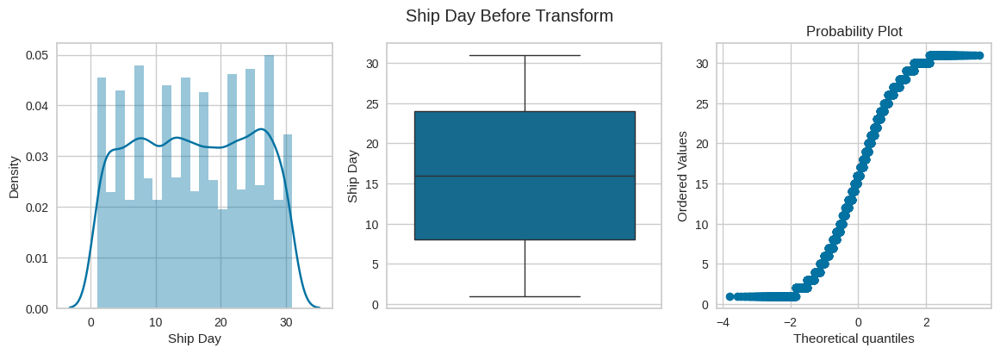

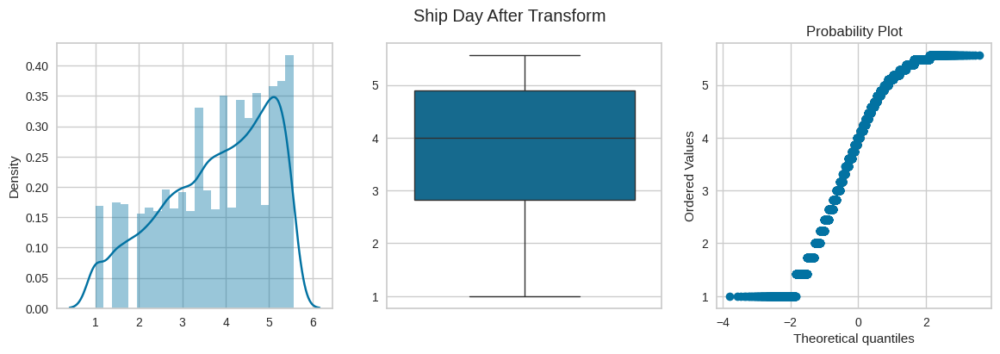

In [ ]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.sqrt))

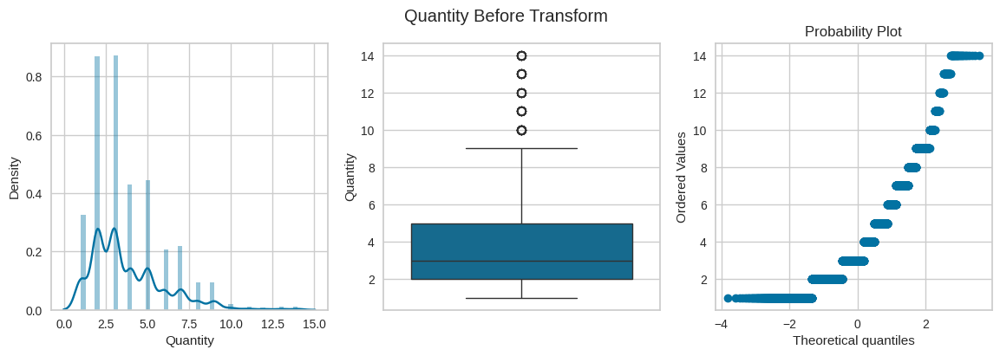

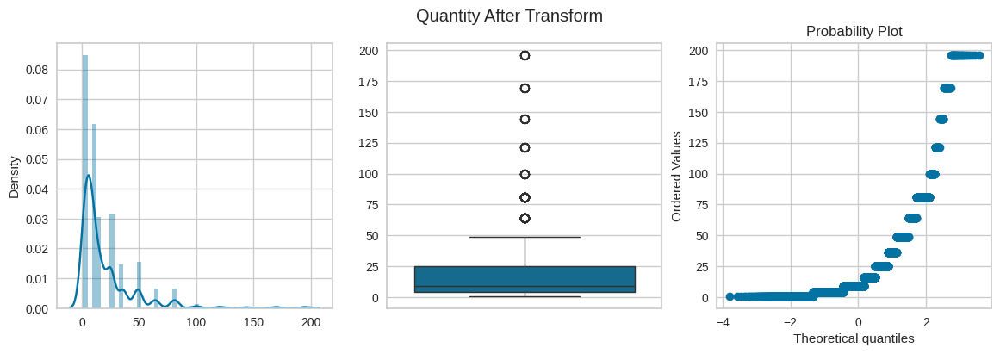

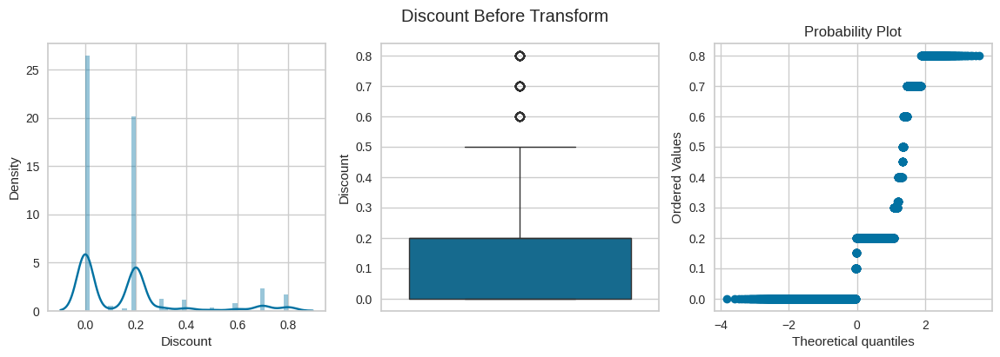

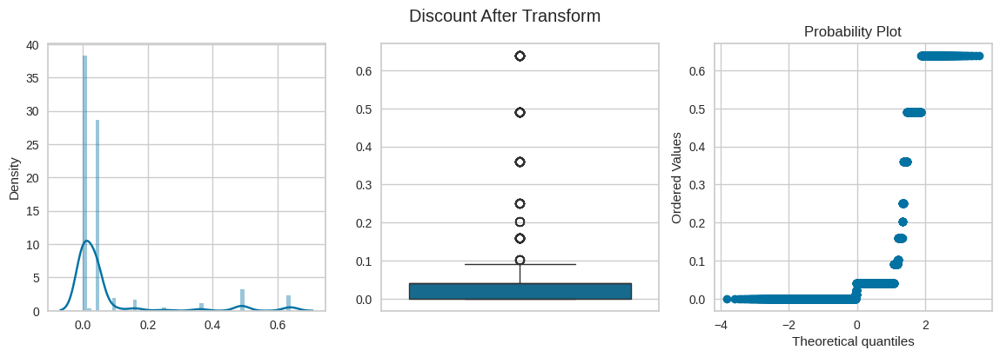

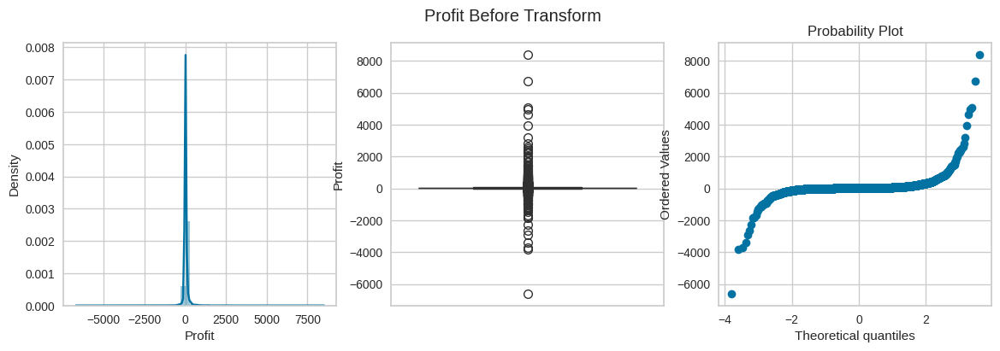

...

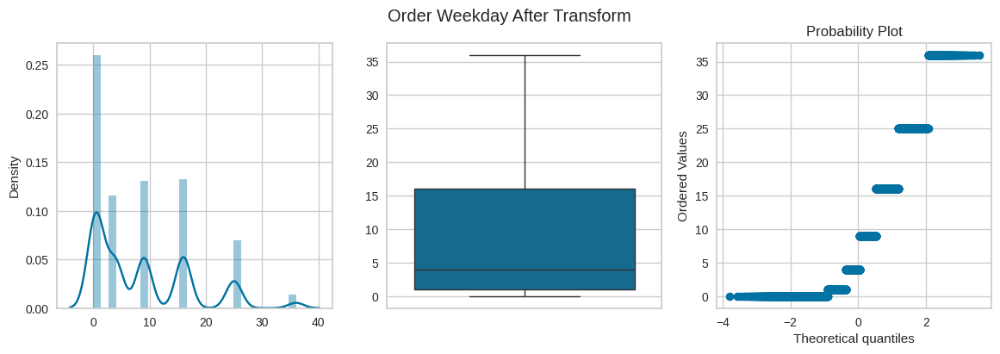

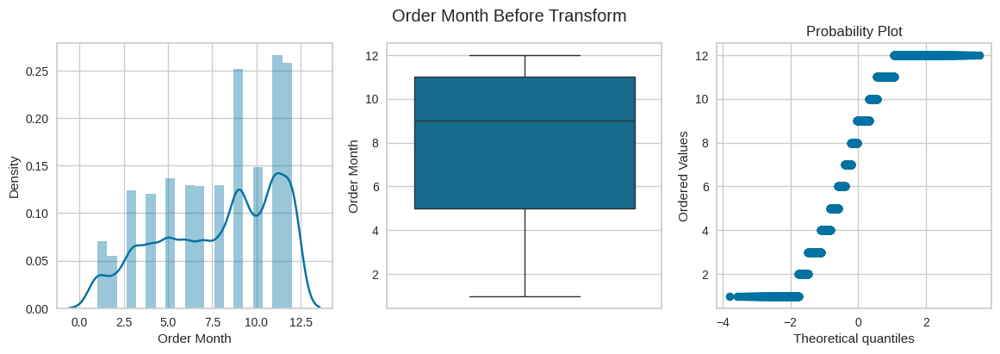

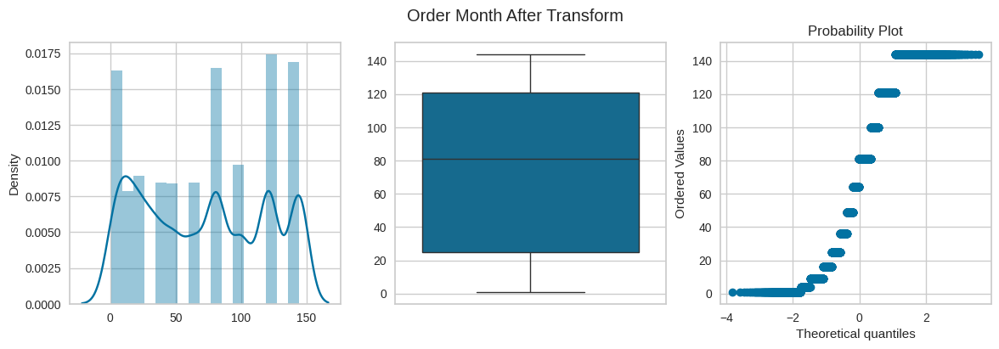

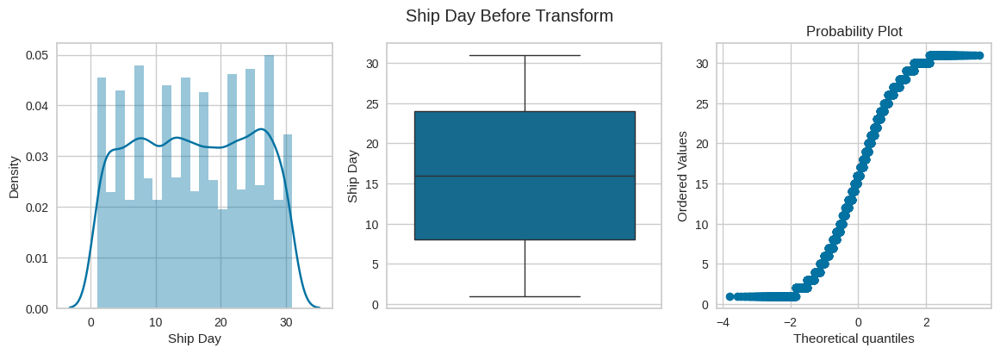

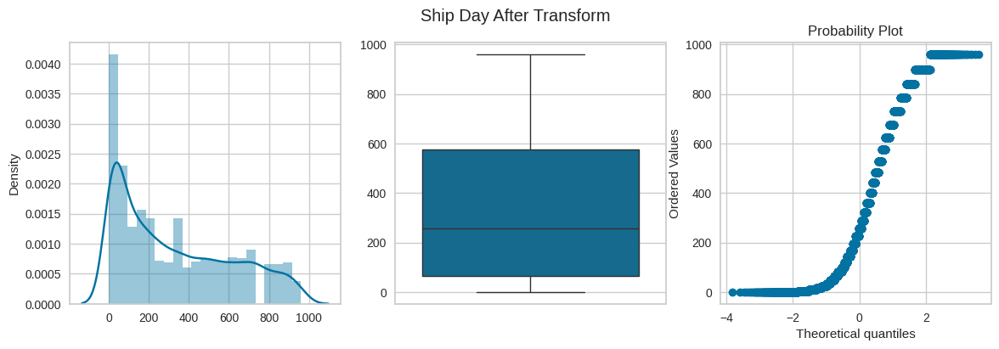

In [ ]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(np.square))

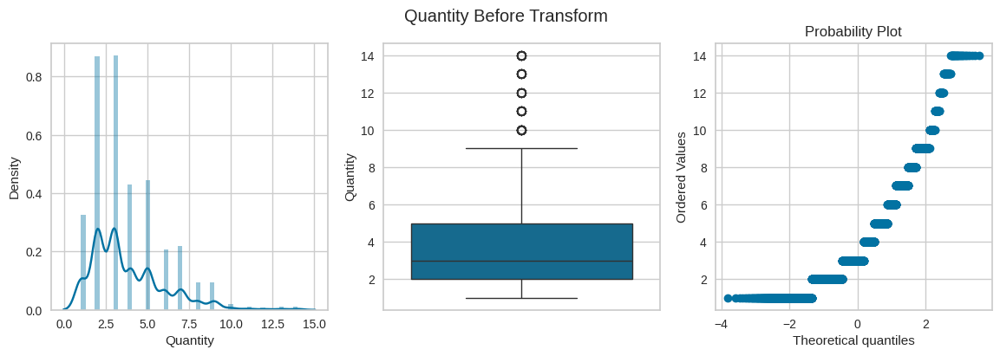

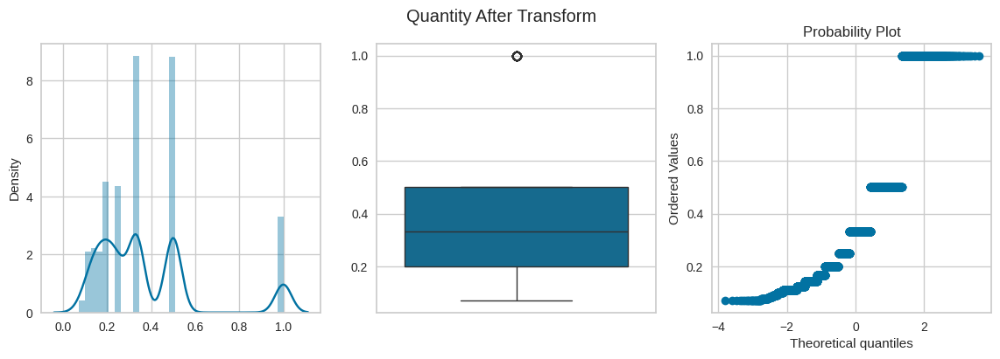

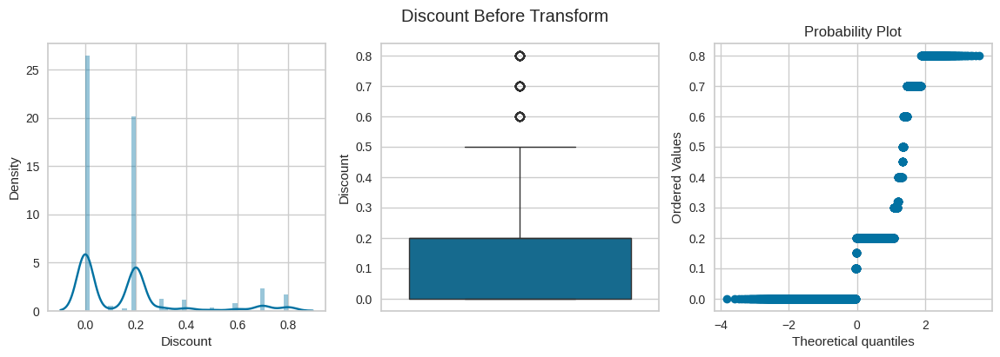

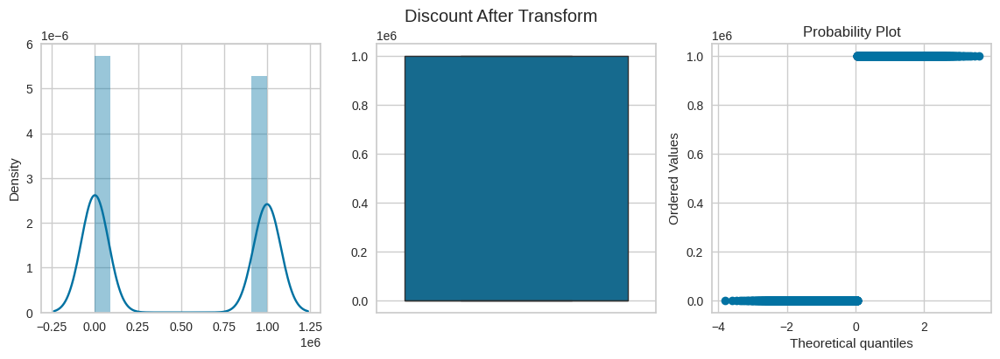

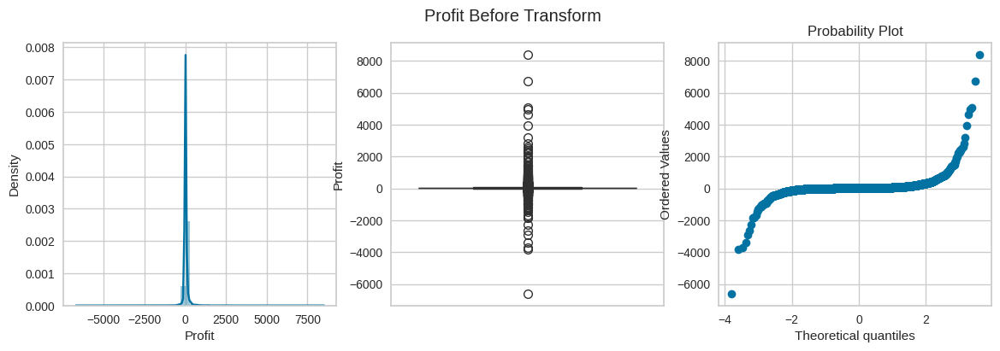

...

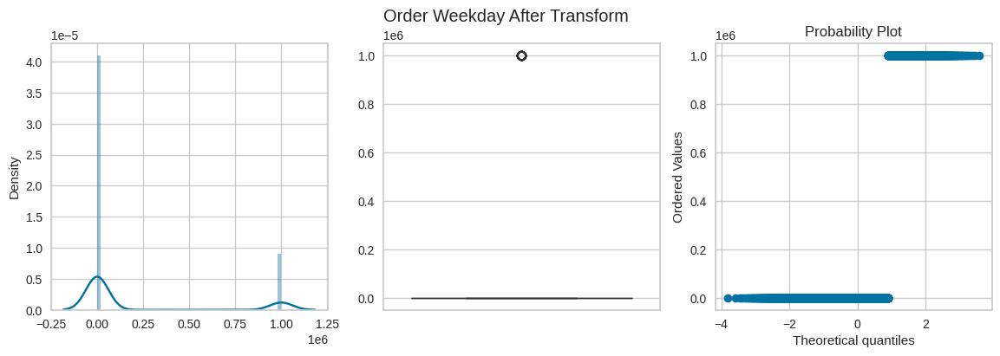

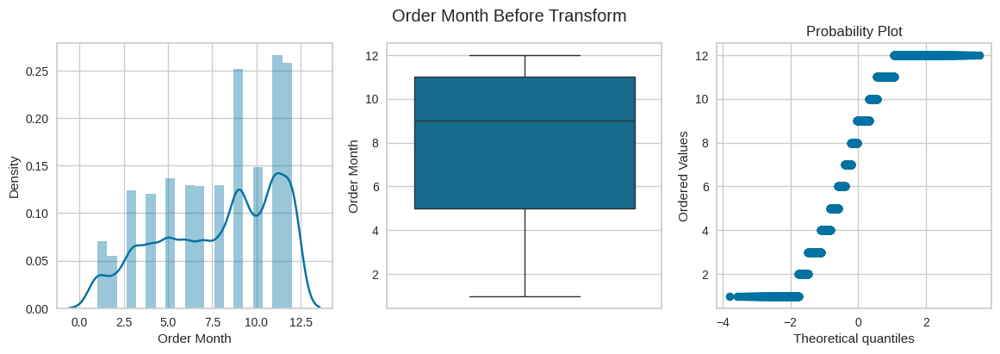

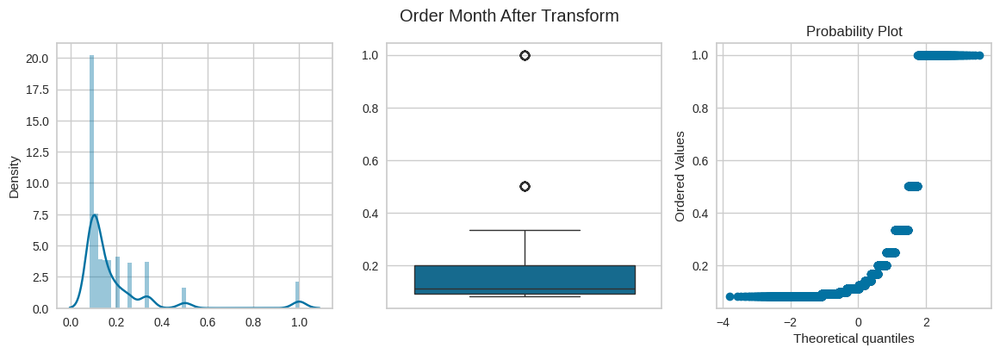

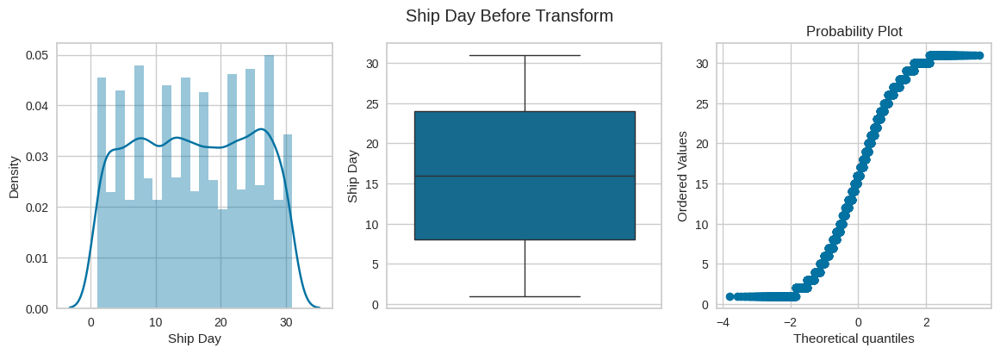

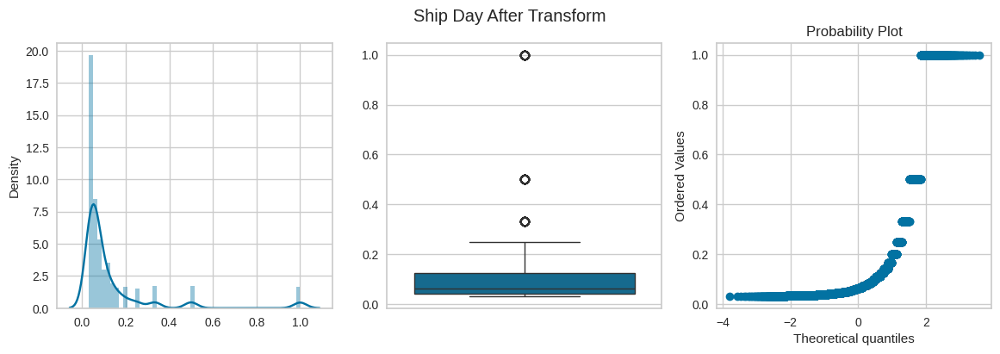

In [ ]:
for col in skewed_cols:
    apply_transform(df,col,FunctionTransformer(lambda x: 1/(x+0.000001)))

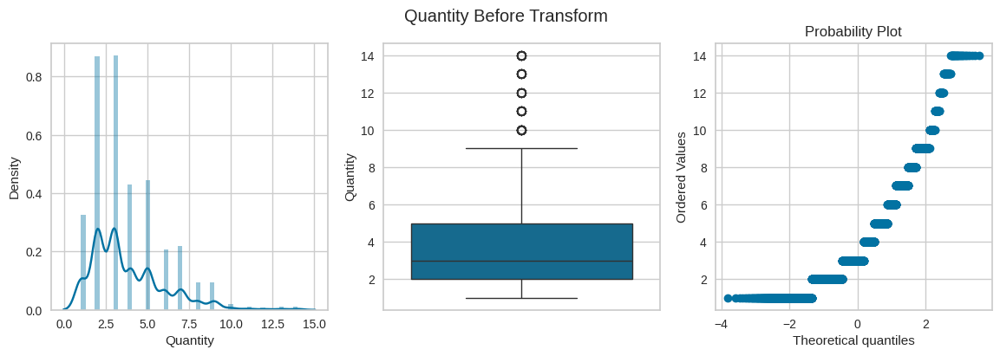

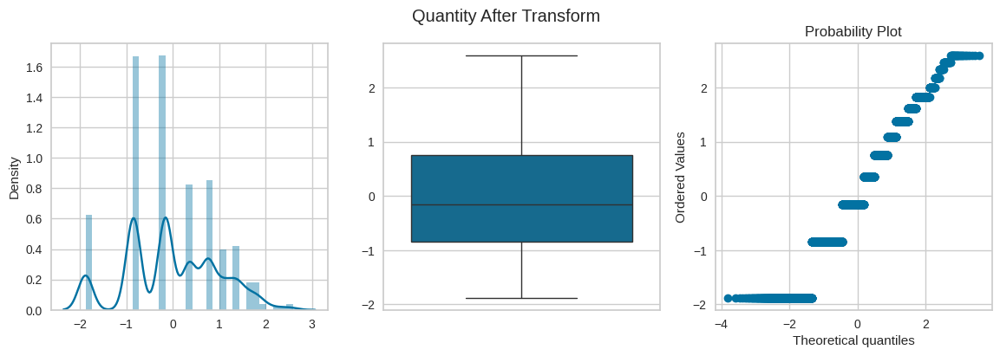

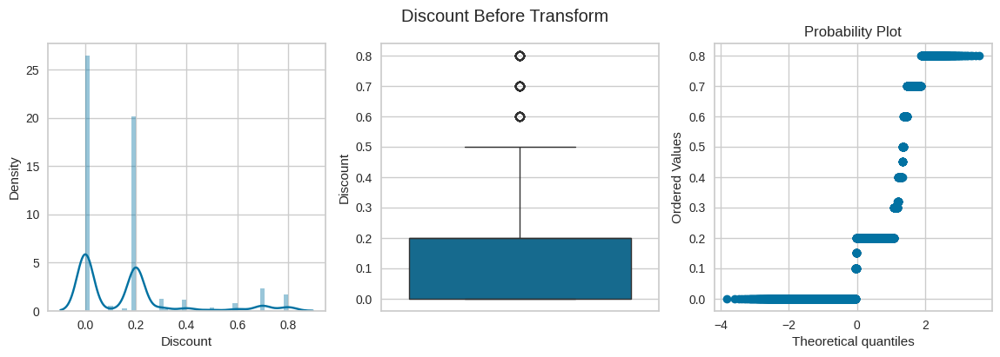

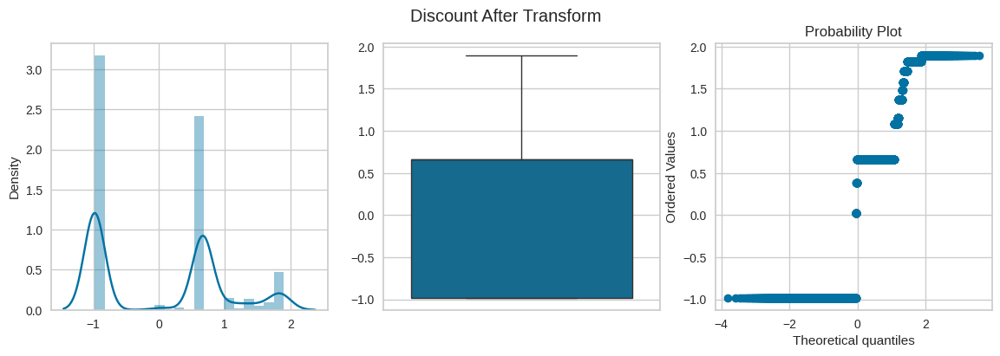

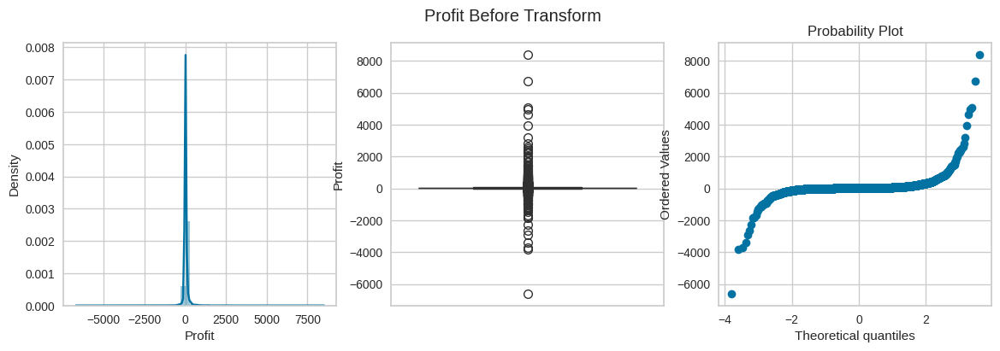

...

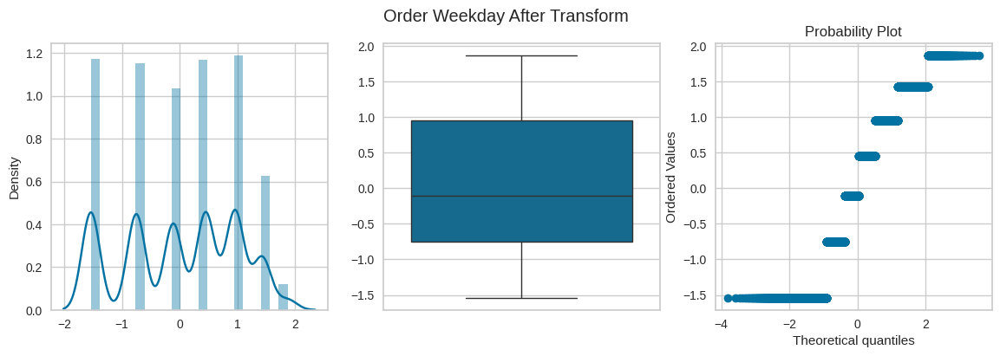

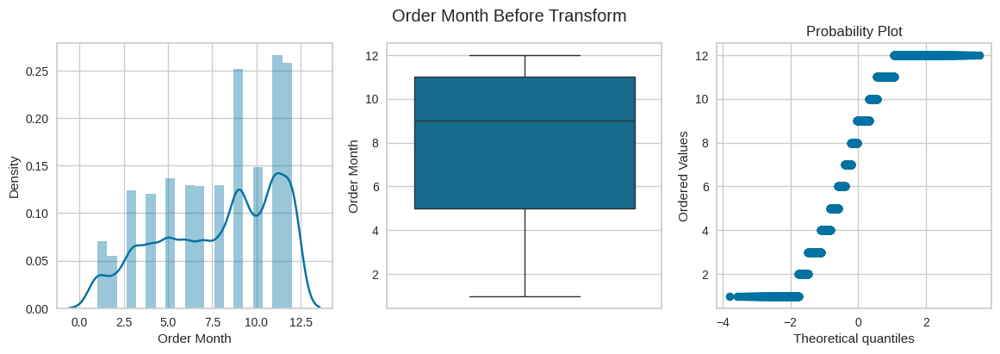

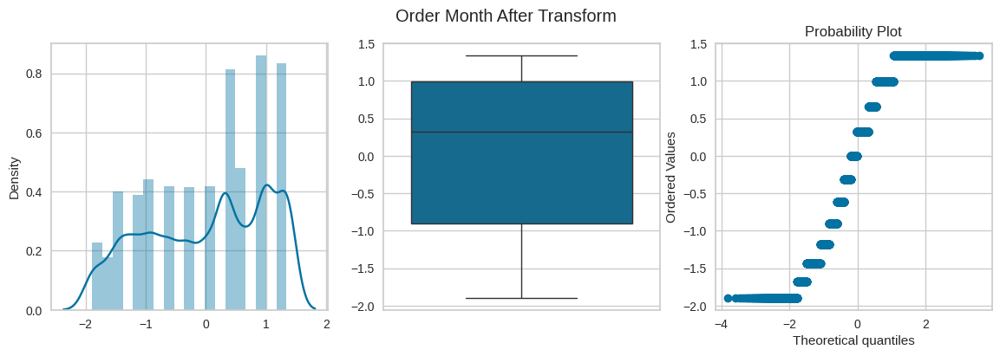

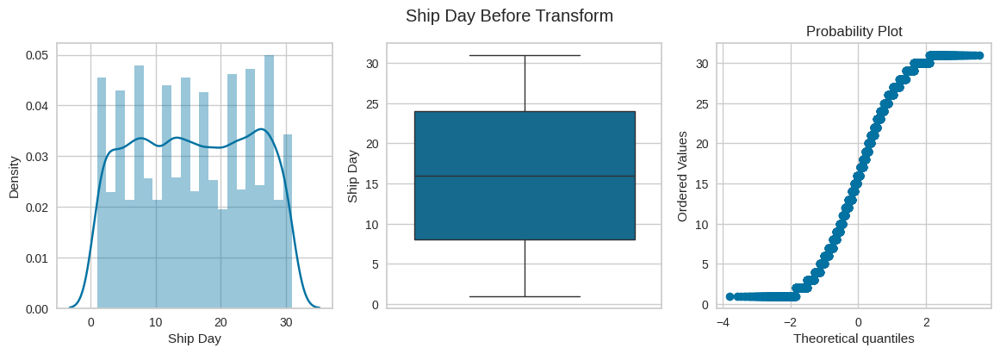

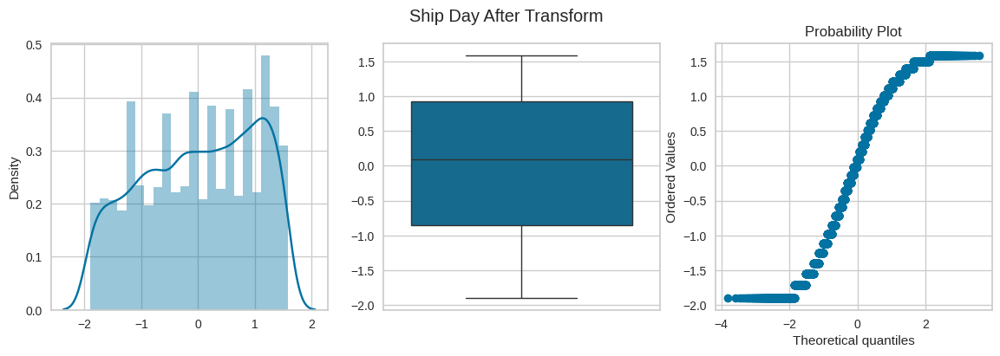

In [ ]:
for col in skewed_cols:
    apply_transform(df,col,PowerTransformer())

Quantity: Log Transform <br>
Discount: Sqrt Transform <br>
Profit: Log Transform <br>
Profit Margin: Power Transform <br>
Discounted Profit: Log Transform <br>
Discount Percentage: Power Transform <br>
Operating Expenses: Power Transform <br>
Net Profit: Log Transform

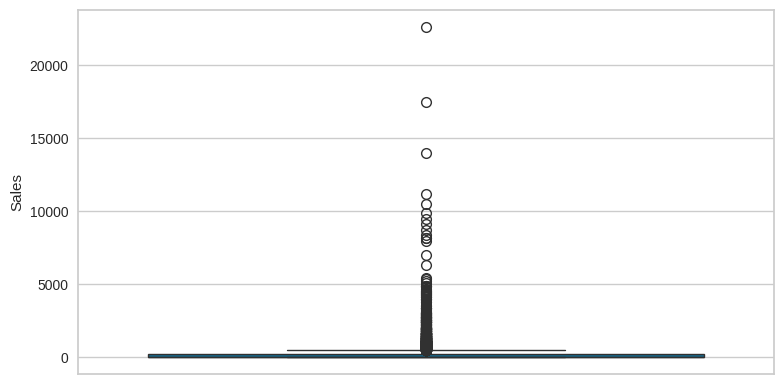

In [ ]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

In [ ]:
for idx in list(df[df['Sales'] > 10500].index):
    df.drop(idx,axis=0,inplace=True)

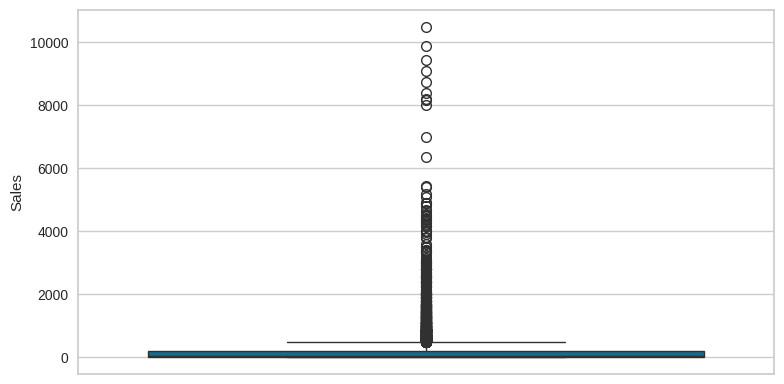

In [ ]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(df['Sales'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Splitting

In [ ]:
df.isnull().sum()

,0
Postal Code,1
Sales,1
Quantity,1
Discount,1
Profit,1
...,...
Product Name_Logitech 910-002974 M325 Wireless Mouse for Web Scrolling,0
"Product Name_Situations Contoured Folding Chairs, 4/Set",0
Product Name_Staples,0
Product Name_Storex Dura Pro Binders,0


In [ ]:
df = df.dropna()
df.shape

(9988, 67)

In [ ]:
X = df.drop('Sales',axis=1)
y = df['Sales']

In [ ]:
X.columns

Index(['Postal Code', 'Quantity', 'Discount', 'Profit', 'Profit Margin',
       'Discounted Profit', 'Discount Percentage', 'Operating Expenses',
       'Net Profit', 'Order Year', 'Order Month', 'Order Day', 'Order Weekday',
       'Ship Year', 'Ship Month', 'Ship Day', 'Ship Weekday',
       'Ship Mode_Same Day', 'Ship Mode_Second Class',
       'Ship Mode_Standard Class', 'Segment_Corporate', 'Segment_Home Office',
       'Segment_nan', 'State_Florida', 'State_Illinois', 'State_Michigan',
       'State_New York', 'State_Ohio', 'State_Pennsylvania', 'State_Texas',
       'State_Washington', 'State_infrequent_sklearn', 'City_Columbus',
       'City_Houston', 'City_Los Angeles', 'City_New York City',
       'City_Philadelphia', 'City_San Diego', 'City_San Francisco',
       'City_Seattle', 'City_infrequent_sklearn', 'Region_East',
       'Region_South', 'Region_West', 'Region_nan', 'Category_Office Supplies',
       'Category_Technology', 'Category_nan', 'Sub-Category_Appliances',
    

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Feature Selection

In [ ]:
X_train.shape, X_test.shape

((6991, 66), (2997, 66))

In [ ]:
pipeline = Pipeline(steps=[
    ('constant',DropConstantFeatures()),
    ('duplicate',DropDuplicateFeatures()),
    ('correlated',DropCorrelatedFeatures())
])

X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [ ]:
X_train.shape, X_test.shape

((6991, 55), (2997, 55))

In [ ]:
kbest = SelectKBest(k=10,score_func=f_regression)
kbest.fit(X_train,y_train)

SelectKBest(score_func=<function f_regression at 0x7fc9990da290>)

In [ ]:
selected_features = kbest.get_feature_names_out()
selected_features

array(['Quantity', 'Discount', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'Category_Office Supplies',
       'Category_Technology', 'Sub-Category_Chairs', 'Sub-Category_Paper',
       'Sub-Category_infrequent_sklearn'], dtype=object)

In [ ]:
perc = SelectPercentile(percentile=20,score_func=f_regression)
perc.fit(X_train,y_train)

SelectPercentile(percentile=20,
                 score_func=<function f_regression at 0x7fc9990da290>)

In [ ]:
selected_features = perc.get_feature_names_out()
selected_features

array(['Quantity', 'Discount', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'Category_Office Supplies',
       'Category_Technology', 'Sub-Category_Binders',
       'Sub-Category_Chairs', 'Sub-Category_Paper',
       'Sub-Category_infrequent_sklearn'], dtype=object)

In [ ]:
ridge = SelectFromModel(estimator=Ridge(),max_features=10)
ridge.fit(X_train,y_train)

SelectFromModel(estimator=Ridge(), max_features=10)

In [ ]:
selected_features = ridge.get_feature_names_out()
selected_features

array(['Discount', 'State_Illinois', 'City_Philadelphia',
       'Category_Office Supplies', 'Category_Technology',
       'Sub-Category_Chairs', 'Sub-Category_Furnishings',
       "Product Name_Global Wood Trimmed Manager's Task Chair, Khaki",
       'Product Name_Logitech 910-002974 M325 Wireless Mouse for Web Scrolling',
       'Product Name_Situations Contoured Folding Chairs, 4/Set'],
      dtype=object)

In [ ]:
rf = SelectFromModel(estimator=RandomForestRegressor(),max_features=10)
rf.fit(X_train,y_train)

SelectFromModel(estimator=RandomForestRegressor(), max_features=10)

In [ ]:
selected_features = rf.get_feature_names_out()
selected_features

array(['Discounted Profit', 'Discount Percentage', 'Operating Expenses'],
      dtype=object)

In [ ]:
rfe = RFE(estimator=RandomForestRegressor(),n_features_to_select=10,step=5,verbose=1)
rfe.fit(X_train,y_train)

Fitting estimator with 55 features.
Fitting estimator with 50 features.
Fitting estimator with 45 features.
Fitting estimator with 40 features.
Fitting estimator with 35 features.
Fitting estimator with 30 features.
Fitting estimator with 25 features.
Fitting estimator with 20 features.
Fitting estimator with 15 features.


RFE(estimator=RandomForestRegressor(), n_features_to_select=10, step=5,
    verbose=1)

In [ ]:
selected_features = rfe.get_feature_names_out()
selected_features

array(['Postal Code', 'Discount', 'Discounted Profit',
       'Discount Percentage', 'Operating Expenses', 'Order Month',
       'Order Day', 'Order Weekday', 'Ship Day', 'Ship Weekday'],
      dtype=object)

In [ ]:
sfs = SequentialFeatureSelector(estimator=Ridge(),n_features_to_select=10,direction='backward')
sfs.fit(X_train,y_train)

SequentialFeatureSelector(direction='backward', estimator=Ridge(),
                          n_features_to_select=10)

In [ ]:
selected_features = sfs.get_feature_names_out()
selected_features

array(['Discount', 'Discounted Profit', 'Discount Percentage',
       'Operating Expenses', 'State_Michigan', 'State_infrequent_sklearn',
       'Category_Office Supplies', 'Category_Technology',
       'Sub-Category_Furnishings', 'Sub-Category_Phones'], dtype=object)

In [ ]:
xgb = XGBRegressor()
xgb.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
def plot_feature_importances(feat_imp_type: str):
    feat_imps = xgb.get_booster().get_score(importance_type=feat_imp_type)
    keys = list(feat_imps.keys())[:10]
    values = list(feat_imps.values())[:10]
    feat_imps_df = pd.DataFrame(data=values, index=keys, columns=["Importance"]).sort_values(by="Importance", ascending=False).reset_index()
    feat_imps_df.rename({'index': 'Feature'},axis=1,inplace=True)
    plt.figure(figsize=(12,8))
    fig = sns.barplot(x='Importance',y='Feature',data=feat_imps_df,orient='horizontal',palette='viridis')
    plt.title(f"{feat_imp_type.title()} Feature Importance")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect();

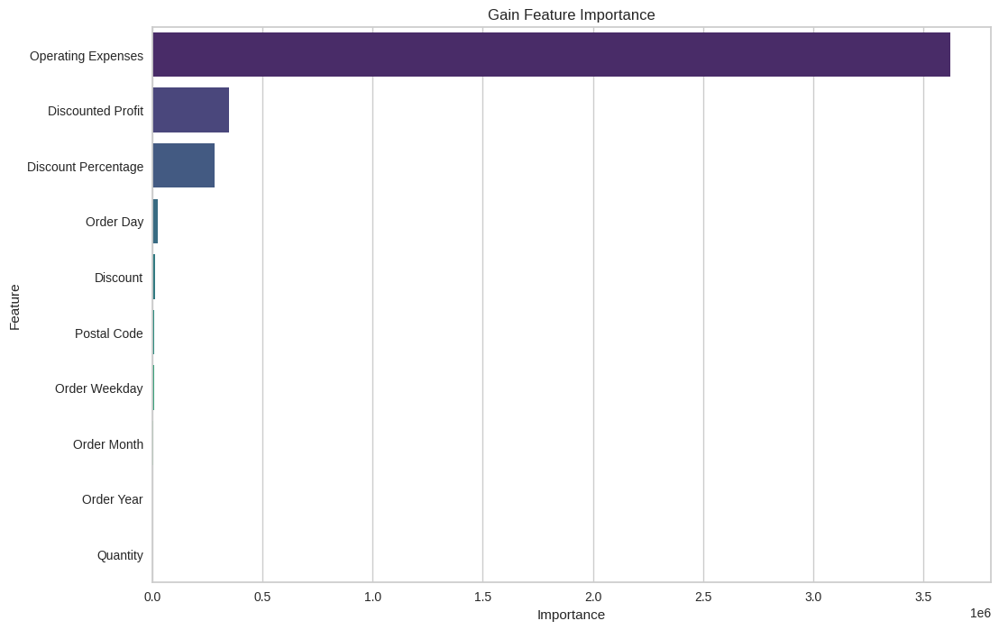

In [ ]:
plot_feature_importances('gain')

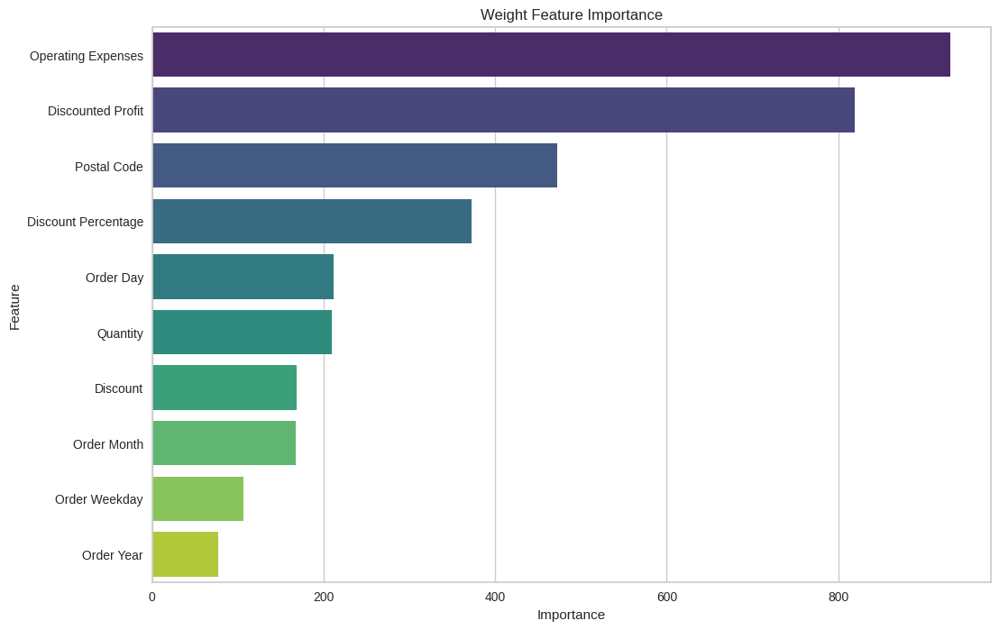

In [ ]:
plot_feature_importances('weight')

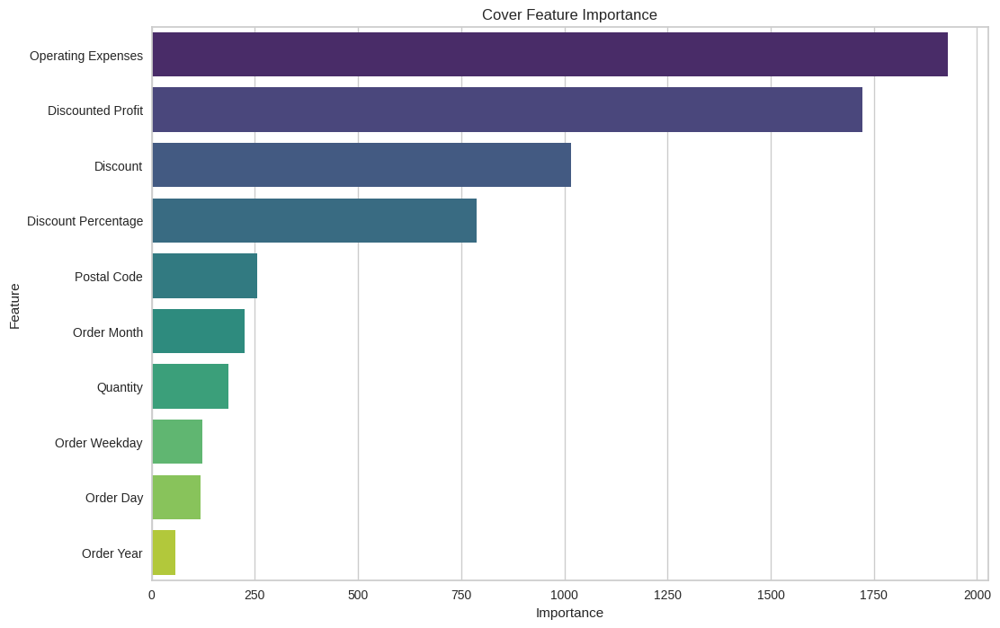

In [ ]:
plot_feature_importances('cover')

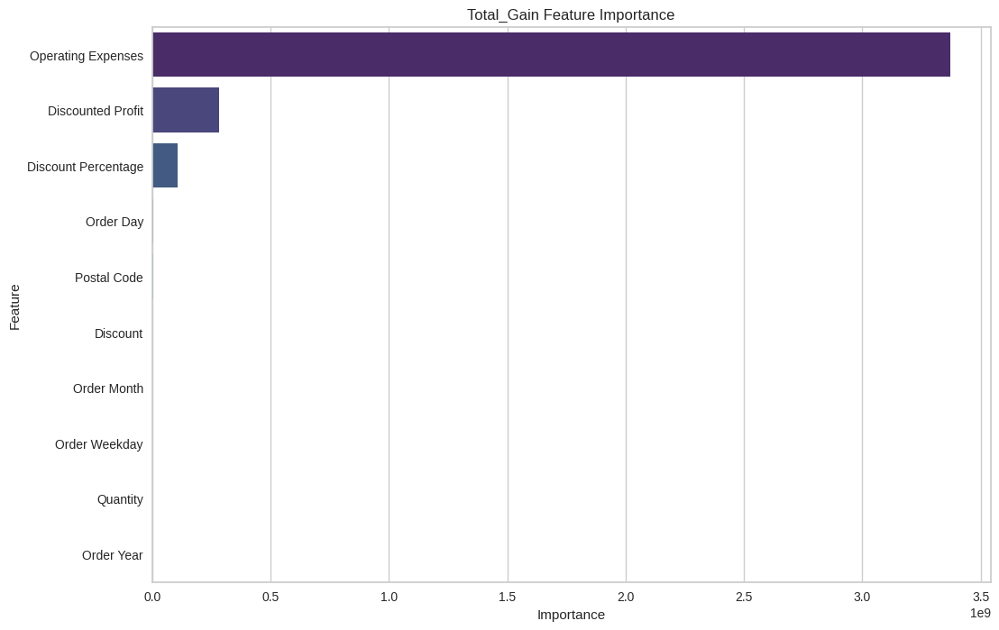

In [ ]:
plot_feature_importances('total_gain')

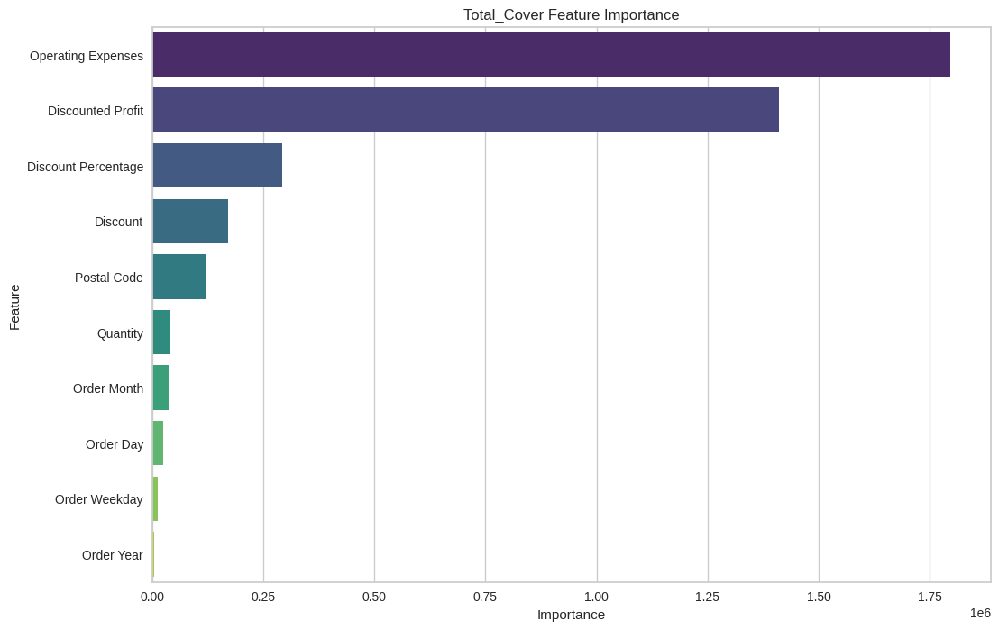

In [ ]:
plot_feature_importances('total_cover')

In [ ]:
final_selected_features = [
                           'Discount Percentage',
                           'Postal Code',
                           'Discount',
                           'Order Day',
                           'Order Month',
                           'Quantity',
                           'Operating Expenses',
                           'Ship Day',
                           'Order Weekday']

final_X_train = X_train[final_selected_features]
final_X_test = X_test[final_selected_features]

In [ ]:
gc.collect()

5690

In [ ]:
final_X_train.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
5579,0.081994,90004.0,0.2,10.0,9.0,5.0,259.1650,15.0,2.0
2728,0.063496,43615.0,0.4,23.0,12.0,7.0,535.4643,25.0,1.0
477,0.208855,90008.0,0.2,13.0,7.0,6.0,88.5780,20.0,5.0
1329,0.000000,94109.0,0.0,24.0,5.0,3.0,20.7480,28.0,4.0
4544,0.134698,60610.0,0.2,12.0,7.0,2.0,131.7760,17.0,3.0


In [ ]:
final_X_test.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
1558,0.000000,98103.0,0.0,16.0,3.0,2.0,127.2504,18.0,4.0
3059,0.820749,94110.0,0.2,20.0,10.0,2.0,27.7186,25.0,0.0
8234,6.009615,32216.0,0.2,2.0,5.0,2.0,2.9120,7.0,4.0
5357,0.000000,94122.0,0.0,5.0,8.0,1.0,14.7240,11.0,4.0
35,0.018223,75080.0,0.2,9.0,12.0,7.0,974.0703,11.0,0.0


In [ ]:
transformer = ColumnTransformer(transformers=[
    ('log_transform',FunctionTransformer(np.log1p),['Quantity']),
    ('sqrt_transform',FunctionTransformer(np.sqrt),['Discount']),
    ('power_transform',PowerTransformer(),['Discount Percentage','Operating Expenses'])
],remainder='passthrough')
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('log_transform',
                                 FunctionTransformer(func=<ufunc 'log1p'>),
                                 ['Quantity']),
                                ('sqrt_transform',
                                 FunctionTransformer(func=<ufunc 'sqrt'>),
                                 ['Discount']),
                                ('power_transform', PowerTransformer(),
                                 ['Discount Percentage',
                                  'Operating Expenses'])])

In [ ]:
final_X_train = transformer.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=final_selected_features)
final_X_test = transformer.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=final_selected_features)
final_X_train.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.791759,0.447214,-0.324229,1.009995,90004.0,10.0,9.0,15.0,2.0
1,2.079442,0.632456,-0.412458,1.378259,43615.0,23.0,12.0,25.0,1.0
2,1.945910,0.447214,0.171010,0.414783,90008.0,13.0,7.0,20.0,5.0
3,1.386294,0.000000,-0.755604,-0.483757,94109.0,24.0,5.0,28.0,4.0
4,1.098612,0.447214,-0.097214,0.642144,60610.0,12.0,7.0,17.0,3.0


In [ ]:
final_X_test.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,1.098612,0.000000,-0.755604,0.622479,98103.0,16.0,3.0,18.0,4.0
1,1.098612,0.447214,1.246647,-0.296776,94110.0,20.0,10.0,25.0,0.0
2,1.098612,0.447214,1.963591,-1.764067,32216.0,2.0,5.0,7.0,4.0
3,0.693147,0.000000,-0.755604,-0.708771,94122.0,5.0,8.0,11.0,4.0
4,2.079442,0.447214,-0.650184,1.662262,75080.0,9.0,12.0,11.0,0.0


### Missing Value Imputation

In [ ]:
final_X_train.isna().sum()

,0
Discount Percentage,0
Postal Code,0
Discount,0
Order Day,0
Order Month,0
Quantity,0
Operating Expenses,0
Ship Day,0
Order Weekday,0


In [ ]:
final_X_test.isnull().sum()

,0
Discount Percentage,0
Postal Code,0
Discount,0
Order Day,0
Order Month,0
Quantity,0
Operating Expenses,0
Ship Day,0
Order Weekday,0


In [ ]:
imputer = SimpleImputer(strategy='median')
final_X_train['Discount Percentage'] = imputer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = imputer.fit_transform(final_X_test[['Discount Percentage']])

In [ ]:
for col in final_X_train.columns:
    imputer = SimpleImputer(strategy='median')
    final_X_train[col] = imputer.fit_transform(final_X_train[[col]])

In [ ]:
final_X_train.isna().sum()

,0
Discount Percentage,0
Postal Code,0
Discount,0
Order Day,0
Order Month,0
Quantity,0
Operating Expenses,0
Ship Day,0
Order Weekday,0


In [ ]:
final_X_test.isnull().sum()

,0
Discount Percentage,0
Postal Code,0
Discount,0
Order Day,0
Order Month,0
Quantity,0
Operating Expenses,0
Ship Day,0
Order Weekday,0


### Outlier Treatment

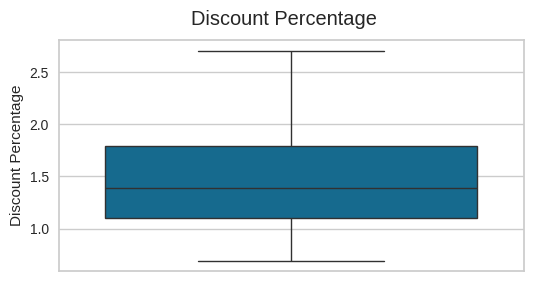

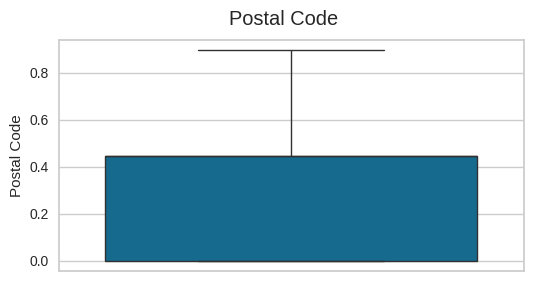

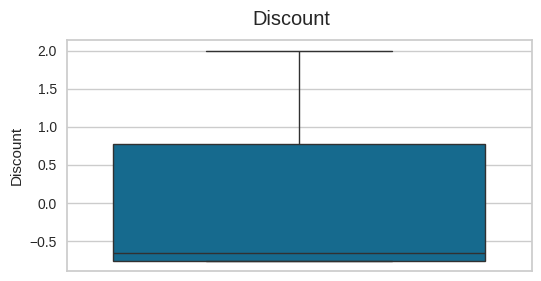

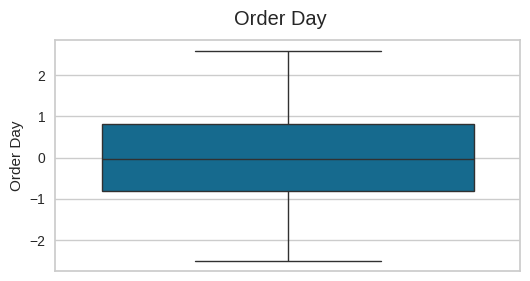

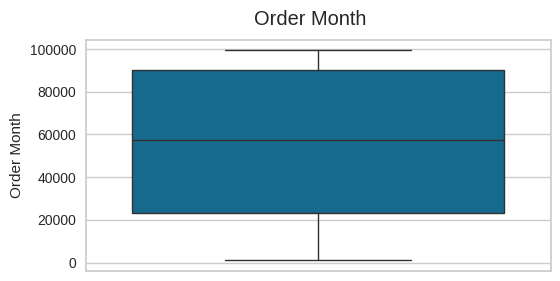

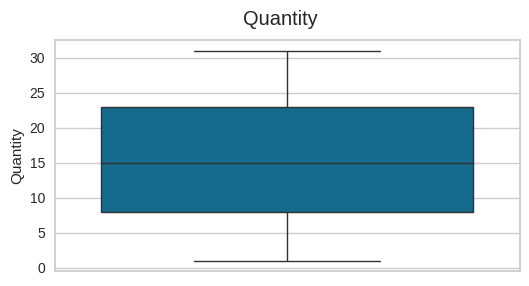

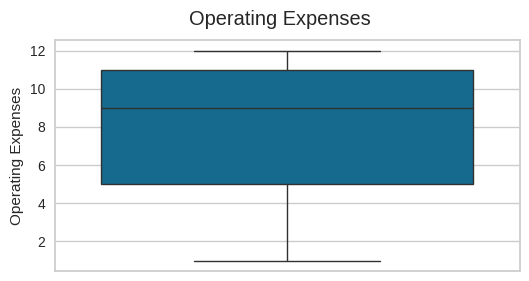

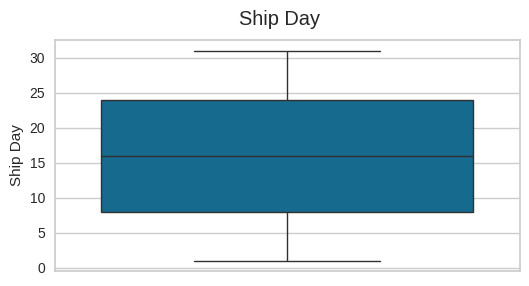

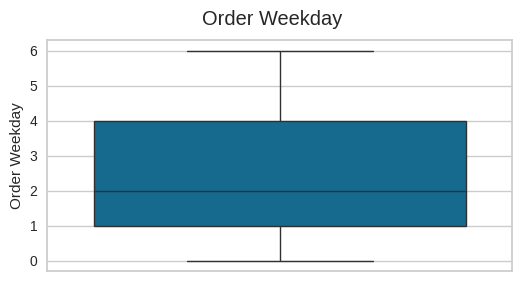

In [ ]:
for col in final_X_train.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_train[col])
    plt.suptitle(col)
    plt.show()

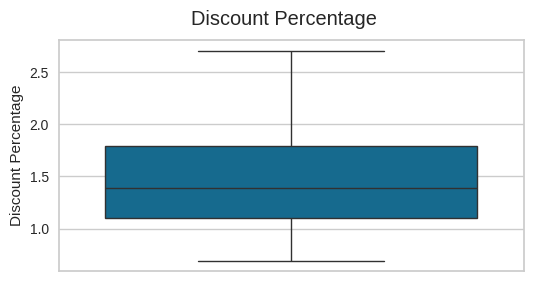

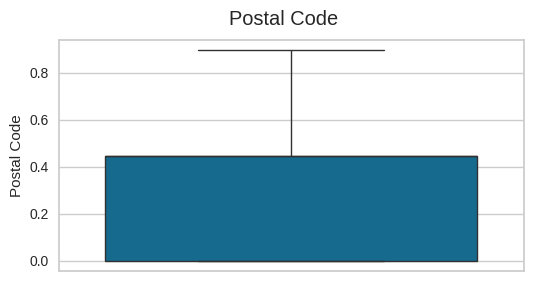

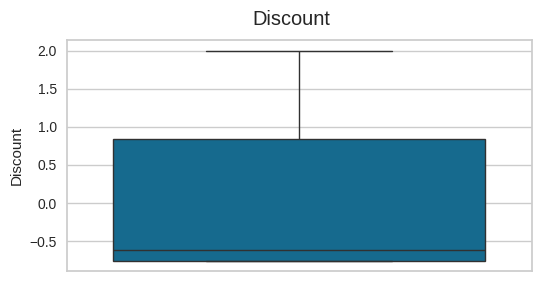

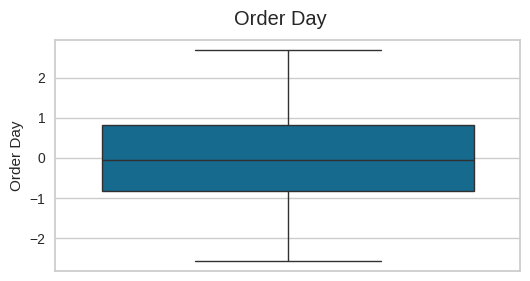

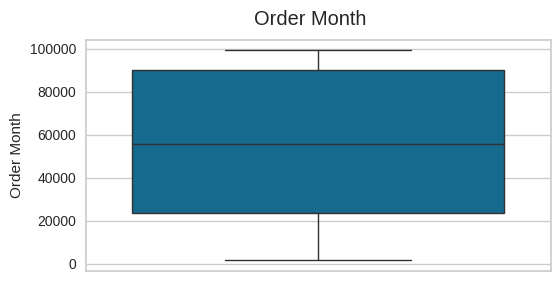

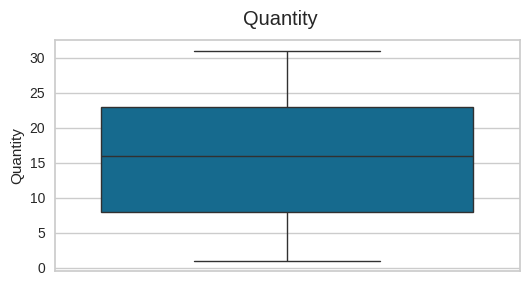

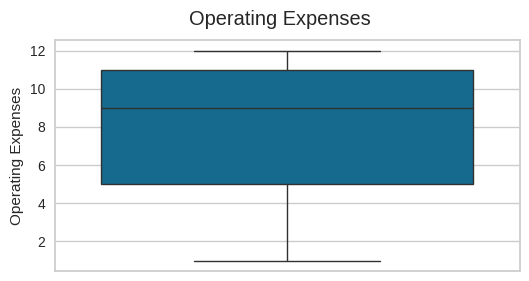

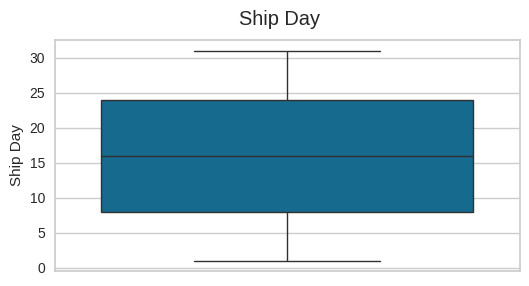

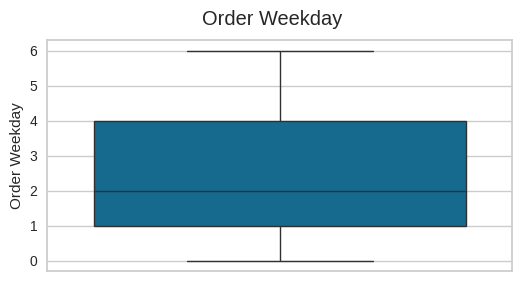

In [ ]:
for col in final_X_test.columns:
    plt.figure(figsize=(6,3))
    sns.boxplot(final_X_test[col])
    plt.suptitle(col)
    plt.show()

In [ ]:
def impute_outliers(data,col):
    winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
    fig = sns.boxplot(winsorizer.fit_transform(data[[col]]).values)
    plt.title(f"Box Plot of {col} after Outlier Removal")
    plt.show(fig)
    plt.close('all')
    del fig
    gc.collect()

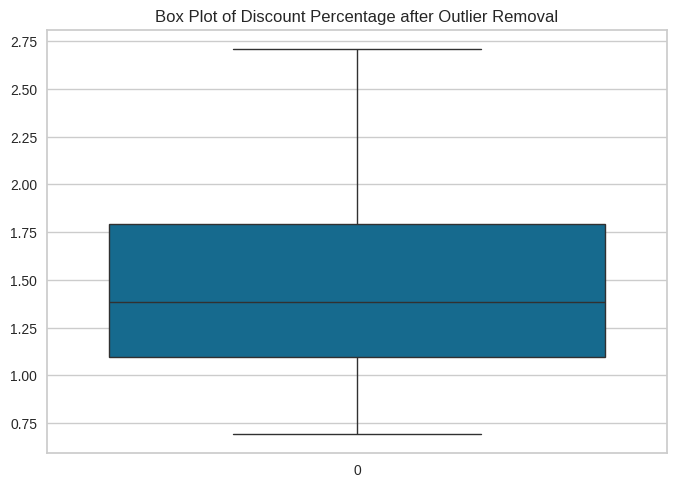

In [ ]:
impute_outliers(final_X_train,'Discount Percentage')

In [ ]:
winsorizer = Winsorizer(capping_method='iqr',fold=1.5,tail='both')
final_X_train['Discount Percentage'] = winsorizer.fit_transform(final_X_train[['Discount Percentage']])
final_X_test['Discount Percentage'] = winsorizer.transform(final_X_test[['Discount Percentage']])

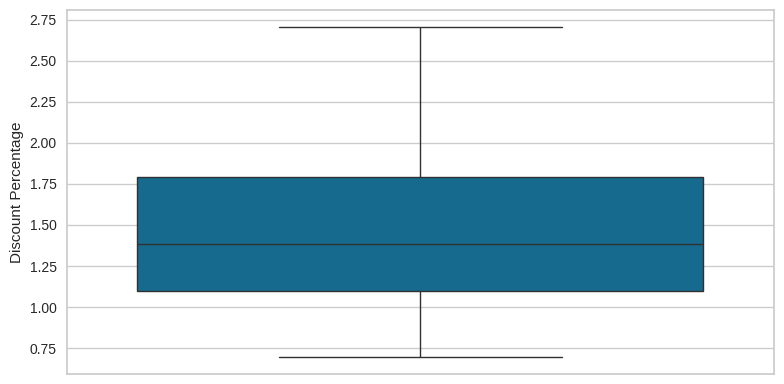

In [ ]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_train['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

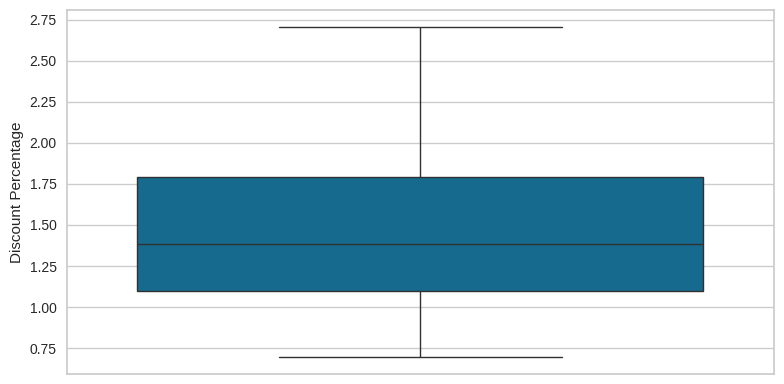

In [ ]:
plt.figure(figsize=(8,4))
fig = sns.boxplot(final_X_test['Discount Percentage'])
plt.tight_layout()
plt.show(fig)
plt.close('all')
del fig
gc.collect();

### Feature Scaling

In [ ]:
scaler = StandardScaler()
features = final_X_train.columns
final_X_train = scaler.fit_transform(final_X_train)
final_X_train = pd.DataFrame(final_X_train,columns=features)
final_X_test = scaler.transform(final_X_test)
final_X_test = pd.DataFrame(final_X_test,columns=features)
final_X_train.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,0.738777,0.620435,-0.324229,1.009995,1.083957,-0.650256,0.361982,-0.093987,-0.231513
1,1.398690,1.271876,-0.412458,1.378259,-0.361693,0.840780,1.277878,1.043587,-0.823287
2,1.092383,0.620435,0.171010,0.414783,1.084082,-0.306171,-0.248614,0.474800,1.543812
3,-0.191318,-0.952285,-0.755604,-0.483757,1.211884,0.955475,-0.859211,1.384859,0.952037
4,-0.851232,0.620435,-0.097214,0.642144,0.167933,-0.420866,-0.248614,0.133528,0.360262


In [ ]:
final_X_test.head()

,Discount Percentage,Postal Code,Discount,Order Day,Order Month,Quantity,Operating Expenses,Ship Day,Order Weekday
0,-0.851232,-0.952285,-0.755604,0.622479,1.336351,0.037914,-1.469808,0.247285,0.952037
1,-0.851232,0.620435,1.246647,-0.296776,1.211915,0.496695,0.667281,1.043587,-1.415062
2,-0.851232,0.620435,1.963591,-1.764067,-0.716927,-1.567816,-0.859211,-1.004046,0.952037
3,-1.781327,-0.952285,-0.755604,-0.708771,1.212289,-1.223731,0.056684,-0.549016,0.952037
4,1.398690,0.620435,-0.650184,1.662262,0.618871,-0.764951,1.277878,-0.549016,-1.415062


In [ ]:
imputer = SimpleImputer(strategy='mean')
y_train = imputer.fit_transform(y_train.values.reshape(-1,1))
y_test = imputer.transform(y_test.values.reshape(-1,1))

## Model Training & Evaluation

In [ ]:
models = []
mae_scores = []
mse_scores = []
rmse_scores = []
mape_scores = []
r2_scores = []
training_times = []

In [ ]:
def train_and_evaluate_model(model):
    start_time = time.time()
    model.fit(final_X_train,y_train)
    duration = time.time() - start_time
    y_pred = model.predict(final_X_test)
    r2 = r2_score(y_test,y_pred)
    mae = mean_absolute_error(y_test,y_pred)
    mse = mean_squared_error(y_test,y_pred)
    rmse = np.sqrt(mean_squared_error(y_test,y_pred))
    mape = mean_absolute_percentage_error(y_test,y_pred)
    print("Mean Absolute Error:",mae)
    print("Mean Squared Error:",mse)
    print("Root Mean Squared Error:",rmse)
    print("Mean Absolute Percentage Error:",mape)
    print("R2 Score:",r2)
    print("Training Time:",duration)
    training_times.append(duration)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mape_scores.append(mape)
    r2_scores.append(r2)
    models.append(model)

    try:
        prediction_error = PredictionError(estimator=model)
        prediction_error.score(final_X_test,y_test)
        prediction_error.show()
        res_plot = ResidualsPlot(estimator=model)
        res_plot.score(final_X_test,y_test)
        res_plot.show()
        del r2, mae, mape, rmse, duration, prediction_error, res_plot
    except Exception as e:
        pass

    gc.collect()

Mean Absolute Error: 215.12424954990166
Mean Squared Error: 168822.79323107682
Root Mean Squared Error: 410.88050967535173
Mean Absolute Percentage Error: 11.640287252567646
R2 Score: 0.37184465699418356
Training Time: 0.014354944229125977


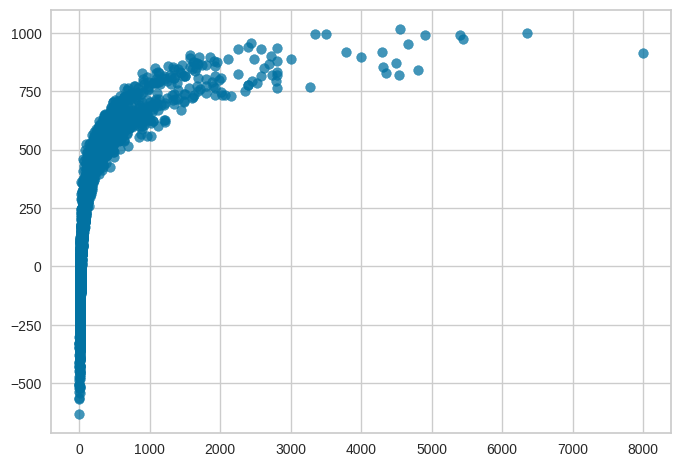

In [ ]:
train_and_evaluate_model(LinearRegression())

Mean Absolute Error: 155.85090323011386
Mean Squared Error: 218661.72857700073
Root Mean Squared Error: 467.6127977044691
Mean Absolute Percentage Error: 3.3186100599004713
R2 Score: 0.1864040957518842
Training Time: 0.029278039932250977


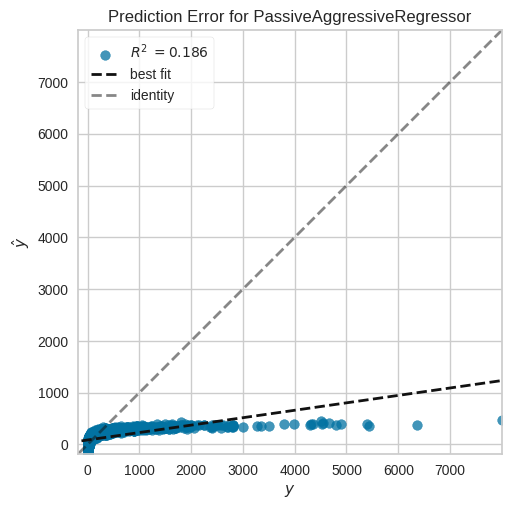

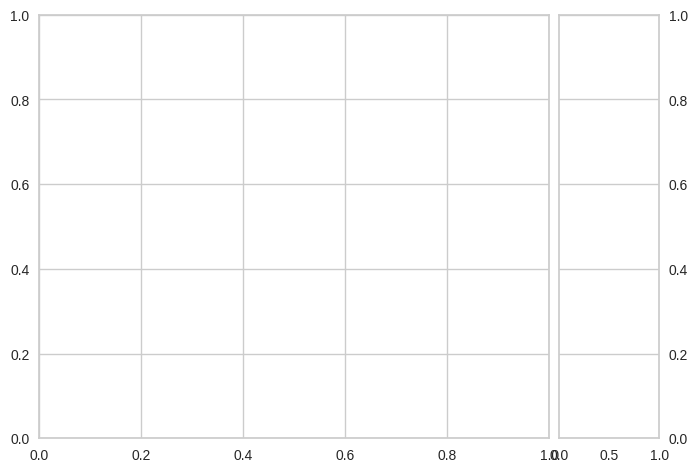

In [ ]:
train_and_evaluate_model(PassiveAggressiveRegressor())

Mean Absolute Error: 222.65523668925087
Mean Squared Error: 169553.7323869535
Root Mean Squared Error: 411.76902795979385
Mean Absolute Percentage Error: 12.582932736541869
R2 Score: 0.3691249807739967
Training Time: 0.02709674835205078


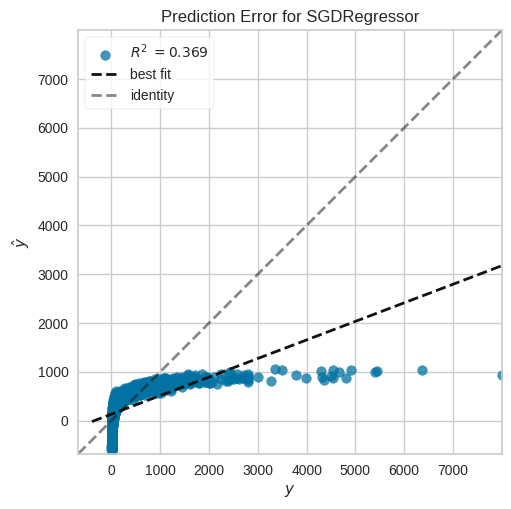

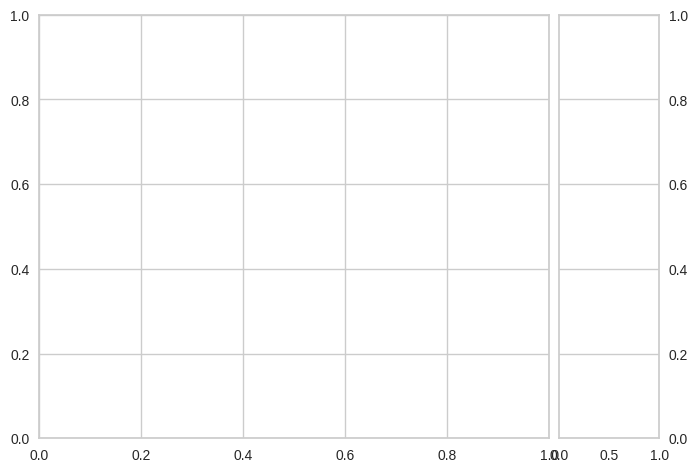

In [ ]:
train_and_evaluate_model(SGDRegressor())

Mean Absolute Error: 215.1160143856675
Mean Squared Error: 168821.35408924212
Root Mean Squared Error: 410.8787583816449
Mean Absolute Percentage Error: 11.638784546183128
R2 Score: 0.3718500117488083
Training Time: 0.018151044845581055


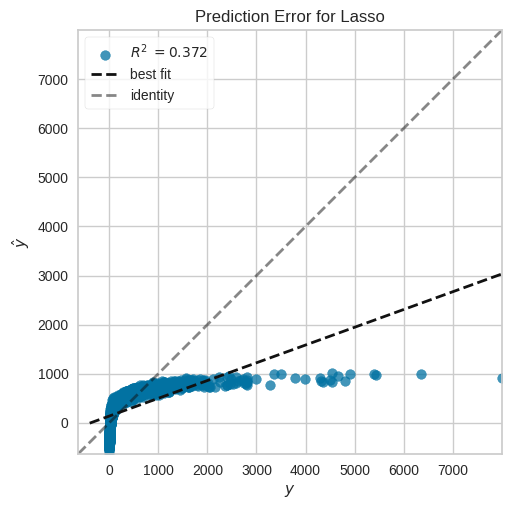

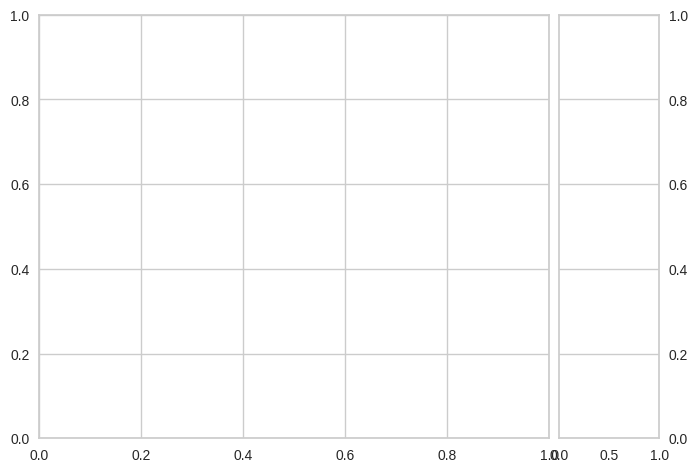

In [ ]:
train_and_evaluate_model(Lasso(alpha=0.01))

Mean Absolute Error: 215.12422515721096
Mean Squared Error: 168822.79172360286
Root Mean Squared Error: 410.8805078409085
Mean Absolute Percentage Error: 11.640283159681264
R2 Score: 0.37184466260318827
Training Time: 0.005535602569580078


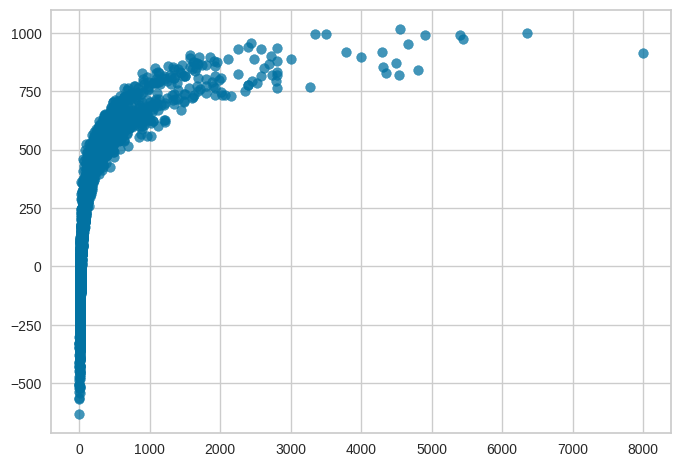

In [ ]:
train_and_evaluate_model(Ridge(alpha=0.001))

Mean Absolute Error: 188.20078546656038
Mean Squared Error: 185784.7567364288
Root Mean Squared Error: 431.02755913796136
Mean Absolute Percentage Error: 5.499333200258669
R2 Score: 0.30873263402716167
Training Time: 0.0063822269439697266


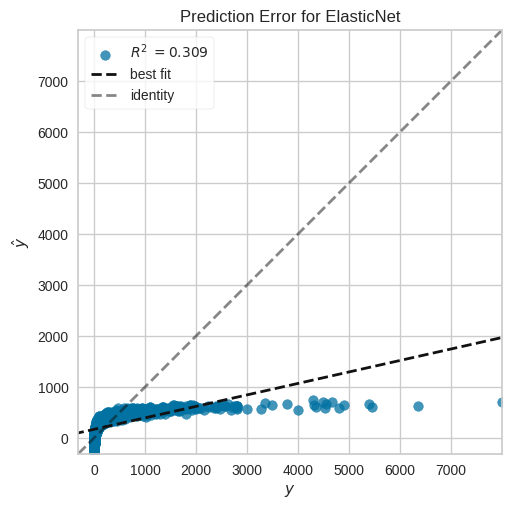

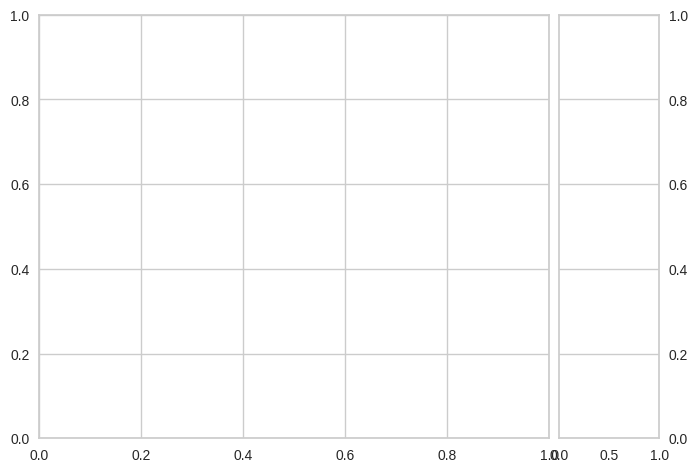

In [ ]:
train_and_evaluate_model(ElasticNet(l1_ratio=0.3))

In [ ]:
train_and_evaluate_model(PoissonRegressor())

Mean Absolute Error: 43.497852041894184
Mean Squared Error: 22084.41435904459
Root Mean Squared Error: 148.60825804458037
Mean Absolute Percentage Error: 0.28648833491147874
R2 Score: 0.9178283772511673
Training Time: 0.05935811996459961


In [ ]:
train_and_evaluate_model(TweedieRegressor())

Mean Absolute Error: 188.8501071830238
Mean Squared Error: 192497.30020492067
Root Mean Squared Error: 438.7451426567828
Mean Absolute Percentage Error: 4.6945284207179725
R2 Score: 0.2837566224105278
Training Time: 0.01985931396484375


Mean Absolute Error: 158.88930590401637
Mean Squared Error: 200825.18212654526
Root Mean Squared Error: 448.13522750007644
Mean Absolute Percentage Error: 5.465077355213
R2 Score: 0.25277026431947425
Training Time: 2.7660391330718994


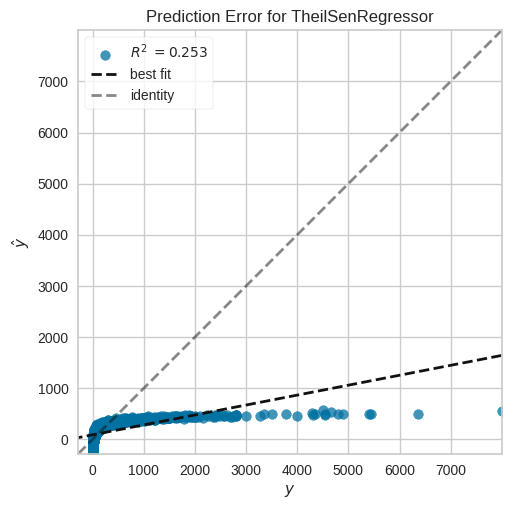

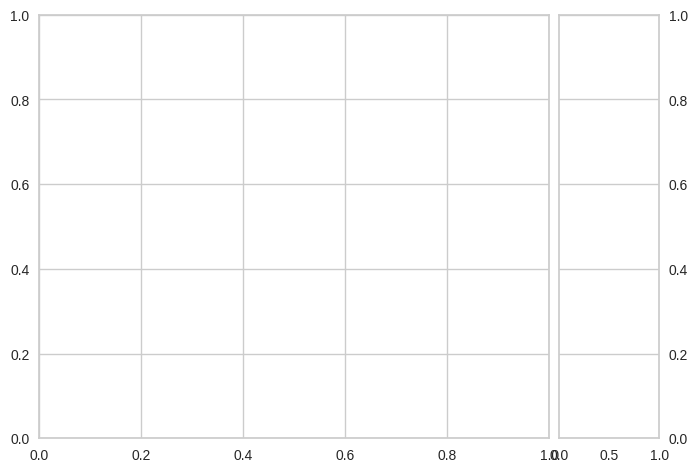

In [ ]:
train_and_evaluate_model(TheilSenRegressor())

In [ ]:
train_and_evaluate_model(GammaRegressor())

Mean Absolute Error: 134.94244971334686
Mean Squared Error: 192317.50379138053
Root Mean Squared Error: 438.5401963234163
Mean Absolute Percentage Error: 1.058933070955215
R2 Score: 0.28442560836708597
Training Time: 0.021098613739013672


Mean Absolute Error: 155.03036096796194
Mean Squared Error: 210648.52416306228
Root Mean Squared Error: 458.9646219079007
Mean Absolute Percentage Error: 3.8849720959929477
R2 Score: 0.21621960271558882
Training Time: 0.09195399284362793


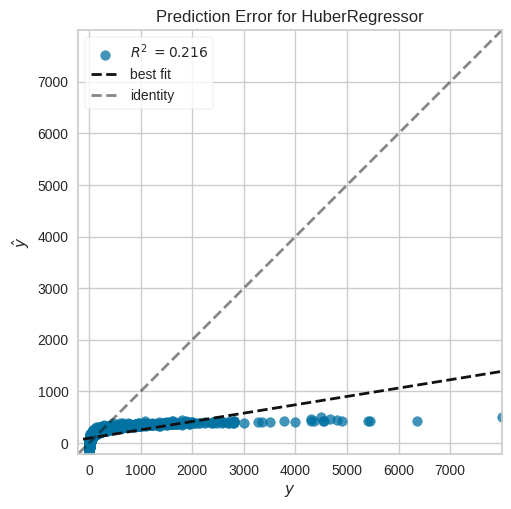

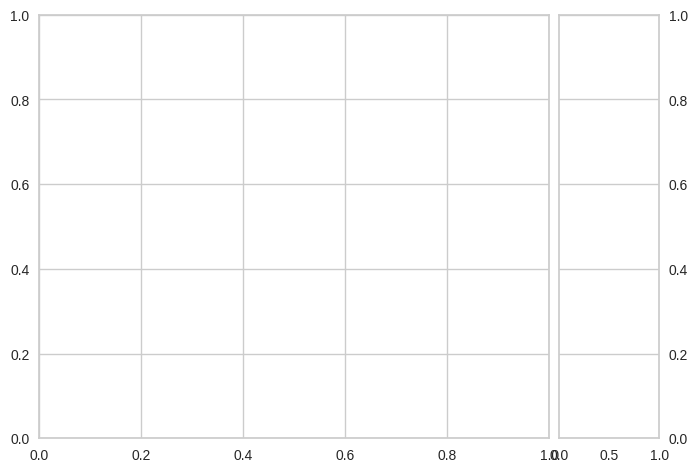

In [ ]:
train_and_evaluate_model(HuberRegressor())

Mean Absolute Error: 214.79950499632145
Mean Squared Error: 168805.17917338715
Root Mean Squared Error: 410.85907459053055
Mean Absolute Percentage Error: 11.585731924365437
R2 Score: 0.371910195327237
Training Time: 0.03190350532531738


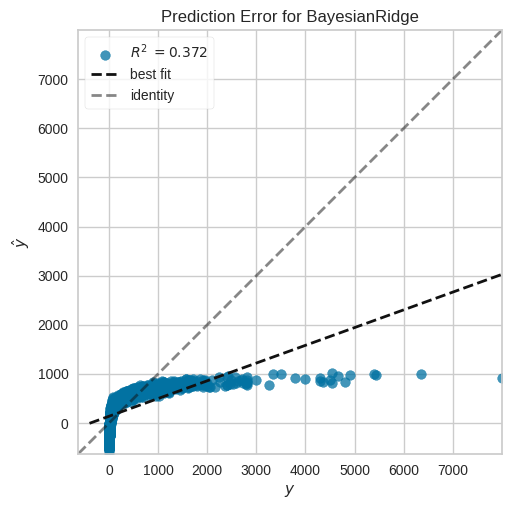

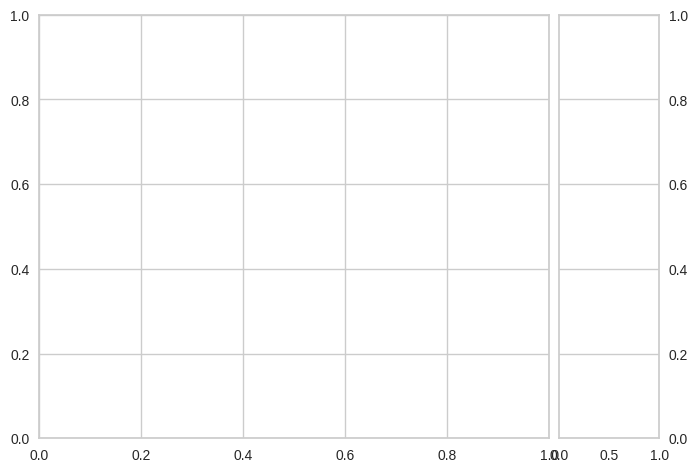

In [ ]:
train_and_evaluate_model(BayesianRidge())

Mean Absolute Error: 214.78129875166266
Mean Squared Error: 168760.77041191875
Root Mean Squared Error: 410.8050272476211
Mean Absolute Percentage Error: 11.591777773955364
R2 Score: 0.3720754313137927
Training Time: 0.031150341033935547


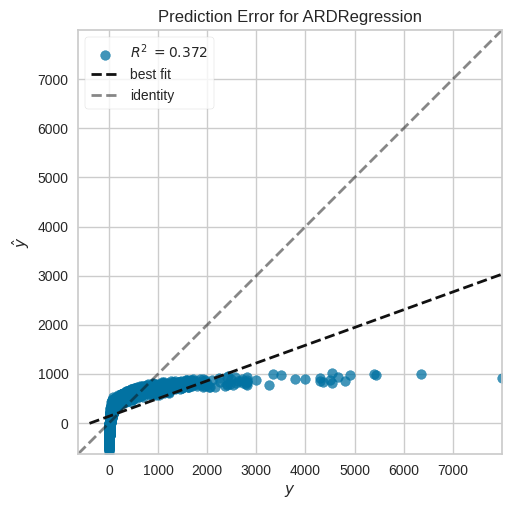

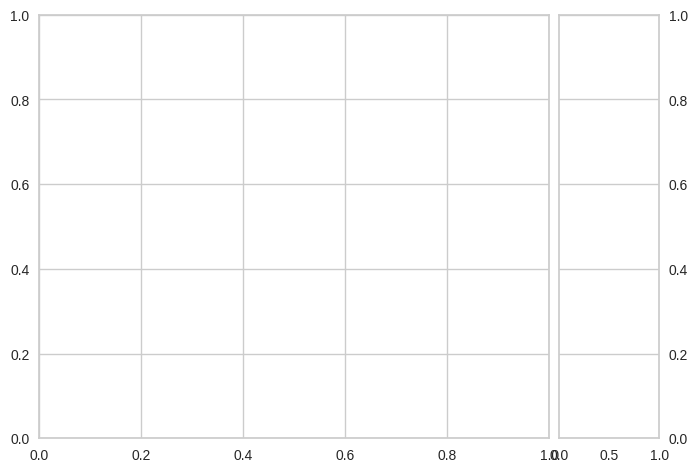

In [ ]:
train_and_evaluate_model(ARDRegression())

Mean Absolute Error: 170.51242827267515
Mean Squared Error: 230201.4873018299
Root Mean Squared Error: 479.79317137890774
Mean Absolute Percentage Error: 3.3411188620893735
R2 Score: 0.14346699607910685
Training Time: 0.25027894973754883


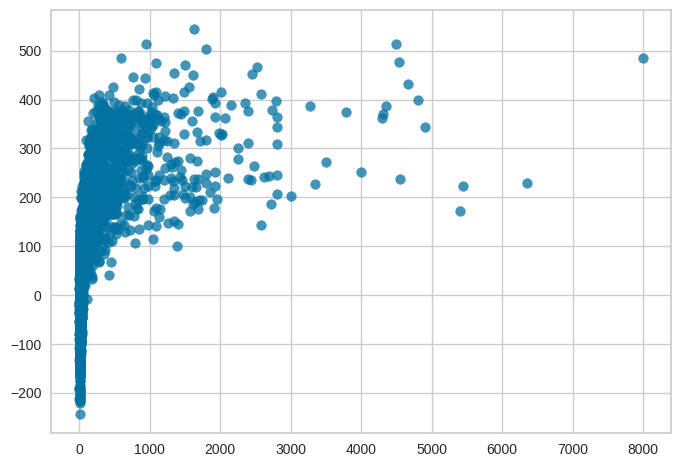

In [ ]:
train_and_evaluate_model(RANSACRegressor())

Mean Absolute Error: 92.6262619686353
Mean Squared Error: 123612.28822520103
Root Mean Squared Error: 351.5853925082796
Mean Absolute Percentage Error: 0.37654541079972825
R2 Score: 0.5400637685010081
Training Time: 0.028858423233032227


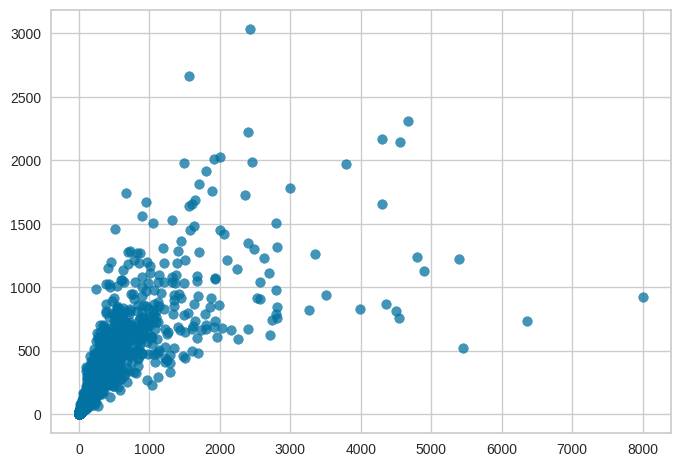

In [ ]:
train_and_evaluate_model(KNeighborsRegressor())

Mean Absolute Error: 142.51859779644187
Mean Squared Error: 235954.67006548587
Root Mean Squared Error: 485.7516547223343
Mean Absolute Percentage Error: 0.6650871816985049
R2 Score: 0.12206057089733091
Training Time: 2.787445068359375


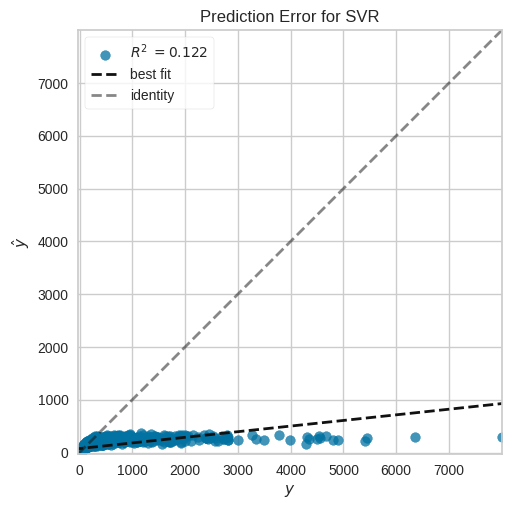

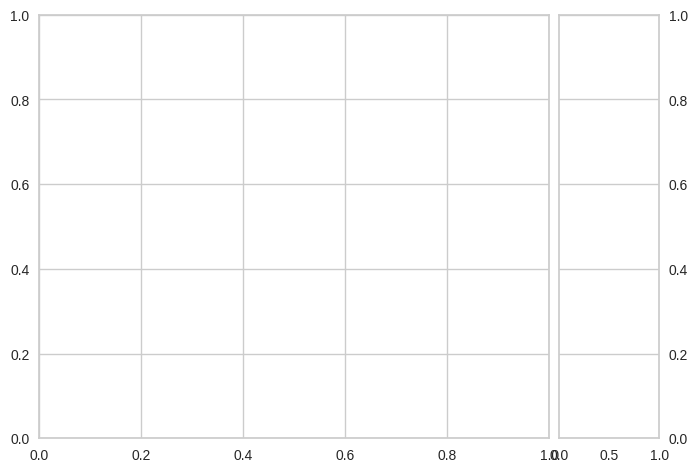

In [ ]:
train_and_evaluate_model(SVR())

Mean Absolute Error: 153.91428217480484
Mean Squared Error: 222108.71595725807
Root Mean Squared Error: 471.2841138392616
Mean Absolute Percentage Error: 3.0787881255752607
R2 Score: 0.17357855543980927
Training Time: 0.02317357063293457


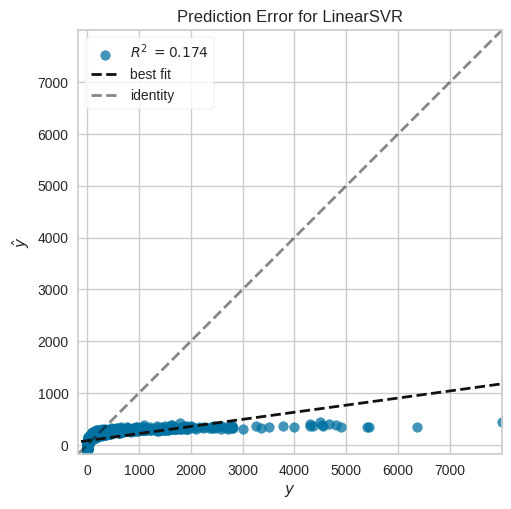

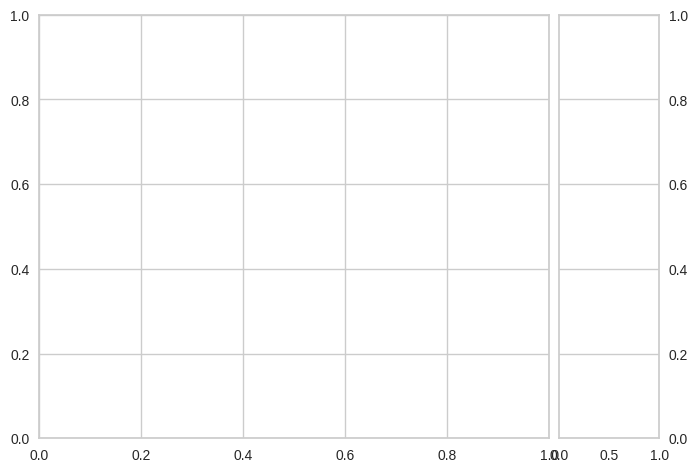

In [ ]:
train_and_evaluate_model(LinearSVR())

Mean Absolute Error: 145.95826786217333
Mean Squared Error: 232235.05919497958
Root Mean Squared Error: 481.907728922228
Mean Absolute Percentage Error: 1.2327390685560433
R2 Score: 0.13590048787473208
Training Time: 2.129080057144165


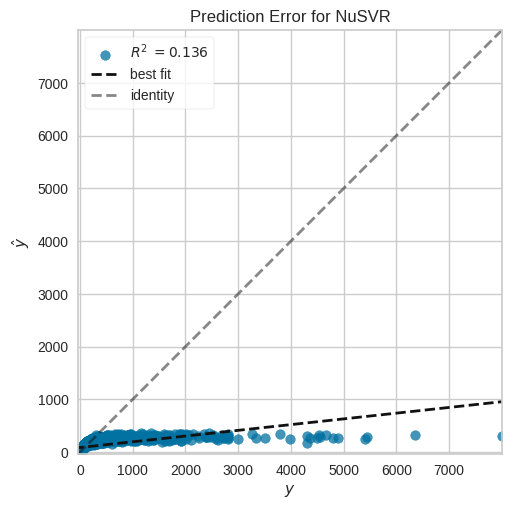

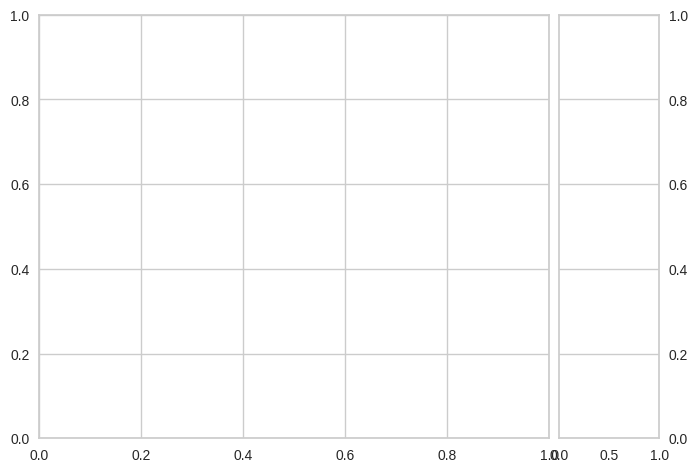

In [ ]:
train_and_evaluate_model(NuSVR())

Mean Absolute Error: 31.661098331664995
Mean Squared Error: 26904.955076682545
Root Mean Squared Error: 164.02729979086575
Mean Absolute Percentage Error: 0.10342071962378814
R2 Score: 0.8998921237986094
Training Time: 0.06461858749389648


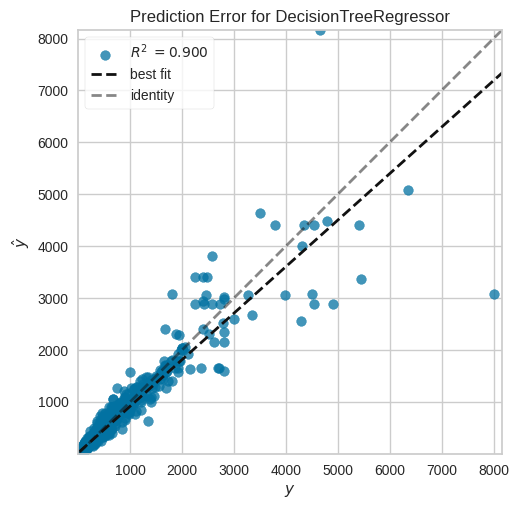

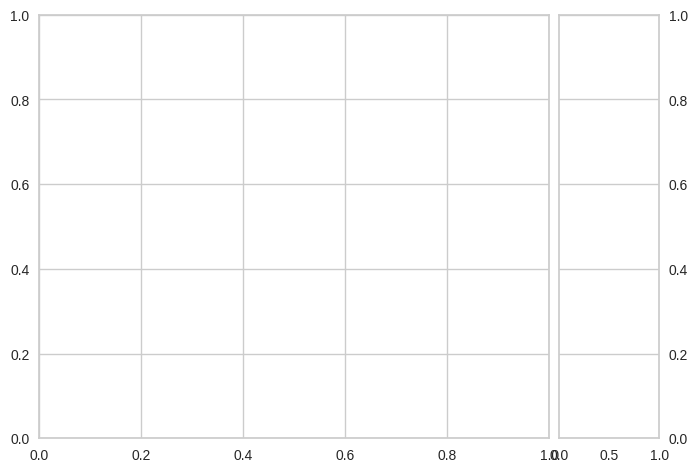

In [ ]:
train_and_evaluate_model(DecisionTreeRegressor())

Mean Absolute Error: 21.14701405805805
Mean Squared Error: 10219.212289281973
Root Mean Squared Error: 101.09011964223791
Mean Absolute Percentage Error: 0.07573286527700562
R2 Score: 0.9619763855462526
Training Time: 2.8601226806640625


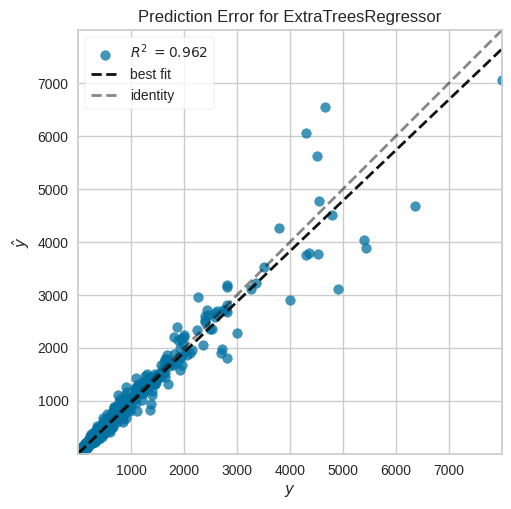

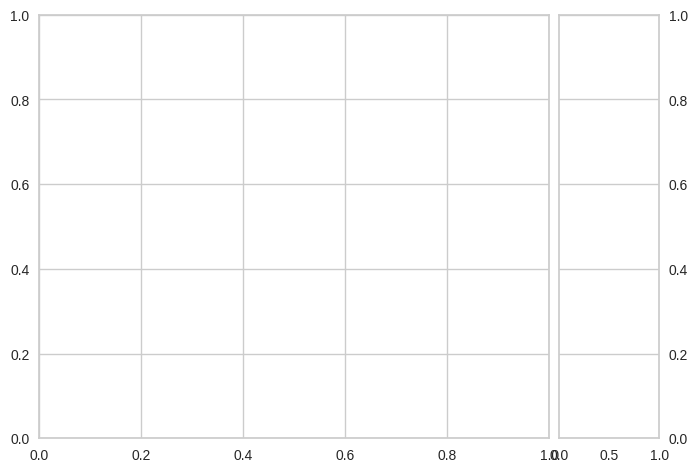

In [ ]:
train_and_evaluate_model(ExtraTreesRegressor())

Mean Absolute Error: 153.14304441465987
Mean Squared Error: 47924.68739451189
Root Mean Squared Error: 218.91707880956181
Mean Absolute Percentage Error: 9.43850083597492
R2 Score: 0.821681966797333
Training Time: 0.4704601764678955


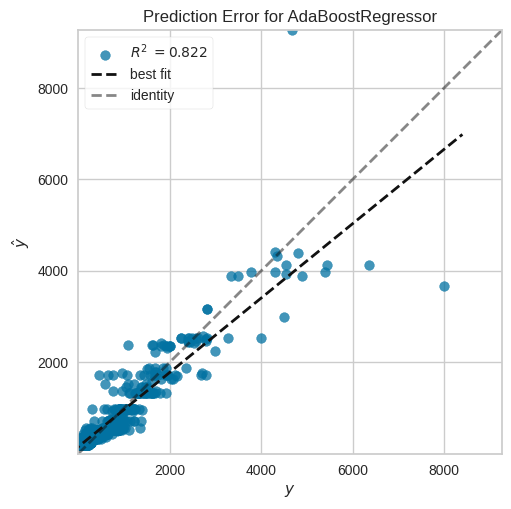

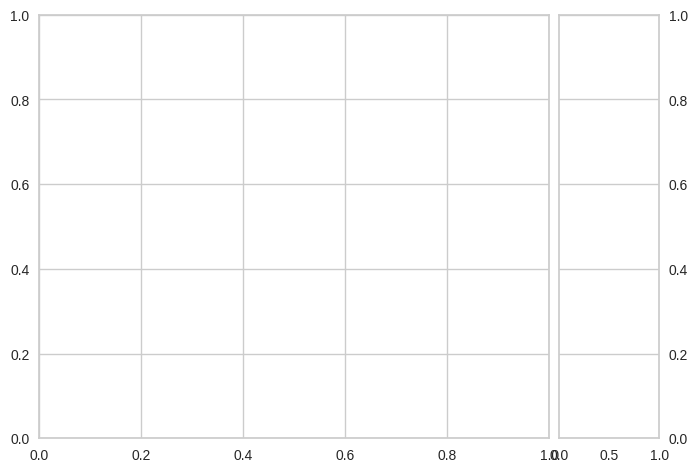

In [ ]:
train_and_evaluate_model(AdaBoostRegressor())

Mean Absolute Error: 25.423018108108106
Mean Squared Error: 15649.5743916025
Root Mean Squared Error: 125.09825894712723
Mean Absolute Percentage Error: 0.08754954688259349
R2 Score: 0.9417711105135148
Training Time: 0.44901299476623535


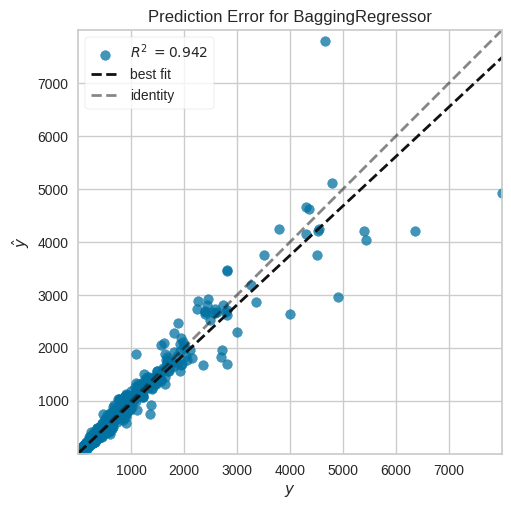

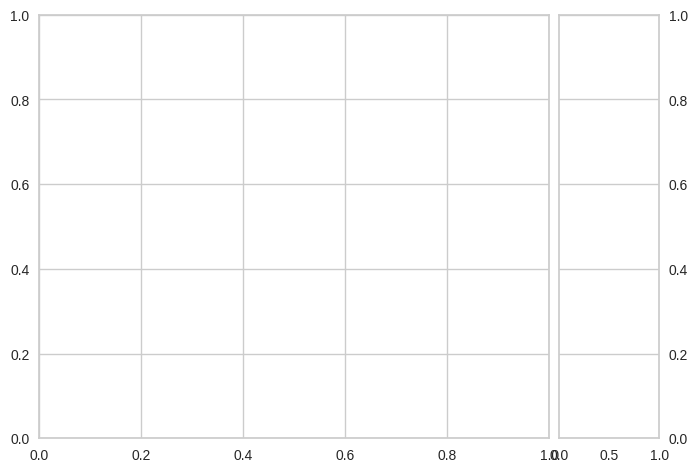

In [ ]:
train_and_evaluate_model(BaggingRegressor())

Mean Absolute Error: 29.155710041041907
Mean Squared Error: 17444.18534184954
Root Mean Squared Error: 132.07643749681296
Mean Absolute Percentage Error: 0.2831744848853966
R2 Score: 0.9350937274692037
Training Time: 1.2166013717651367


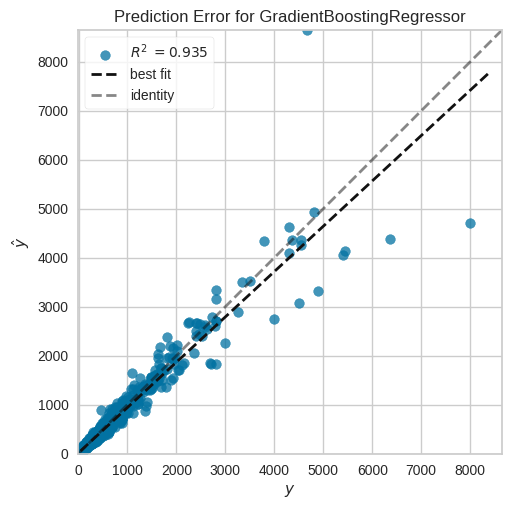

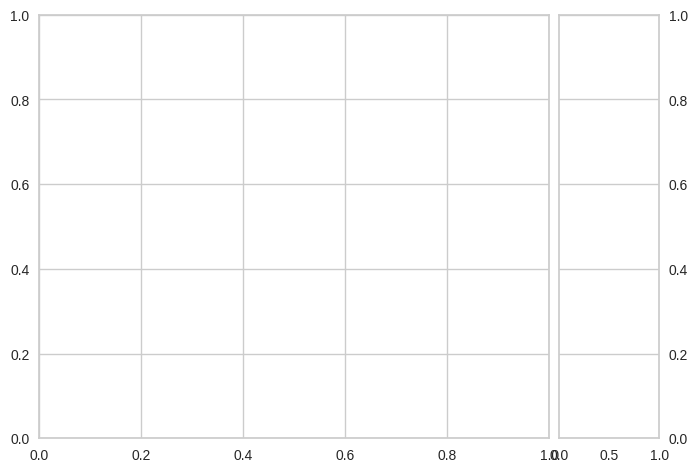

In [ ]:
train_and_evaluate_model(GradientBoostingRegressor())

Mean Absolute Error: 29.120464832123265
Mean Squared Error: 16345.218563973447
Root Mean Squared Error: 127.84842026389472
Mean Absolute Percentage Error: 0.1571122095001282
R2 Score: 0.9391827597621589
Training Time: 0.37001633644104004


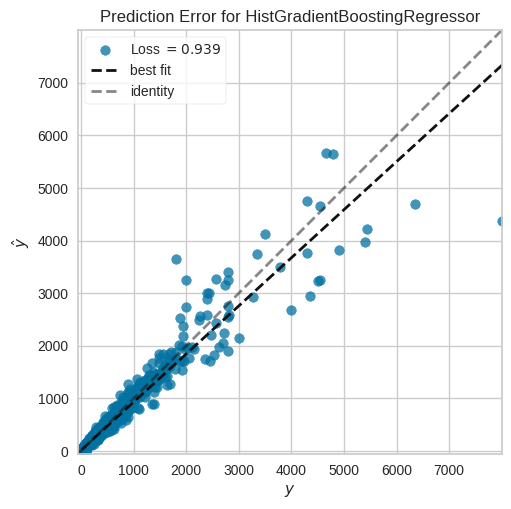

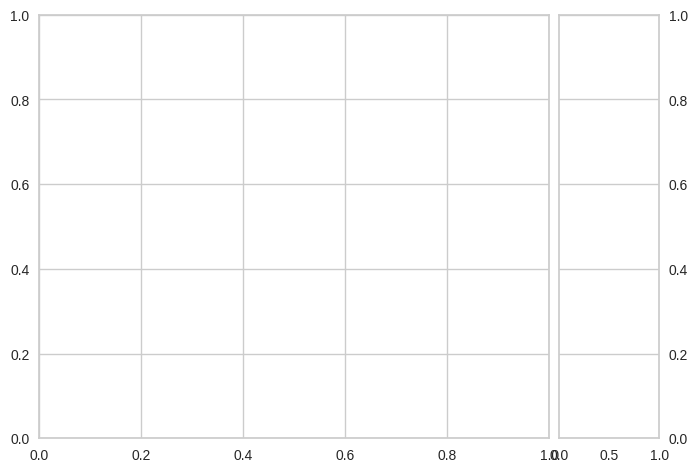

In [ ]:
train_and_evaluate_model(HistGradientBoostingRegressor())

Mean Absolute Error: 24.009893563563544
Mean Squared Error: 13886.048728084535
Root Mean Squared Error: 117.8390797998887
Mean Absolute Percentage Error: 0.08261159358477818
R2 Score: 0.9483328315161429
Training Time: 4.3731842041015625


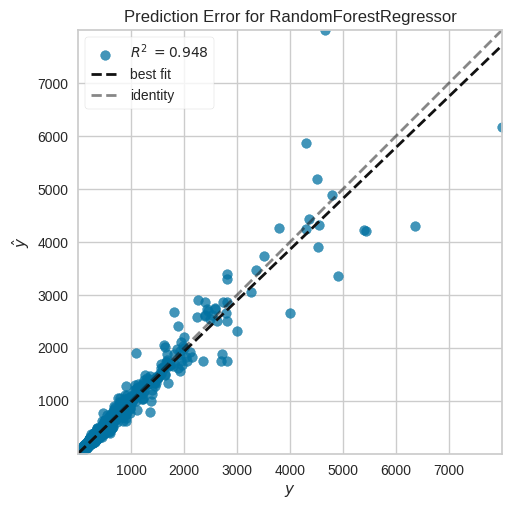

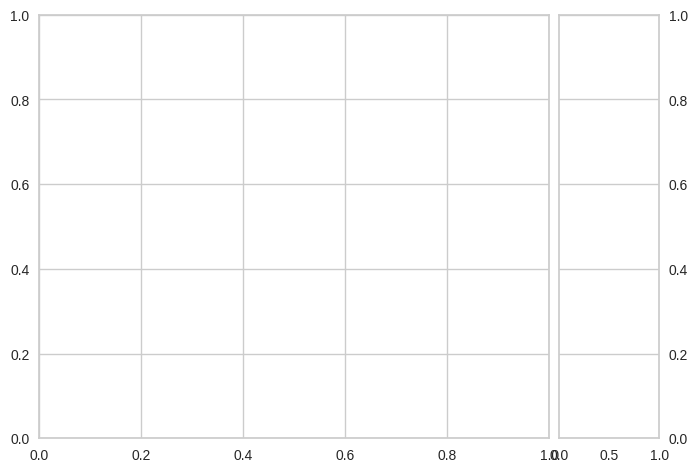

In [ ]:
train_and_evaluate_model(RandomForestRegressor())

Mean Absolute Error: 26.505594448707555
Mean Squared Error: 16658.831996241013
Root Mean Squared Error: 129.0690977586851
Mean Absolute Percentage Error: 0.12803225160945836
R2 Score: 0.9380158678434378
Training Time: 0.16655278205871582


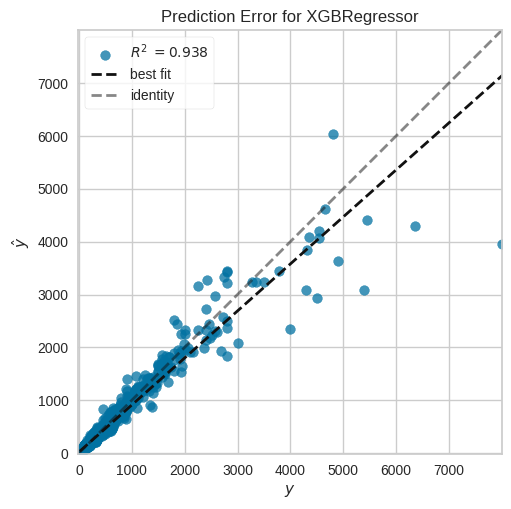

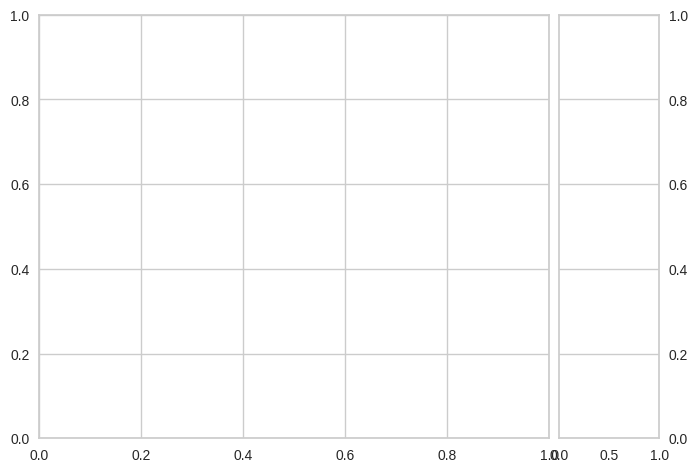

In [ ]:
train_and_evaluate_model(XGBRegressor())

In [ ]:
train_and_evaluate_model(CatBoostRegressor(silent=True))

Mean Absolute Error: 26.66194536465631
Mean Squared Error: 12563.629773543687
Root Mean Squared Error: 112.08759866079605
Mean Absolute Percentage Error: 0.17723747581474805
R2 Score: 0.9532532839982316
Training Time: 4.641543626785278


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000774 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 874
[LightGBM] [Info] Number of data points in the train set: 6991, number of used features: 9
[LightGBM] [Info] Start training from score 221.910060
Mean Absolute Error: 26.720828524094532
Mean Squared Error: 12040.828624086993
Root Mean Squared Error: 109.73070957615737
Mean Absolute Percentage Error: 0.15609367079443184
R2 Score: 0.9551985209480273
Training Time: 0.1669766902923584


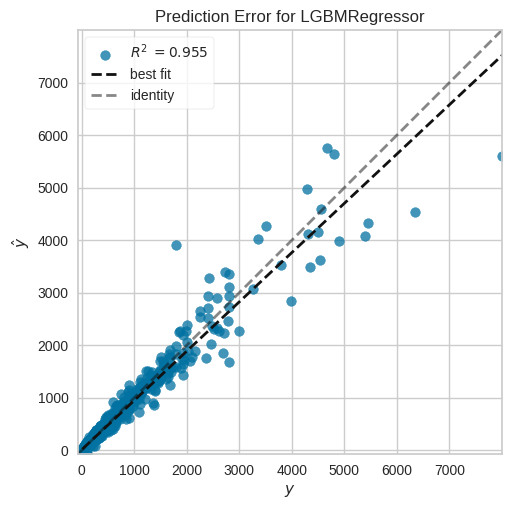

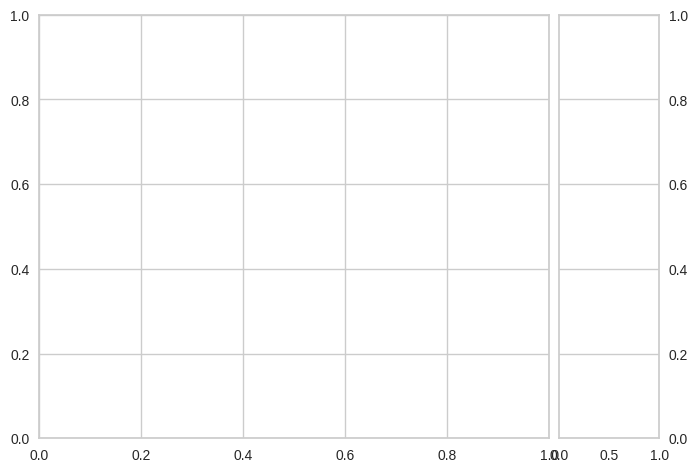

In [ ]:
train_and_evaluate_model(LGBMRegressor())

In [ ]:
train_and_evaluate_model(NGBRegressor())

[iter 0] loss=7.6922 val_loss=0.0000 scale=1.0000 norm=255.5840
[iter 100] loss=6.3546 val_loss=0.0000 scale=2.0000 norm=100.8828
[iter 200] loss=5.4684 val_loss=0.0000 scale=2.0000 norm=53.5144
[iter 300] loss=4.6673 val_loss=0.0000 scale=4.0000 norm=91.1592
[iter 400] loss=4.1970 val_loss=0.0000 scale=2.0000 norm=43.3512
Mean Absolute Error: 28.860419716563797
Mean Squared Error: 17219.62710133454
Root Mean Squared Error: 131.22357677389584
Mean Absolute Percentage Error: 0.2730872149892366
R2 Score: 0.9359292630973959
Training Time: 20.724771976470947


Mean Absolute Error: 28.95694813369558
Mean Squared Error: 14002.572564724673
Root Mean Squared Error: 118.33246623274896
Mean Absolute Percentage Error: 0.3444191584860075
R2 Score: 0.9478992699740538
Training Time: 0.2141404151916504


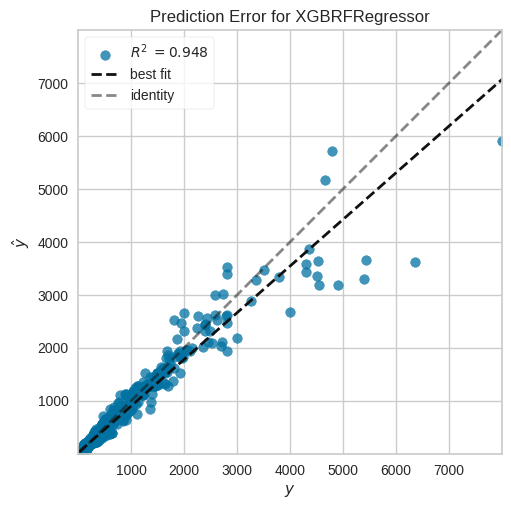

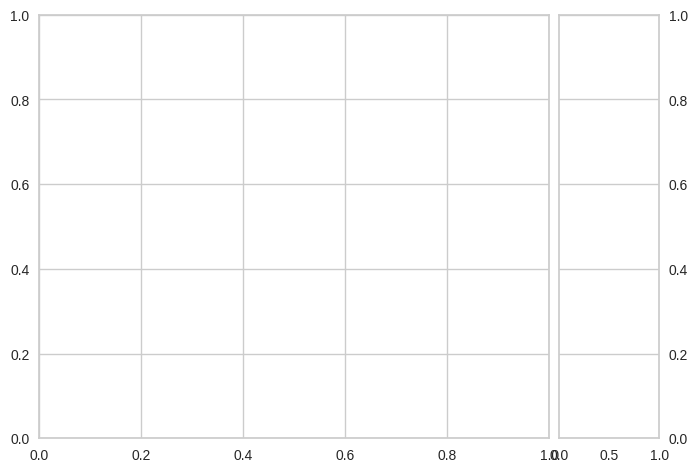

In [ ]:
train_and_evaluate_model(XGBRFRegressor())

Mean Absolute Error: 106.48748931269328
Mean Squared Error: 82718.42379415575
Root Mean Squared Error: 287.6081080118496
Mean Absolute Percentage Error: 1.94789113550229
R2 Score: 0.6922215366961858
Training Time: 9.213232517242432


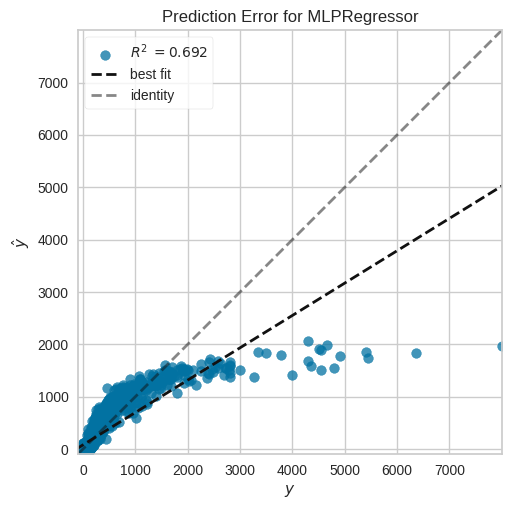

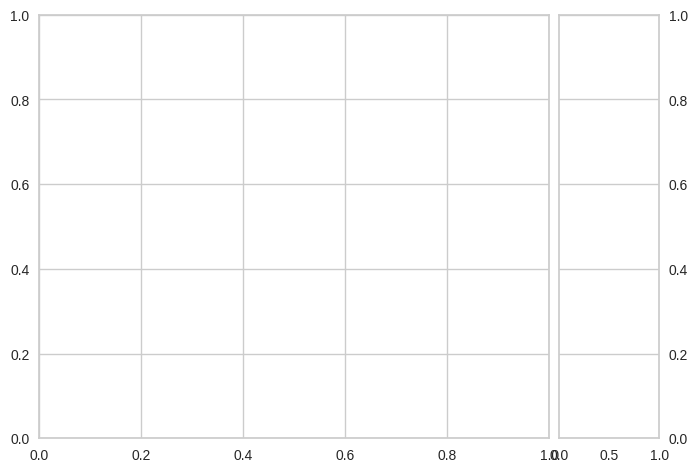

In [ ]:
train_and_evaluate_model(MLPRegressor())

## Baseline Models Performance Comparison

In [ ]:
model_perfs = pd.DataFrame({'Model': models,
                            'R2': r2_scores,
                            'MAE': mape_scores,
                            'MSE': mse_scores,
                            'RMSE': rmse_scores,
                            'Training Time': training_times}).sort_values('R2',ascending=False).reset_index(drop=True)
model_perfs

,Model,R2,MAE,MSE,RMSE,Training Time
0,"(ExtraTreeRegressor(random_state=486601332), E...",0.961976,0.075733,10219.212289,101.090120,2.860123
1,LGBMRegressor(),0.955199,0.156094,12040.828624,109.730710,0.166977
2,<catboost.core.CatBoostRegressor object at 0x7...,0.953253,0.177237,12563.629774,112.087599,4.641544
3,"(DecisionTreeRegressor(max_features=1.0, rando...",0.948333,0.082612,13886.048728,117.839080,4.373184
4,"XGBRFRegressor(base_score=None, booster=None, ...",0.947899,0.344419,14002.572565,118.332466,0.214140
5,(DecisionTreeRegressor(random_state=1446994308...,0.941771,0.087550,15649.574392,125.098259,0.449013
6,HistGradientBoostingRegressor(),0.939183,0.157112,16345.218564,127.848420,0.370016
7,"XGBRegressor(base_score=None, booster=None, ca...",0.938016,0.128032,16658.831996,129.069098,0.166553
8,NGBRegressor(random_state=RandomState(MT19937)...,0.935929,0.273087,17219.627101,131.223577,20.724772
9,([DecisionTreeRegressor(criterion='friedman_ms...,0.935094,0.283174,17444.185342,132.076437,1.216601


The Extra Trees Regressor is the best performing model which achieved an incredible r2 score of more than 97% on the test set. It's closely followed by the Decision Trees Regressor model which produced an amazing r2 score of approximately 96.2%.

## Cross Validation & Hyperparameter Tuning

In [ ]:
print(f"Mean cross validation training R2 score of Extra Trees Regressor: {round(np.mean(cross_val_score(model_perfs['Model'].iloc[0],final_X_train,y_train,cv=5,scoring='r2',verbose=0))*100,2)}%")

Mean cross validation training R2 score of Extra Trees Regressor: 94.66%


In [ ]:
print(f"Mean cross validation test R2 score of Extra Trees Regressor: {round(np.mean(cross_val_score(model_perfs['Model'].iloc[0],final_X_test,y_test,cv=5,scoring='r2',verbose=0))*100,2)}%")

Mean cross validation test R2 score of Extra Trees Regressor: 94.63%


The cross validation R2 score of the Extra Trees Regressor model on the test set is comparable to the training cross validation R2 score so there seems to be no overfitting.

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END algorithm=kd_tree, metric=minkowski, n_neighbors=20, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=minkowski, n_neighbors=20, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=minkowski, n_neighbors=20, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=minkowski, n_neighbors=20, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=minkowski, n_neighbors=20, p=2, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=euclidean, n_neighbors=20, p=1, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=euclidean, n_neighbors=20, p=1, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=euclidean, n_neighbors=20, p=1, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=euclidean, n_neighbors=20, p=1, weights=distance; total time=   0.1s
[CV

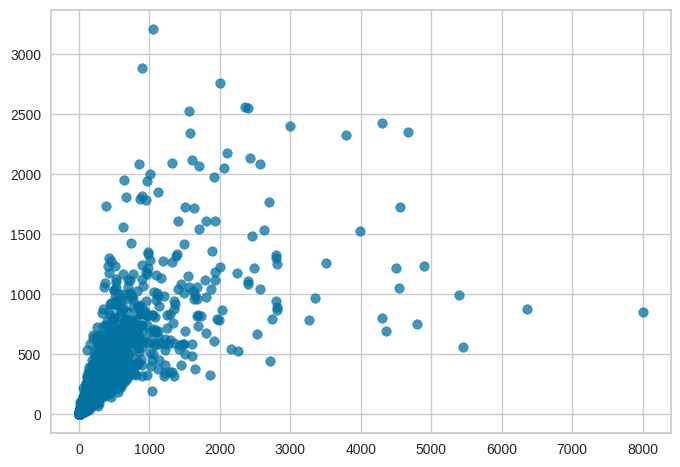

In [ ]:
param_grid = {'n_neighbors': [2,8,12,20],
              'weights': ['uniform','distance'],
              'algorithm': ['ball_tree', 'brute', 'kd_tree'],
              'metric': ['minkowski','manhattan','euclidean','chebyshev'],
              'p': [1,2]
             }

grid_knn = RandomizedSearchCV(KNeighborsRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_knn)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END interaction_cst=pairwise, learning_rate=0.2, loss=poisson, max_bins=250; total time=   0.4s
[CV] END interaction_cst=pairwise, learning_rate=0.2, loss=poisson, max_bins=250; total time=   0.4s
[CV] END interaction_cst=pairwise, learning_rate=0.2, loss=poisson, max_bins=250; total time=   0.3s
[CV] END interaction_cst=pairwise, learning_rate=0.2, loss=poisson, max_bins=250; total time=   0.4s
[CV] END interaction_cst=pairwise, learning_rate=0.2, loss=poisson, max_bins=250; total time=   0.3s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=absolute_error, max_bins=50; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=absolute_error, max_bins=50; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=absolute_error, max_bins=50; total time=   0.0s
[CV] END interaction_cst=no_interaction, learning_rate=1.0, loss=absolute_error, max_bins=50; t

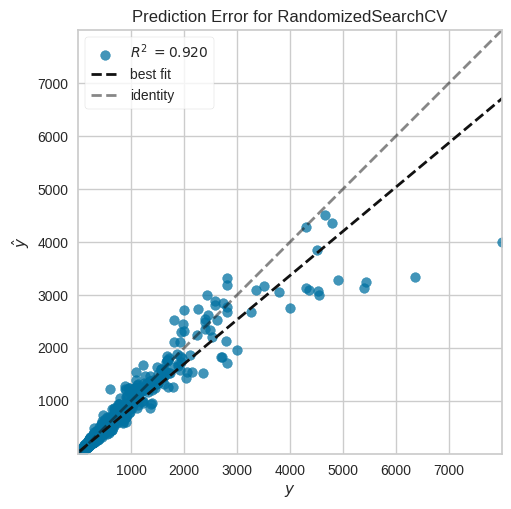

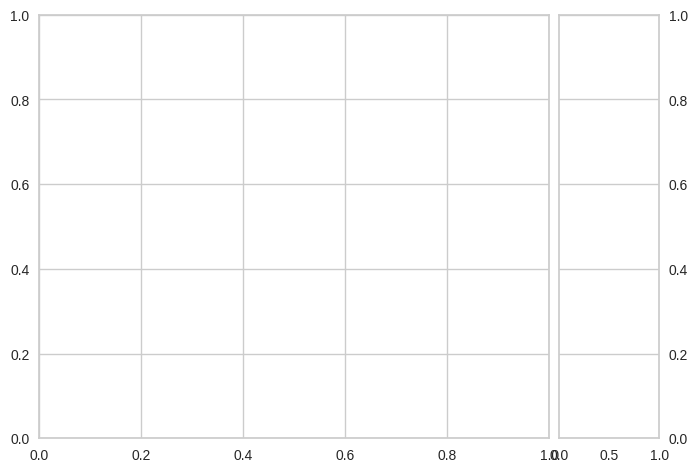

In [ ]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.8,1.0],
              'loss': ['squared_error','absolute_error','poisson','quantile'],
              'max_bins': np.arange(0,255,50),
              'interaction_cst': ['pairwise','no_interaction']}

grid_hgb = RandomizedSearchCV(HistGradientBoostingRegressor(),param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_hgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Mean Absolute Error: 213.60103376309803
Mean Squared Error: 168811.94142569473
Root Mean Squared Error: 410.8673039141649
Mean Absolute Percentage Error: 11.492425631510756
R2 Score: 0.3718850343591208
Training Time: 18.220937967300415


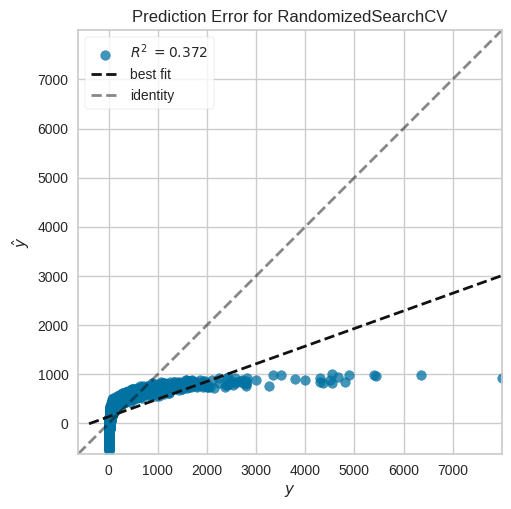

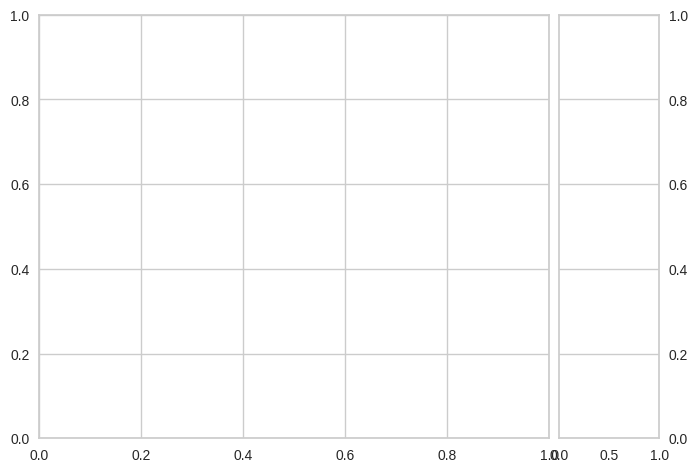

In [ ]:
param_grid = {'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
             'C': [0.0001,0.001,0.01,0.1,1],
             'epsilon': np.linspace(0.001,1,5)}

grid_lsvr = RandomizedSearchCV(LinearSVR(),param_grid,cv=5,verbose=2,n_jobs=10)
train_and_evaluate_model(grid_lsvr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END criterion=squared_error, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=squared_error, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=squared_error, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=squared_error, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=squared_error, max_features=auto, splitter=best; total time=   0.0s
[CV] END criterion=squared_error, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=squared_error, max_features=sqrt, splitter=random; total time=   0.0s
[CV] END criterion=squared_error, max_features=sqrt, splitter=random; total time=   0.1s
[CV] END criterion=squared_error, max_features=sqrt, splitter=random; total time=   0.1s
[CV] END criterion=squared_error, max_features=sqrt, splitter=random; total time=   0.1s
[CV] END criterion=friedman_mse, max_features=log2, splitte

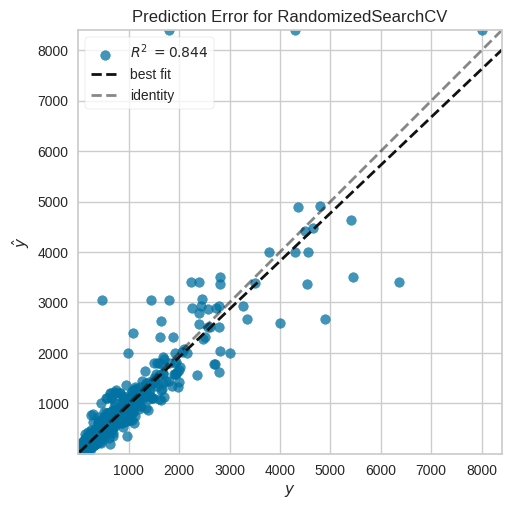

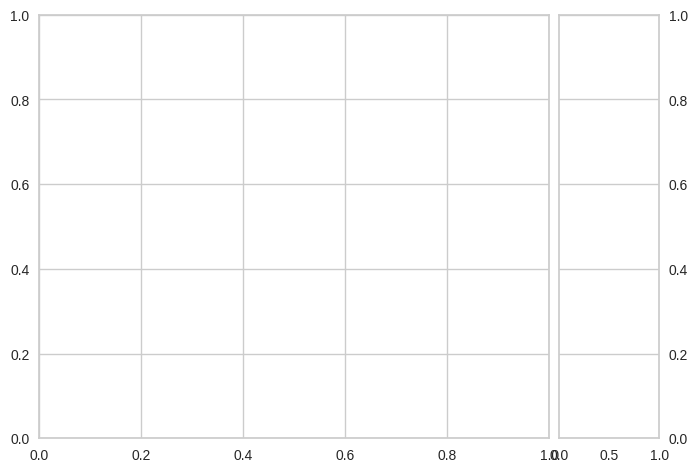

In [ ]:
param_grid = {'criterion': ['squared_error','friedman_mse','absolute_error','poisson'],
              'splitter': ['best','random'],
              'max_features': ['auto','sqrt','log2']
             }

grid_dt = RandomizedSearchCV(DecisionTreeRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_dt)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END criterion=squared_error, learning_rate=1, loss=quantile, max_features=sqrt, n_estimators=400;, score=-0.078 total time=   4.0s
[CV 2/5] END criterion=squared_error, learning_rate=1, loss=quantile, max_features=sqrt, n_estimators=400;, score=0.725 total time=   4.4s
[CV 3/5] END criterion=squared_error, learning_rate=1, loss=quantile, max_features=sqrt, n_estimators=400;, score=0.811 total time=   5.4s
[CV 4/5] END criterion=squared_error, learning_rate=1, loss=quantile, max_features=sqrt, n_estimators=400;, score=0.788 total time=   3.8s
[CV 5/5] END criterion=squared_error, learning_rate=1, loss=quantile, max_features=sqrt, n_estimators=400;, score=0.620 total time=   2.7s
[CV 1/5] END criterion=friedman_mse, learning_rate=0.7, loss=absolute_error, max_features=sqrt, n_estimators=1000;, score=0.929 total time=   6.5s
[CV 2/5] END criterion=friedman_mse, learning_rate=0.7, loss=absolute_error, max_features=sqrt, 

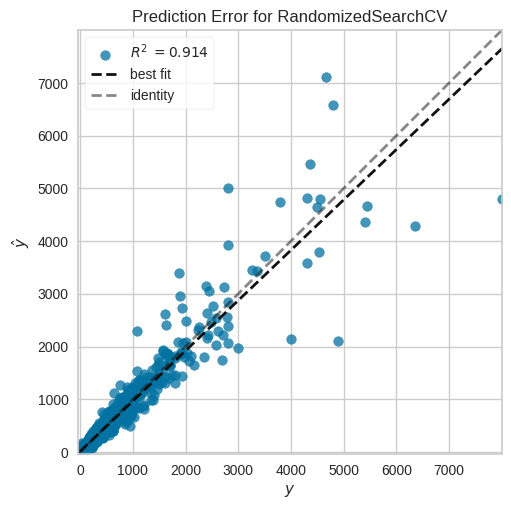

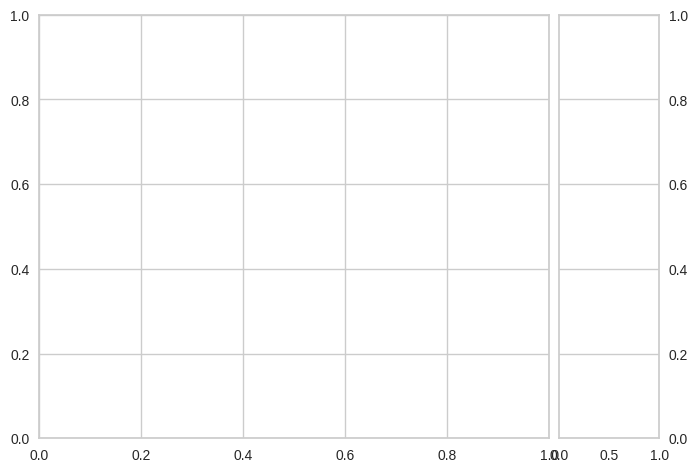

In [ ]:
param_grid =  {'loss': ['squared_error','absolute_error','huber','quantile'],
                'n_estimators': [100,400,700,1000],
                'learning_rate': [0.2,0.4,0.7,1],
                'criterion': ['friedman_mse','squared_error'],
                'max_features': ['auto','sqrt','log2']
                }

grid_gb = RandomizedSearchCV(GradientBoostingRegressor(),param_grid,verbose=4,cv=5)
train_and_evaluate_model(grid_gb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.7, n_estimators=700;, score=0.919 total time=   3.1s
[CV 2/5] END learning_rate=0.7, n_estimators=700;, score=0.900 total time=   1.6s
[CV 3/5] END learning_rate=0.7, n_estimators=700;, score=0.929 total time=   1.6s
[CV 4/5] END learning_rate=0.7, n_estimators=700;, score=0.907 total time=   1.6s
[CV 5/5] END learning_rate=0.7, n_estimators=700;, score=0.865 total time=   1.6s
[CV 1/5] END learning_rate=0.4, n_estimators=100;, score=0.919 total time=   0.3s
[CV 2/5] END learning_rate=0.4, n_estimators=100;, score=0.893 total time=   0.3s
[CV 3/5] END learning_rate=0.4, n_estimators=100;, score=0.899 total time=   0.3s
[CV 4/5] END learning_rate=0.4, n_estimators=100;, score=0.922 total time=   0.3s
[CV 5/5] END learning_rate=0.4, n_estimators=100;, score=0.914 total time=   0.3s
[CV 1/5] END learning_rate=0.7, n_estimators=100;, score=0.919 total time=   0.3s
[CV 2/5] END learning_rate=0.7, n_est

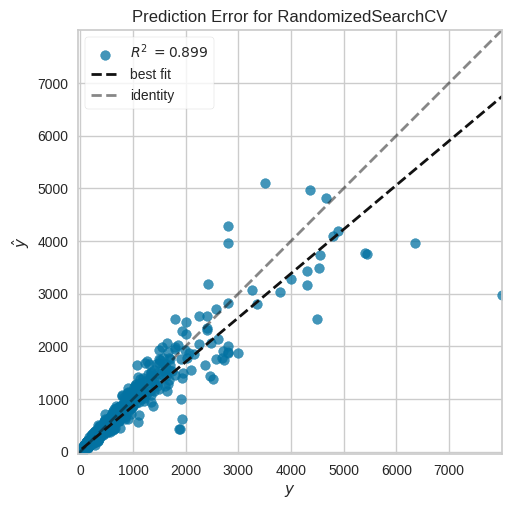

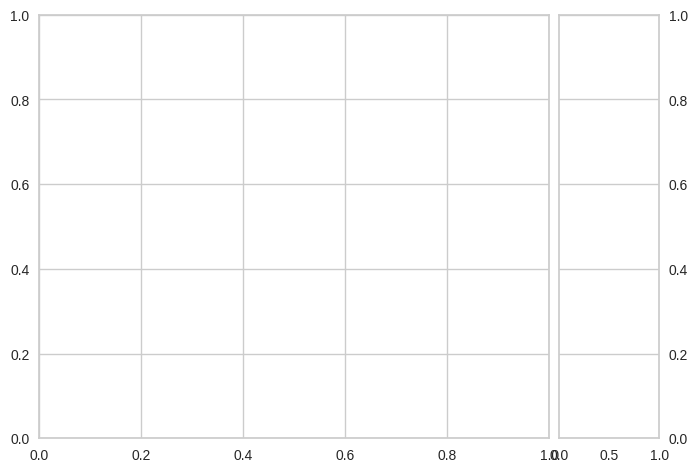

In [ ]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.7,1],
'n_estimators': [100,400,700,800,1000]
}

grid_cat = RandomizedSearchCV(CatBoostRegressor(silent=True),param_grid,verbose=5,cv=5)
train_and_evaluate_model(grid_cat)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 874
[LightGBM] [Info] Number of data points in the train set: 5592, number of used features: 9
[LightGBM] [Info] Start training from score 219.698098
[CV 1/5] END boosting_type=dart, importance_type=gain, learning_rate=0.8, min_split_gain=0.87, n_estimators=100;, score=0.860 total time=   0.6s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[Li

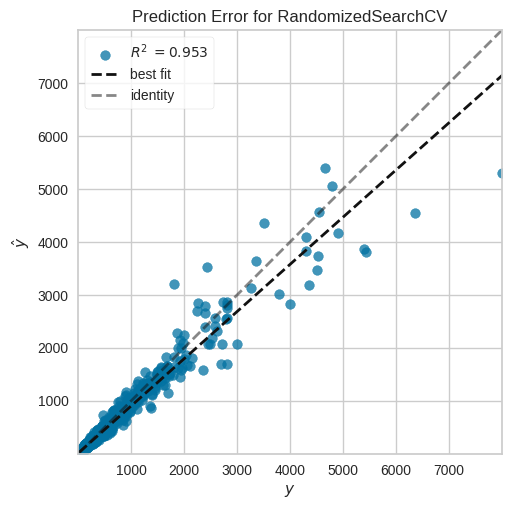

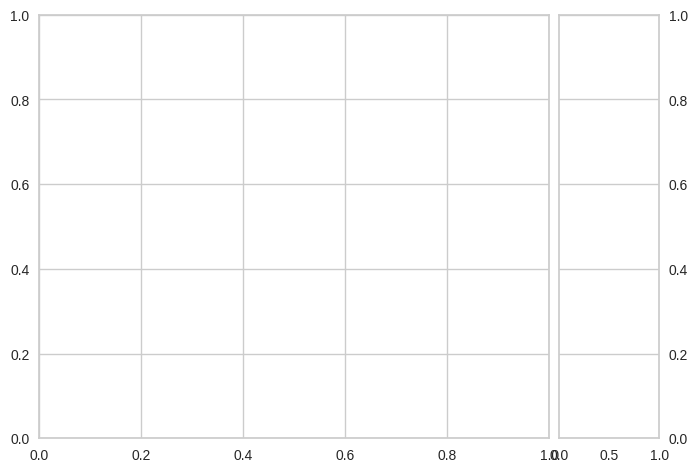

In [ ]:
param_grid = {'boosting_type': ['gbdt','dart','goss','rf'],
            'learning_rate': np.linspace(0,1,6)[1:],
            'n_estimators': [100,300,500,800,1000],
            'importance_type': ['split','gain'],
            'min_split_gain': [0.68,0.79,0.87,1]}

grid_lgbm = RandomizedSearchCV(LGBMRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_lgbm)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END booster=gbtree, grow_policy=0, importance_type=total_gain, learning_rate=0.1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 2/5] END booster=gbtree, grow_policy=0, importance_type=total_gain, learning_rate=0.1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 3/5] END booster=gbtree, grow_policy=0, importance_type=total_gain, learning_rate=0.1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 4/5] END booster=gbtree, grow_policy=0, importance_type=total_gain, learning_rate=0.1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 5/5] END booster=gbtree, grow_policy=0, importance_type=total_gain, learning_rate=0.1, n_estimators=1000, sampling_method=uniform;, score=nan total time=   0.0s
[CV 1/5] END booster=gbtree, grow_policy=0, importance_type=weight, learning_rate=1, n_estimators=400, sampling_me

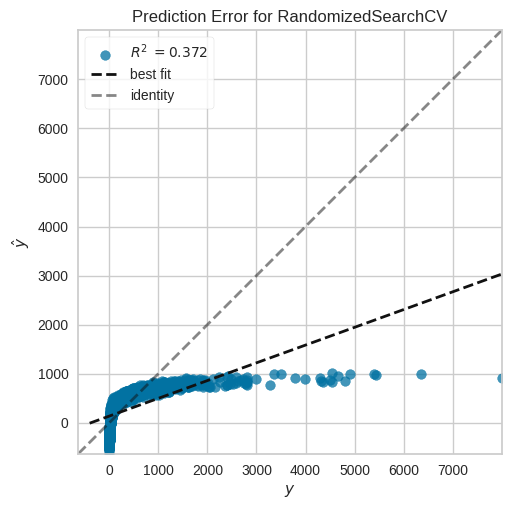

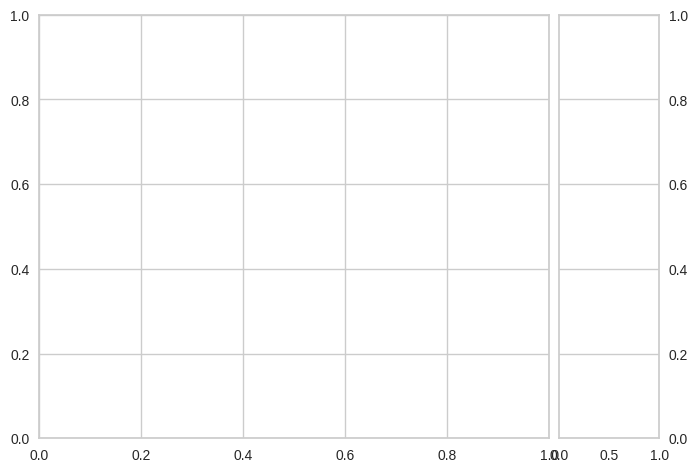

In [ ]:
param_grid = {'n_estimators': [100,400,700,1000],
        'grow_policy': [0,1],
        'learning_rate': [0.1,0.4,0.7,1],
        'booster': ['gbtree','gblinear','dart'],
        'sampling_method': ['uniform','gradient_based'],
        'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgb = RandomizedSearchCV(XGBRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_xgb)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END alpha=1, average=True, epsilon=44.44499999999999, l1_ratio=0.68, learning_rate=optimal, loss=huber, penalty=elasticnet, shuffle=True;, score=0.056 total time=   0.2s
[CV 2/5] END alpha=1, average=True, epsilon=44.44499999999999, l1_ratio=0.68, learning_rate=optimal, loss=huber, penalty=elasticnet, shuffle=True;, score=0.050 total time=   0.9s
[CV 3/5] END alpha=1, average=True, epsilon=44.44499999999999, l1_ratio=0.68, learning_rate=optimal, loss=huber, penalty=elasticnet, shuffle=True;, score=0.064 total time=   0.2s
[CV 4/5] END alpha=1, average=True, epsilon=44.44499999999999, l1_ratio=0.68, learning_rate=optimal, loss=huber, penalty=elasticnet, shuffle=True;, score=0.052 total time=   0.0s
[CV 5/5] END alpha=1, average=True, epsilon=44.44499999999999, l1_ratio=0.68, learning_rate=optimal, loss=huber, penalty=elasticnet, shuffle=True;, score=0.090 total time=   0.0s
[CV 1/5] END alpha=0.01, average=True, epsil

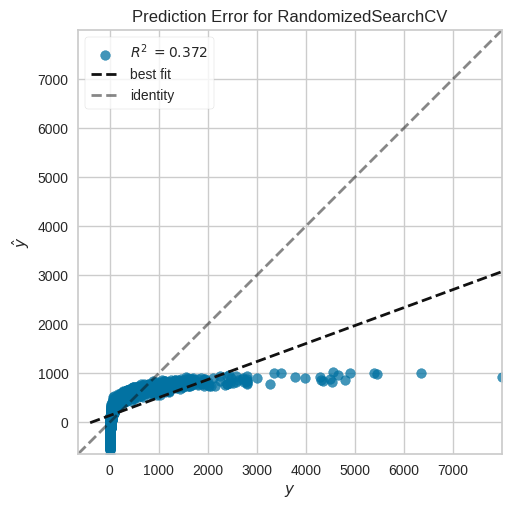

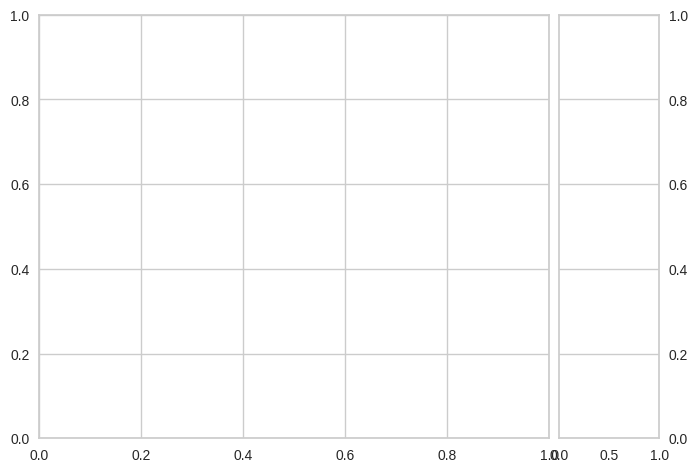

In [ ]:
param_grid = {
                'loss': ['squared_error','huber','epsilon_insensitive','squared_epsilon_insensitive'],
                'penalty': ['l2', 'l1', 'elasticnet'],
                'l1_ratio': [0.15,0.45,0.68,0.81,0.97],
                'alpha': [0.0001,0.001,0.01,0.1,1],
                'shuffle': [True,False],
                'learning_rate': ['adaptive','constant','optimal','invscaling'],
                'epsilon': np.linspace(0.001,100,10),
                'average': [True,False]
             }

grid_sgd = RandomizedSearchCV(SGDRegressor(),param_grid,verbose=3,cv=5)
train_and_evaluate_model(grid_sgd)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..........................alpha=8.8889, epsilon=6.0; total time=   0.0s
[CV] END ..........................alpha=8.8889, epsilon=6.0; total time=   0.1s
[CV] END ..........................alpha=8.8889, epsilon=6.0; total time=   0.0s
[CV] END ..........................alpha=8.8889, epsilon=6.0; total time=   0.0s
[CV] END ..........................alpha=8.8889, epsilon=6.0; total time=   0.0s
[CV] END .........................alpha=8.8889, epsilon=10.0; total time=   0.0s
[CV] END .........................alpha=8.8889, epsilon=10.0; total time=   0.0s
[CV] END .........................alpha=8.8889, epsilon=10.0; total time=   0.0s
[CV] END .........................alpha=8.8889, epsilon=10.0; total time=   0.0s
[CV] END .........................alpha=8.8889, epsilon=10.0; total time=   0.0s
[CV] END ..........................alpha=1.1112, epsilon=9.0; total time=   0.0s
[CV] END ..........................alpha=1.1112,

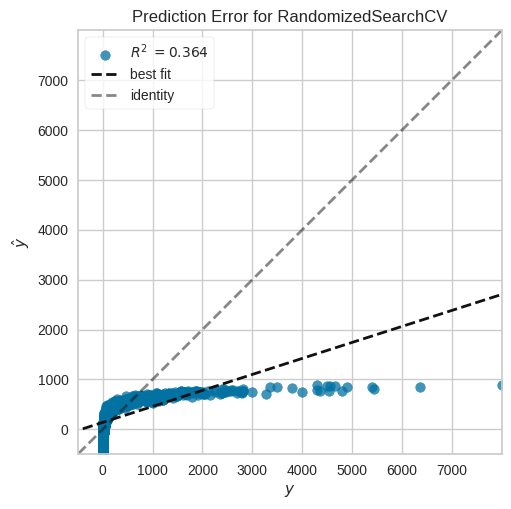

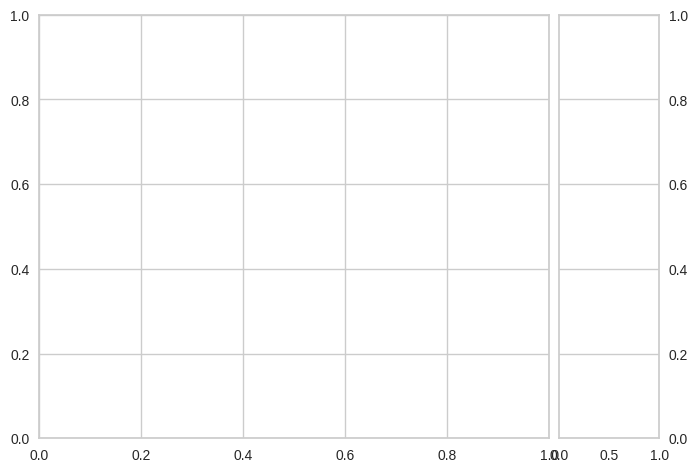

In [ ]:
param_grid = {'epsilon': np.linspace(1,10,10),
'alpha': np.linspace(0.0001,10,10)}

grid_huber = RandomizedSearchCV(HuberRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_huber)

In [ ]:
param_grid = {'link': ['auto', 'identity', 'log'],
'solver': ['lbfgs', 'newton-cholesky'],
'alpha': np.linspace(0.0001,10,10)}

grid_tweedie = RandomizedSearchCV(TweedieRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_tweedie)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=3.3334, link=identity, solver=newton-cholesky; total time=   0.0s
[CV] END alpha=3.3334, link=identity, solver=newton-cholesky; total time=   0.0s
[CV] END alpha=3.3334, link=identity, solver=newton-cholesky; total time=   0.0s
[CV] END alpha=3.3334, link=identity, solver=newton-cholesky; total time=   0.0s
[CV] END alpha=3.3334, link=identity, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=4.4445, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=4.4445, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=4.4445, link=log, solver=newton-cholesky; total time=   0.0s
[CV] END .....alpha=4.4445, link=log, solver=newton-cholesky; total time=   0.1s
[CV] END .....alpha=4.4445, link=log, solver=newton-cholesky; total time=   0.1s
[CV] END ...............alpha=6.6667, link=log, solver=lbfgs; total time=   0.0s
[CV] END ...............alpha=6.6667, link=log, 

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.1, average=False, epsilon=0.5005, loss=epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.1, average=False, epsilon=0.5005, loss=epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.1, average=False, epsilon=0.5005, loss=epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.1, average=False, epsilon=0.5005, loss=epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=0.1, average=False, epsilon=0.5005, loss=epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=1, average=False, epsilon=0.75025, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=1, average=False, epsilon=0.75025, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=1, average=False, epsilon=0.75025, loss=squared_epsilon_insensitive, shuffle=False; total time=   0.0s
[CV] END C=1, average=False, epsilon=0.75025, loss=squared_eps

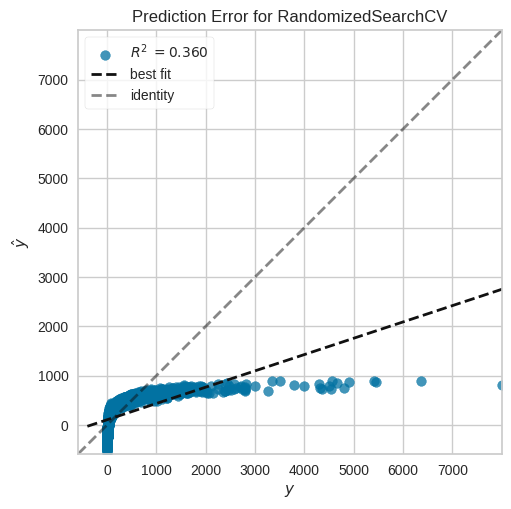

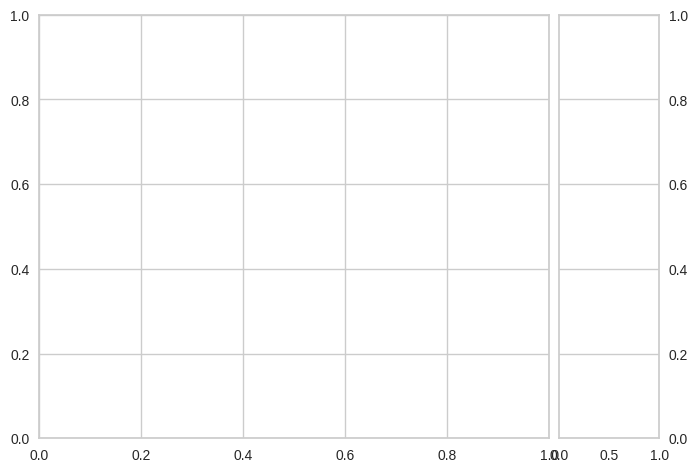

In [ ]:
param_grid = {'C': [0.0001,0.001,0.01,0.1,1,10],
            'loss': ['epsilon_insensitive','squared_epsilon_insensitive'],
            'epsilon': np.linspace(0.001,1,5),
            'shuffle': [True,False],
            'average': [True,False]}

grid_pa = RandomizedSearchCV(PassiveAggressiveRegressor(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_pa)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.001, fit_intercept=False, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=True, selection=cyclic; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, positive=True, selection=cyclic; total time=  

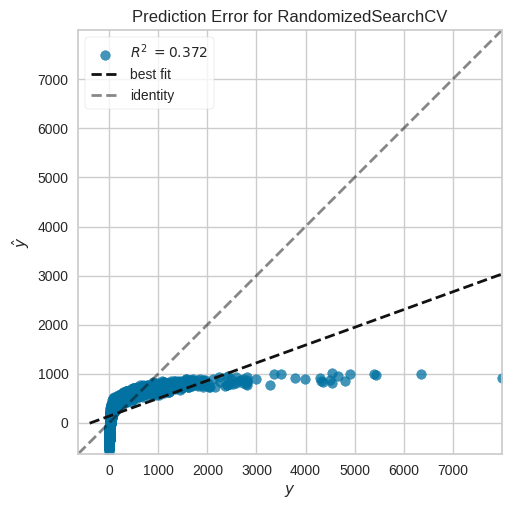

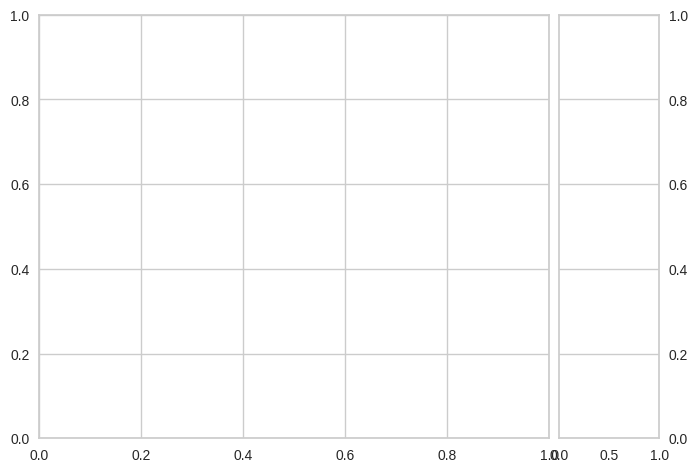

In [ ]:
param_grid = {
            'alpha': [0.001,0.01,0.1],
            'positive': [True,False],
            'selection': ['cyclic','random'],
            'fit_intercept': [True,False]
}

grid_lasso = RandomizedSearchCV(Lasso(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lasso)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.1, fit_intercept=False, positive=False, solver=svd; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, solver=svd; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, solver=svd; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, solver=svd; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, positive=False, solver=svd; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=True, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=True, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=True, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=True, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=True, solver=lbfgs; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=True, positive=False, sol

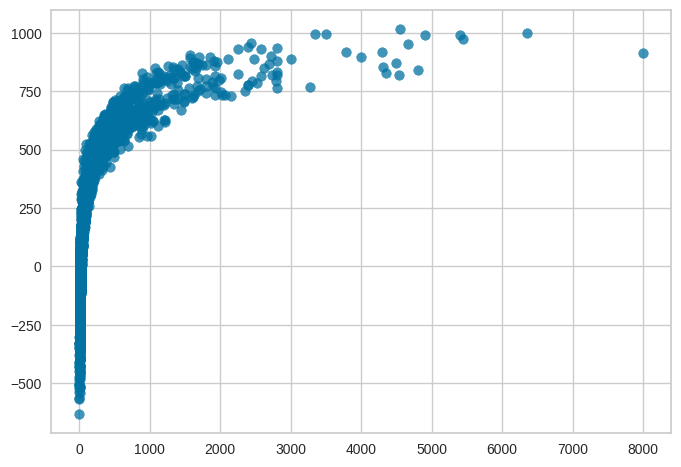

In [ ]:
param_grid = {
            'alpha': [0.001,0.01,0.1],
            'positive': [True,False],
            'fit_intercept': [True,False],
            'solver': ['svd','cholesky','lsqr','sparse_cg','sag','saga','lbfgs']
}

grid_ridge = RandomizedSearchCV(Ridge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ridge)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.5, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.5, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.5, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.5, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.1, fit_intercept=False, l1_ratio=0.5, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=0.1, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=0.1, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=0.1, positive=True, selection=random; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=False, l1_ratio=0.1, positive=True, selec

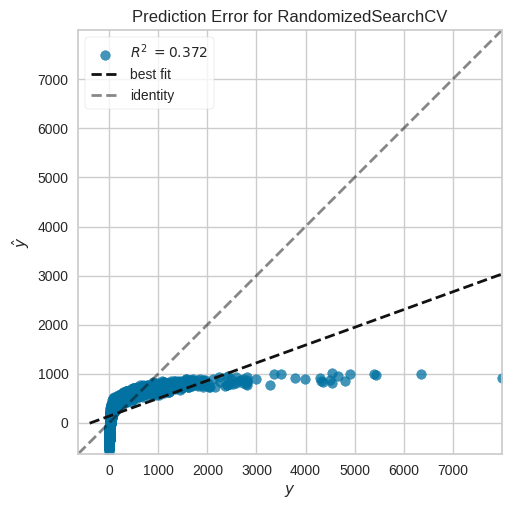

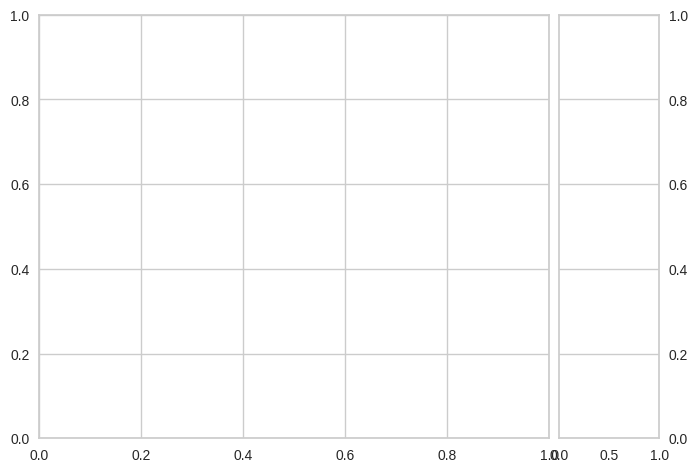

In [ ]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'selection': ['cyclic','random'],
    'l1_ratio': [0.1,0.3,0.5,0.8,1],
    'positive': [True,False],
    'fit_intercept': [True,False]
}

grid_elasticnet = RandomizedSearchCV(ElasticNet(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_elasticnet)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-06, alpha_2=1e-07, compute_score=False, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-07, compute_score=False, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-07, compute_score=False, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-06, alpha_2=1e-07, compute_score=False, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-07; total time=   0.1s
[CV] END alpha_1=1e-06, alpha_2=1e-07, compute_score=False, fit_intercept=True, lambda_1=1e-05, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-05, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-05; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-05; total time=   0.1s
[CV] END alpha_1=1e-

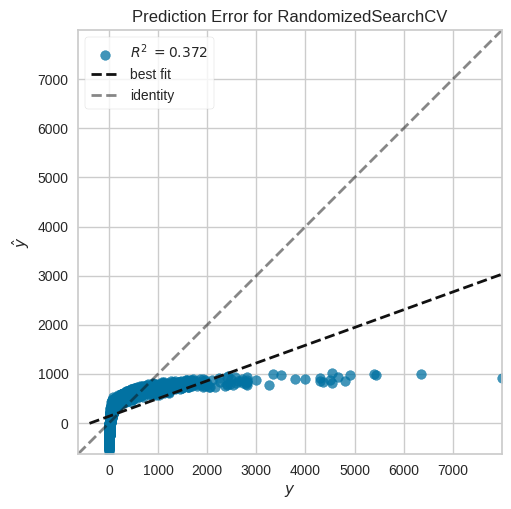

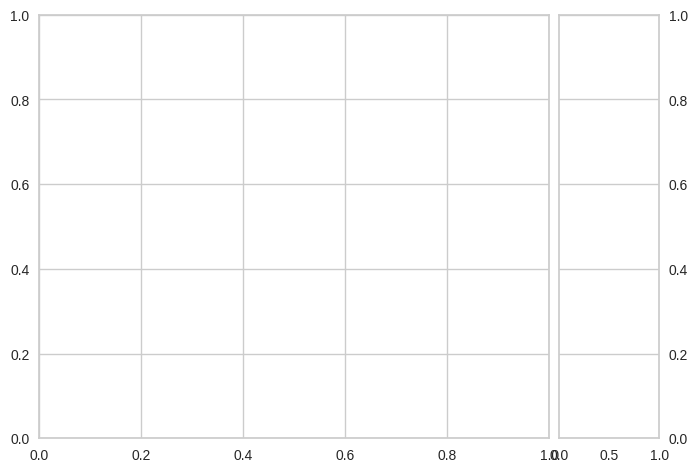

In [ ]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
'alpha_2': [1e-5,1e-6,1e-7,1e-8],
'lambda_1': [1e-5,1e-6,1e-7,1e-8],
'lambda_2': [1e-5,1e-6,1e-7,1e-8],
'fit_intercept': [True,False],
'compute_score': [True,False]}

grid_ard = RandomizedSearchCV(ARDRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_ard)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END ..................fit_intercept=True, positive=True; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.1s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=True, positive=False; total time=   0.0s
[CV] END .................fit_intercept=False, positive=True; total time=   0.0s
[CV] END .................fit_intercept=False, po

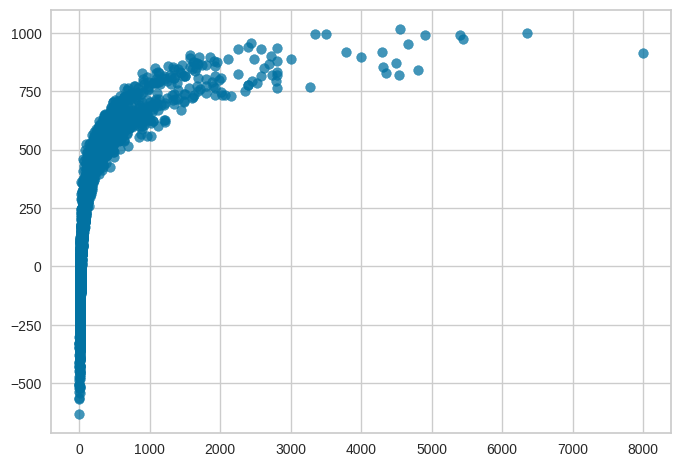

In [ ]:
param_grid = {'fit_intercept': [True,False],
'positive': [True,False]}

grid_lr = RandomizedSearchCV(LinearRegression(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_lr)

In [ ]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_poisson = RandomizedSearchCV(estimator=PoissonRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_poisson)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.01, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=newton-cholesky, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=lbfgs, warm_start=True; total time=   0.0s
[CV] END alpha=0.001, fit_intercept=True, solver=lbfgs, warm_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END loss=squared_error, min_samples=0.5, stop_probability=1.0; total time=   1.0s
[CV] END loss=squared_error, min_samples=0.5, stop_probability=1.0; total time=   1.0s
[CV] END loss=squared_error, min_samples=0.5, stop_probability=1.0; total time=   1.0s
[CV] END loss=squared_error, min_samples=0.5, stop_probability=1.0; total time=   2.0s
[CV] END loss=squared_error, min_samples=0.5, stop_probability=1.0; total time=   2.1s
[CV] END loss=absolute_error, min_samples=0.5, stop_probability=0.5; total time=   1.5s
[CV] END loss=absolute_error, min_samples=0.5, stop_probability=0.5; total time=   1.1s
[CV] END loss=absolute_error, min_samples=0.5, stop_probability=0.5; total time=   0.8s
[CV] END loss=absolute_error, min_samples=0.5, stop_probability=0.5; total time=   0.9s
[CV] END loss=absolute_error, min_samples=0.5, stop_probability=0.5; total time=   1.0s
[CV] END loss=absolute_error, min_samples=0.75, stop_probability

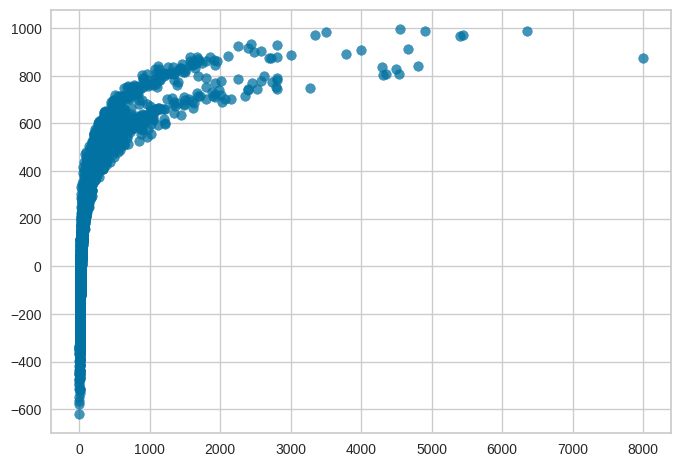

In [ ]:
param_grid = {
    'stop_probability': np.linspace(0,1,5),
    'loss': ['absolute_error','squared_error'],
    'min_samples': np.linspace(0,1,5)[1:]
}

grid_ransac = RandomizedSearchCV(estimator=RANSACRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ransac)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=False, criterion=squared_error, max_features=log2, max_samples=0.5, n_estimators=200, oob_score=False, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, criterion=squared_error, max_features=log2, max_samples=0.5, n_estimators=200, oob_score=False, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, criterion=squared_error, max_features=log2, max_samples=0.5, n_estimators=200, oob_score=False, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, criterion=squared_error, max_features=log2, max_samples=0.5, n_estimators=200, oob_score=False, warm_start=False; total time=   0.0s
[CV] END bootstrap=False, criterion=squared_error, max_features=log2, max_samples=0.5, n_estimators=200, oob_score=False, warm_start=False; total time=   0.0s
[CV] END bootstrap=True, criterion=squared_error, max_features=log2, max_samples=0.75, n_estimators=200, oob_score=False, warm_start=False; tota

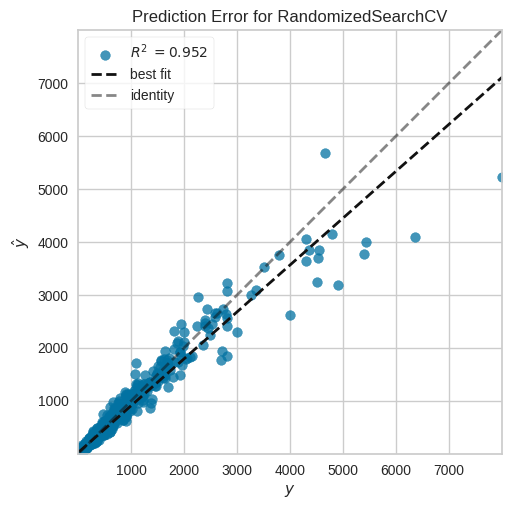

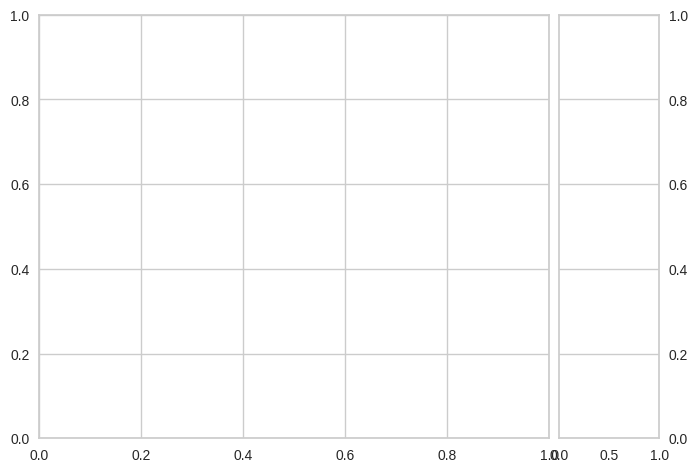

In [ ]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'warm_start': [True,False],
    'max_samples': [0.25,0.5,0.75,1.0]
}

grid_rf = RandomizedSearchCV(estimator=RandomForestRegressor(),param_distributions=param_grid,verbose=2,return_train_score=True,scoring='r2')
train_and_evaluate_model(grid_rf)

In [ ]:
param_grid = {
    'alpha': [0.001,0.01,0.1],
    'fit_intercept': [True,False],
    'solver': ['lbfgs','newton-cholesky'],
    'warm_start': [True,False]
}

grid_gamma = RandomizedSearchCV(estimator=GammaRegressor(),param_distributions=param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_gamma)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha=0.01, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=False, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha=0.01, fit_intercept=True, solver=lbfgs, warm_start=False; total time=   0.0s
[CV] END alpha

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.01, degree=1, epsilon=0.001, gamma=scale, kernel=poly, shrinking=True; total time=   1.9s
[CV] END C=0.01, degree=1, epsilon=0.001, gamma=scale, kernel=poly, shrinking=True; total time=   2.6s
[CV] END C=0.01, degree=1, epsilon=0.001, gamma=scale, kernel=poly, shrinking=True; total time=   3.0s
[CV] END C=0.01, degree=1, epsilon=0.001, gamma=scale, kernel=poly, shrinking=True; total time=   1.9s
[CV] END C=0.01, degree=1, epsilon=0.001, gamma=scale, kernel=poly, shrinking=True; total time=   1.8s
[CV] END C=10, degree=4, epsilon=0.001, gamma=scale, kernel=linear, shrinking=True; total time=   1.8s
[CV] END C=10, degree=4, epsilon=0.001, gamma=scale, kernel=linear, shrinking=True; total time=   1.7s
[CV] END C=10, degree=4, epsilon=0.001, gamma=scale, kernel=linear, shrinking=True; total time=   1.7s
[CV] END C=10, degree=4, epsilon=0.001, gamma=scale, kernel=linear, shrinking=True; total time=   2.7s
[CV] END C=1

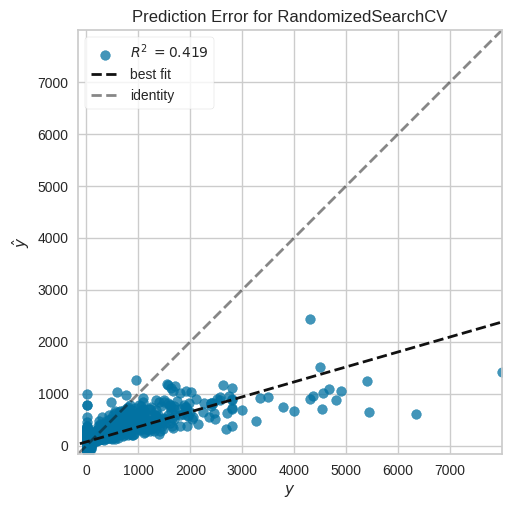

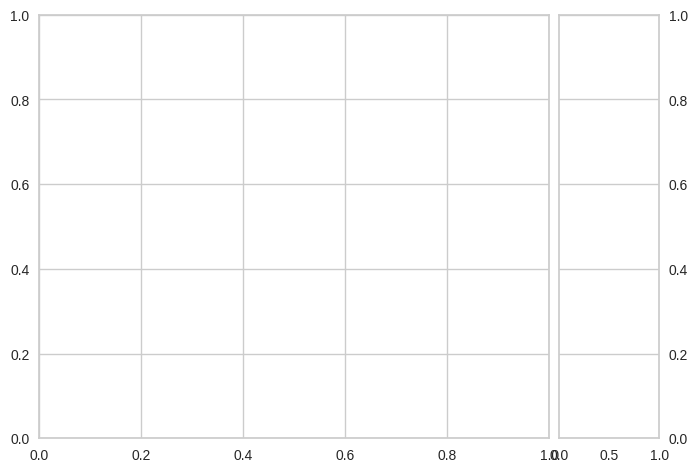

In [ ]:
param_grid = {
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'C': [0.01,0.1,1,10],
    'gamma': ['scale','auto'],
    'shrinking': [True,False],
    'epsilon': [0.001,0.01,0.1,1]
}

grid_svr = RandomizedSearchCV(estimator=SVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_svr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=1, degree=1, kernel=linear, nu=0.1, shrinking=False; total time=   0.4s
[CV] END C=1, degree=1, kernel=linear, nu=0.1, shrinking=False; total time=   0.4s
[CV] END C=1, degree=1, kernel=linear, nu=0.1, shrinking=False; total time=   0.4s
[CV] END C=1, degree=1, kernel=linear, nu=0.1, shrinking=False; total time=   0.4s
[CV] END C=1, degree=1, kernel=linear, nu=0.1, shrinking=False; total time=   0.4s
[CV] END C=10, degree=4, kernel=sigmoid, nu=0.1, shrinking=False; total time=   0.6s
[CV] END C=10, degree=4, kernel=sigmoid, nu=0.1, shrinking=False; total time=   0.6s
[CV] END C=10, degree=4, kernel=sigmoid, nu=0.1, shrinking=False; total time=   0.6s
[CV] END C=10, degree=4, kernel=sigmoid, nu=0.1, shrinking=False; total time=   0.6s
[CV] END C=10, degree=4, kernel=sigmoid, nu=0.1, shrinking=False; total time=   0.6s
[CV] END C=1, degree=4, kernel=poly, nu=0.01, shrinking=False; total time=   0.1s
[CV] END C=1, deg

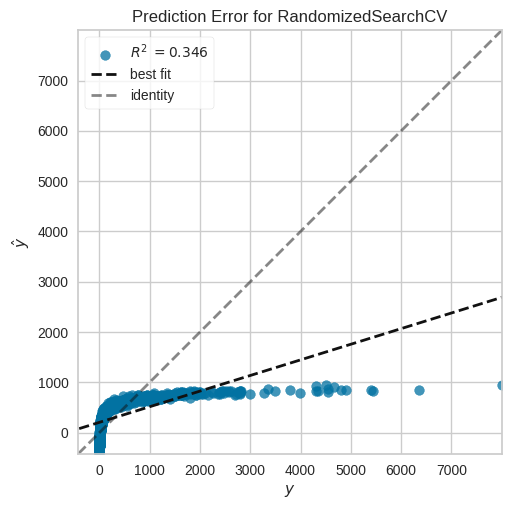

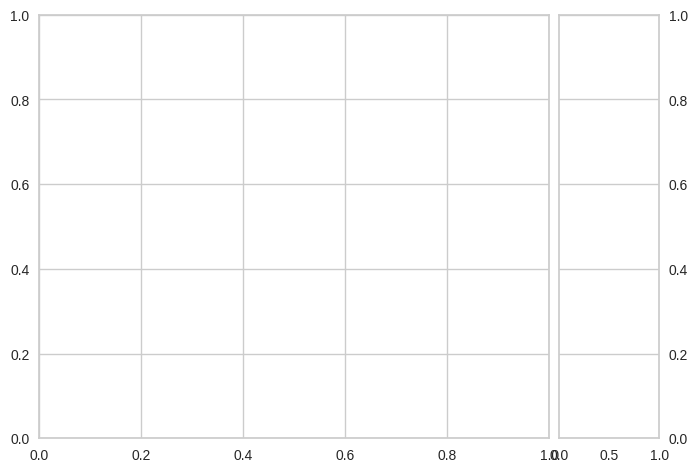

In [ ]:
param_grid = {
    'nu': [0.001,0.01,0.1,0.5,1],
    'C': [0.1,1,10],
    'kernel': ['linear','poly','rbf','sigmoid'],
    'degree': [1,2,3,4],
    'shrinking': [True,False]
}

grid_nusvr = RandomizedSearchCV(estimator=NuSVR(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_nusvr)

In [ ]:
param_grid = {
    'fit_intercept': [True,False],
    'copy_X': [True,False],
    'max_subpopulation': [1,10,100,1000,10000,100000],
    'n_subsamples': [300,500,753,None]
}

grid_tsr = RandomizedSearchCV(estimator=TheilSenRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_tsr)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100000, n_subsamples=500; total time=  31.9s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100000, n_subsamples=500; total time=  25.7s
[CV] END copy_X=True, fit_intercept=False, max_subpopulation=100000, n_subsamples=500; total time=  25.5s


KeyboardInterrupt: 

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END alpha_1=1e-08, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-07; total time=   0.1s
[CV] END alpha_1=1e-08, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-07; total time=   0.1s
[CV] END alpha_1=1e-08, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-08, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-07; total time=   0.0s
[CV] END alpha_1=1e-08, alpha_2=1e-08, compute_score=True, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-07; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-05; total time=   0.1s
[CV] END alpha_1=1e-05, alpha_2=1e-06, compute_score=False, fit_intercept=False, lambda_1=1e-08, lambda_2=1e-05; total time=   0.0s
[CV] END alpha_1=1e-

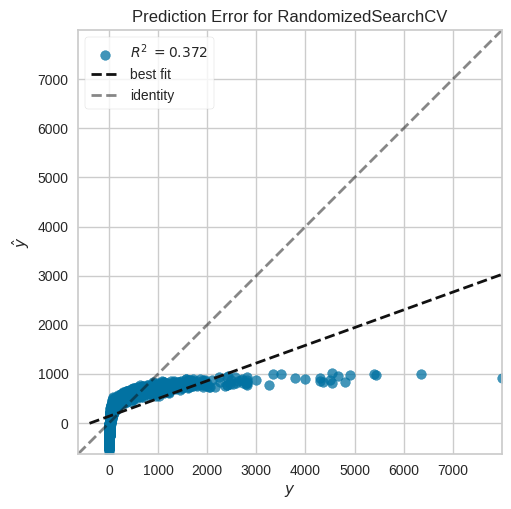

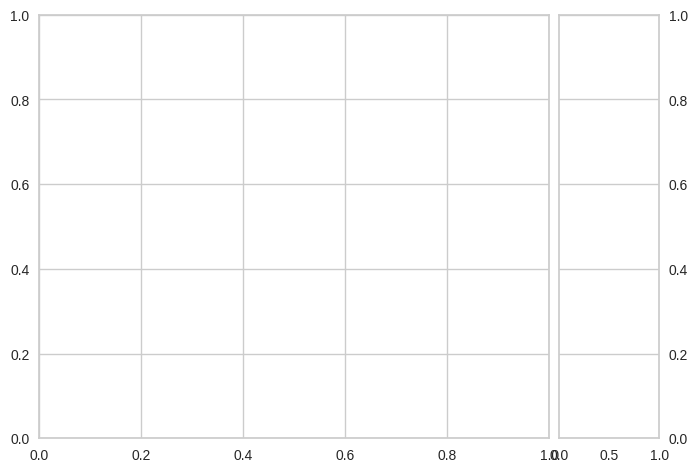

In [ ]:
param_grid = {'alpha_1': [1e-5,1e-6,1e-7,1e-8],
'alpha_2': [1e-5,1e-6,1e-7,1e-8],
'lambda_1': [1e-5,1e-6,1e-7,1e-8],
'lambda_2': [1e-5,1e-6,1e-7,1e-8],
'fit_intercept': [True,False],
'compute_score': [True,False]
             }

grid_bayesian_ridge = RandomizedSearchCV(BayesianRidge(),param_grid,verbose=2,cv=5)
train_and_evaluate_model(grid_bayesian_ridge)

In [ ]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'loss': ['linear','square','exponential']
}

grid_ab = RandomizedSearchCV(estimator=AdaBoostRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_ab)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..learning_rate=0.01, loss=linear, n_estimators=500; total time=   6.0s
[CV] END ..learning_rate=0.01, loss=linear, n_estimators=500; total time=   5.6s
[CV] END ..learning_rate=0.01, loss=linear, n_estimators=500; total time=   6.6s
[CV] END ..learning_rate=0.01, loss=linear, n_estimators=500; total time=   5.4s


KeyboardInterrupt: 

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=False, criterion=poisson, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=False, criterion=poisson, max_features=auto, max_samples=0.9, n_estimators=1000, oob_score=True; total time=   0.0s
[CV] END bootstrap=True, criterion=absolute_error, max_features=sqrt, max_samples=1, n_estimators=1000, oob_score=True; total time=   1.9s
[CV] END bootstrap=True, criterion=absolute_error, max_features=sqrt, max_samples=1, n_estimators=1000, oob_score=True; total

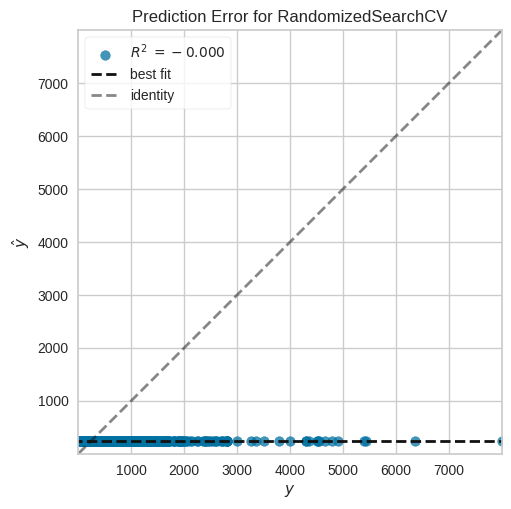

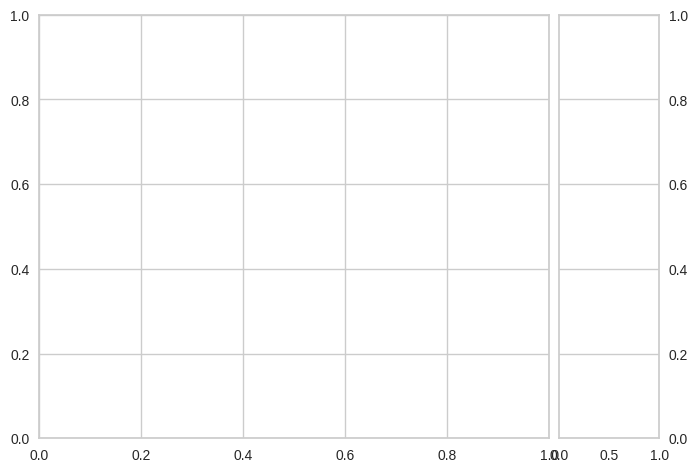

In [ ]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'criterion': ['squared_error','absolute_error','friedman_mse','poisson'],
    'max_features': ['auto','sqrt','log2'],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'max_samples': [0.5,0.75,0.9,1]
}

grid_et = RandomizedSearchCV(estimator=ExtraTreesRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_et)

In [ ]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'learning_rate': [0.001,0.01,0.1,1],
    'booster': ['gbtree','dart','gblinear'],
    'importance_type': ['gain','weight','cover','total_gain','total_cover']
}

grid_xgbrf = RandomizedSearchCV(estimator=XGBRFRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_xgbrf)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END booster=dart, importance_type=cover, learning_rate=0.1, n_estimators=1000; total time=   1.6s
[CV] END booster=dart, importance_type=cover, learning_rate=0.1, n_estimators=1000; total time=   1.6s
[CV] END booster=dart, importance_type=cover, learning_rate=0.1, n_estimators=1000; total time=   1.6s
[CV] END booster=dart, importance_type=cover, learning_rate=0.1, n_estimators=1000; total time=   1.6s


KeyboardInterrupt: 

In [ ]:
param_grid = {
    'n_estimators': [200,500,800,1000],
    'max_samples': [0.25,0.5,0.75,1],
    'max_features': [0.5,0.65,0.85,1],
    'bootstrap': [True,False],
    'oob_score': [True,False],
    'bootstrap_features': [True,False],
    'warm_start': [True,False]
}

grid_bag = RandomizedSearchCV(estimator=BaggingRegressor(),param_distributions=param_grid,cv=5,verbose=2)
train_and_evaluate_model(grid_bag)

## Optimized Models Performance Comparison

In [ ]:
model_perfs = pd.DataFrame({'Model': models,
                            'R2': r2_scores,
                            'RMSE': rmse_scores,
                            'MAPE': mape_scores,
                            'MSE': mse_scores,
                            'Training Time': training_times}).sort_values('R2',ascending=False).reset_index(drop=True)

#export to csv


',Model,R2,RMSE,MAPE,MSE,Training Time\n0,ExtraTreesRegressor(),0.9619763855462526,101.09011964223791,0.07573286527700562,10219.212289281973,2.8601226806640625\n1,LGBMRegressor(),0.9551985209480273,109.73070957615737,0.15609367079443184,12040.828624086993,0.1669766902923584\n2,<catboost.core.CatBoostRegressor object at 0x7fc9980f3400>,0.9532532839982316,112.08759866079605,0.17723747581474805,12563.629773543687,4.641543626785278\n3,"RandomizedSearchCV(cv=5, estimator=LGBMRegressor(),\n                   param_distributions={\'boosting_type\': [\'gbdt\', \'dart\',\n                                                          \'goss\', \'rf\'],\n                                        \'importance_type\': [\'split\', \'gain\'],\n                                        \'learning_rate\': array([0.2, 0.4, 0.6, 0.8, 1. ]),\n                                        \'min_split_gain\': [0.68, 0.79, 0.87, 1],\n                                        \'n_estimators\': [100, 300, 500, 800,\n         

In [ ]:
model_perfs.to_csv('df.csv')
files.download('df.csv')

NameError: name 'files' is not defined

In [ ]:
print(model_perfs[:1]['Model'])

0    (ExtraTreeRegressor(random_state=486601332), E...
Name: Model, dtype: object


Even after tuning the hyperparameters of all the models, the Extra Trees Regressor model stays intact as the best performing model with an outstanding R2 score of more than 97.6%.

## Saving the best performing model for deployment into production

In [ ]:
best_model = model_perfs['Model'].iloc[0]
best_model

In [ ]:
pipeline = Pipeline(steps=[
        ('transformer',transformer),
        ('scaler',scaler),
        ('model',best_model)
])
pipeline

In [ ]:
joblib.dump(pipeline,'pipeline.pkl')

In [ ]:
joblib.load('pipeline.pkl')

In [ ]:
for col in final_X_train.columns:
    print(f"Min value of {col}:",df[col].min())
    print(f"Max value of {col}:",df[col].max())

In [ ]:
list(final_X_train.columns)

### Making a test prediction

In [ ]:
pipeline.predict(pd.DataFrame([[3846.91,79.42479138,5937,0.5,8.0,5.0,9.0,6293.46,29.0,3.0]],columns=list(final_X_train.columns)))

In [ ]:
gc.collect()

In [ ]:
import sklearn
print(sklearn.__version__)